# Credit EDA Assignment

## Understanding

### Problem Statement
* The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it to their advantage by becoming a defaulter.
* Use EDA to analyse the patterns present in the data
* Ensure that the applicants capable of repaying the loan are not rejected
* Two types of risks are associated with the bank’s decision of loan approval based on the applicant’s profile:
    * If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
    * If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.

### Scenario and Decision
* The data given below contains the information about the loan application at the time of applying for the loan. It contains two types of scenarios:
    * <b>The client with payment difficulties</b>
        * he/she had late payment more than X days on at least one of the first Y instalments of the loan in our sample,
    * <b>All other cases</b>
        * All other cases when the payment is paid on time.
* When a client applies for a loan, there are four types of decisions that could be taken:
    * <b>Approved</b>
        * The Company has approved loan Application
    * <b>Cancelled</b>
        * The client cancelled the application sometime during approval. Either the client changed her/his mind about the loan or in some cases due to a higher risk of the client, he received worse pricing which he did not want.
    * <b>Refused</b>
        * The company had rejected the loan (because the client does not meet their requirements etc.).
    * <b>Unused offer</b>
        * Loan has been cancelled by the client but at different stages of the process.
* In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency to default.

### Business Objectives
* To identify patterns which indicate if a client has difficulty paying their instalments
    * Action based on patterns such as
        * Denying the loan
        * Reducing the amount of loan
        * Lending (to risky applicants) at a higher interest rate, etc.
    * Ensure that the consumers capable of repaying the loan are not rejected
    * Identification of applicants that are capable of repaying using EDA is the aim of this case study
* Understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.
    * The company can utilise this knowledge for its portfolio and risk assessment.
    * To develop your understanding of the domain, you are advised to independently research a little about risk analytics - understanding the types of variables and their significance should be enough.

### Understanding – Data Sets
* Dataset has 3 files as explained below: 
    * 'application_data.csv’
        * contains all the information of the client at the time of application.
        * The data is about whether a <b>client has payment difficulties</b>.
    * 'previous_application.csv’
        * contains information about the client’s previous loan data.
        * It contains the data on whether the <b>previous application had been Approved, Cancelled, Refused or Unused offer</b>.
    * 'columns_description.csv’
        * is data dictionary which describes the meaning of the variables.

### Understanding – Columns Description
* This file contains description of columns for two data sets: -
    * Application Data
    * Previous Application
* OBSERTATIONS:
    * First Unnamed Column is being ignored, assumed it to serial number (however, not in order).
    * At line number 136, with following entry details:
        * Table	- previous_application.csv
        * Row	- NFLAG_MICRO_CASH and 
        * Description	- Flag Micro finance loan

This column is not present in file previous_application.csv, ignoring it.

# Import and Data Loading

### Suppress Warnings

In [1]:
import warnings
warnings.filterwarnings("ignore")

### Imports

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl

import seaborn as sns

### Main libraries versions checking

In [3]:
if np.__version__ != "1.23.5":
    print()
    print('"NUMPY VERSION MISMATCH"')
    print("This code is written with Numpy version : 1.23.5.")
    print("This Environment uses Numpy version : " + np.__version__ + ". Few of functionalities maynot work or may work differently.")
    print()

if pd.__version__ != "1.5.3":
    print()
    print('"PANDAS VERSION MISMATCH"')
    print("This code is written with Pandas version : 1.5.3.")
    print("This Environment uses Pandas version : " + pd.__version__ + ". Few of functionalities maynot work or may work differently.")
    print()

if mpl.__version__ != "3.7.0":
    print()
    print('"MATPLOTLIB VERSION MISMATCH"')
    print("This code is written with Matplotlib version : 3.7.0.")
    print("This Environment uses Matplotlib version : " + mpl.__version__ + ". Few of functionalities maynot work or may work differently.")
    print()
    
if sns.__version__ != "0.12.2":
    print()
    print('"SEABORN VERSION MISMATCH"')
    print("This code is written with Seaborn version : 0.12.2.")
    print("This Environment uses Seaborn version is : " + sns.__version__ + ". Few of functionalities maynot work or may work differently.")
    print()

### Adjusting Display
As number of columns are high in datasets, so ajusting maximum number of rows and columns to be displayed to 250 and ALL columns

In [4]:
pd.options.display.max_rows = 250
pd.options.display.max_columns = None

### Loading datasets

In [5]:
inp_appl = pd.read_csv("application_data.csv")
inp_prev = pd.read_csv("previous_application.csv")

# Basic Data understanding

In [6]:
inp_appl.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [7]:
inp_prev.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
print(inp_appl.shape)
print(inp_prev.shape)

(307511, 122)
(1670214, 37)


In [9]:
inp_appl.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [10]:
inp_prev.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

# <font color='#00008B'>Missing Values</font>

## Missing Values Identification - application data

In [11]:
# Missing values in percentage for application_data
df_val = inp_appl.isnull().sum()/inp_appl.shape[0]*100
df_val[df_val > 0].sort_values(ascending=False)

COMMONAREA_MEDI                 69.872297
COMMONAREA_AVG                  69.872297
COMMONAREA_MODE                 69.872297
NONLIVINGAPARTMENTS_MEDI        69.432963
NONLIVINGAPARTMENTS_MODE        69.432963
NONLIVINGAPARTMENTS_AVG         69.432963
FONDKAPREMONT_MODE              68.386172
LIVINGAPARTMENTS_MODE           68.354953
LIVINGAPARTMENTS_MEDI           68.354953
LIVINGAPARTMENTS_AVG            68.354953
FLOORSMIN_MODE                  67.848630
FLOORSMIN_MEDI                  67.848630
FLOORSMIN_AVG                   67.848630
YEARS_BUILD_MODE                66.497784
YEARS_BUILD_MEDI                66.497784
YEARS_BUILD_AVG                 66.497784
OWN_CAR_AGE                     65.990810
LANDAREA_AVG                    59.376738
LANDAREA_MEDI                   59.376738
LANDAREA_MODE                   59.376738
BASEMENTAREA_MEDI               58.515956
BASEMENTAREA_AVG                58.515956
BASEMENTAREA_MODE               58.515956
EXT_SOURCE_1                    56

<b>NOTE: Missing values in application data</b>
* <b>High missing values (> 30%): </b>
    * Normalized average/mode/median indices about building and Normalized mode indices about building-II, i.e. appl_buld_avg, appl_buld_mode, appl_buld_medi, appl_buld_mode2
    * OWN_CAR_AGE
    * EXT_SOURCE_1
    * OCCUPATION_TYPE
* <b>Medium missing values (10% to 30%): </b>
    * EXT_SOURCE_3
    * Number of enquiries to Credit Bureau about the client (appl_bure_eqry)
* <b>Low missing values: </b>
    * NAME_TYPE_SUITE
    * OBS_30_CNT_SOCIAL_CIRCLE
    * DEF_30_CNT_SOCIAL_CIRCLE
    * OBS_60_CNT_SOCIAL_CIRCLE
    * DEF_60_CNT_SOCIAL_CIRCLE
    * EXT_SOURCE_2
    * AMT_GOODS_PRICE
    * AMT_ANNUITY
    * CNT_FAM_MEMBERS
    * DAYS_LAST_PHONE_CHANGE

## Handling missing values - application data

### High missing values

#### <b><font color='blue'>Approach - Drop selective columns with high missing data:</font></b>
Although there are more columns that have high missing value, however, while dropping any column its relavence is considered. Dropping columns with >30% missing values, other than 'OWN_CAR_AGE', 'EXT_SOURCE_1' and 'OCCUPATION_TYPE'

In [12]:
inp_appl.drop(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_AVG', 
                'FONDKAPREMONT_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAPARTMENTS_AVG', 'FLOORSMIN_AVG', 'FLOORSMIN_MODE', 
                'FLOORSMIN_MEDI', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_AVG', 'YEARS_BUILD_MODE', 'LANDAREA_AVG', 'LANDAREA_MODE', 'LANDAREA_MEDI', 'BASEMENTAREA_MEDI', 
                'BASEMENTAREA_MODE', 'BASEMENTAREA_AVG', 'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MODE', 'NONLIVINGAREA_MEDI', 'ELEVATORS_MEDI', 'ELEVATORS_AVG', 
                'ELEVATORS_MODE', 'WALLSMATERIAL_MODE', 'APARTMENTS_MEDI', 'APARTMENTS_MODE', 'APARTMENTS_AVG', 'ENTRANCES_MEDI', 'ENTRANCES_MODE', 'ENTRANCES_AVG', 
                'LIVINGAREA_MODE', 'LIVINGAREA_MEDI', 'LIVINGAREA_AVG', 'HOUSETYPE_MODE', 'FLOORSMAX_MODE', 'FLOORSMAX_AVG', 'FLOORSMAX_MEDI', 
                'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BEGINEXPLUATATION_AVG', 'TOTALAREA_MODE', 'EMERGENCYSTATE_MODE'], 
              axis=1, inplace=True)

#### Analysing missing values of Rest of columns

In [13]:
# Missing values in percentage for application_data
df_val = inp_appl.isnull().sum()/inp_appl.shape[0]*100
df_val[df_val > 0].sort_values(ascending=False)

OWN_CAR_AGE                   65.990810
EXT_SOURCE_1                  56.381073
OCCUPATION_TYPE               31.345545
EXT_SOURCE_3                  19.825307
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
NAME_TYPE_SUITE                0.420148
DEF_60_CNT_SOCIAL_CIRCLE       0.332021
DEF_30_CNT_SOCIAL_CIRCLE       0.332021
OBS_60_CNT_SOCIAL_CIRCLE       0.332021
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
EXT_SOURCE_2                   0.214626
AMT_GOODS_PRICE                0.090403
AMT_ANNUITY                    0.003902
CNT_FAM_MEMBERS                0.000650
DAYS_LAST_PHONE_CHANGE         0.000325
dtype: float64

### Handling missing values for OWN_CAR_AGE
<b><font color='blue'>Approach - Interpretation:</font></b> Most of missing values for OWN_CAR_AGE are for those, where client/customer doesn't have any car (FLAG_OWN_CAR == 'N'). All these records are valid.

In [14]:
inp_appl[inp_appl.FLAG_OWN_CAR == 'N'].OWN_CAR_AGE.isnull().sum()/inp_appl.shape[0]*100

65.98918412674668

In [15]:
inp_appl[inp_appl.FLAG_OWN_CAR == 'Y'].OWN_CAR_AGE.isnull().sum()

5

<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed 5 records where user own a car, and there is no value for car age, with median value of clients own a car.

In [16]:
CAR_AGE_median = round(inp_appl[inp_appl.FLAG_OWN_CAR == 'Y'].OWN_CAR_AGE.median())
CAR_AGE_median

9

In [17]:
inp_appl.loc[((inp_appl.FLAG_OWN_CAR == 'Y') & (inp_appl.OWN_CAR_AGE.isnull())), "OWN_CAR_AGE"] = CAR_AGE_median

### Handling missing values for NAME_TYPE_SUITE

In [18]:
inp_appl.NAME_TYPE_SUITE.isnull().sum()

1292

In [19]:
inp_appl.NAME_TYPE_SUITE.value_counts(normalize=True)

Unaccompanied      0.811596
Family             0.131112
Spouse, partner    0.037130
Children           0.010669
Other_B            0.005780
Other_A            0.002828
Group of people    0.000885
Name: NAME_TYPE_SUITE, dtype: float64

<b><font color='blue'>Approach - Missing data update with mode:</font></b> Imputation of missing values of NAME_TYPE_SUITE with mode value

In [20]:
inp_appl.NAME_TYPE_SUITE.fillna(inp_appl.NAME_TYPE_SUITE.mode()[0], inplace=True)

### Handling missing values for AMT_GOODS_PRICE

In [21]:
inp_appl.AMT_GOODS_PRICE.isnull().sum()

278

Checking mean and median of AMT_GOODS_PRICE

In [22]:
print(inp_appl.AMT_GOODS_PRICE.mean())
print(inp_appl.AMT_GOODS_PRICE.median())

538396.2074288895
450000.0


Checking NAME_CONTRACT_TYPE, when AMT_GOODS_PRICE is missing

In [23]:
inp_appl[inp_appl.AMT_GOODS_PRICE.isnull()].NAME_CONTRACT_TYPE.value_counts()

Revolving loans    278
Name: NAME_CONTRACT_TYPE, dtype: int64

In [24]:
inp_appl[~inp_appl.AMT_GOODS_PRICE.isnull()].NAME_CONTRACT_TYPE.value_counts()

Cash loans         278232
Revolving loans     29001
Name: NAME_CONTRACT_TYPE, dtype: int64

<b><font color='blue'>Approach - Interpretation:</font></b> As all cases where AMT_GOODS_PRICE is missing, NAME_CONTRACT_TYPE is 'Revolving loans', so checking mean and median of AMT_GOODS_PRICE, when NAME_CONTRACT_TYPE is 'Revolving loans'.

In [25]:
print(inp_appl[inp_appl.NAME_CONTRACT_TYPE == 'Revolving loans'].AMT_GOODS_PRICE.mean())
print(inp_appl[inp_appl.NAME_CONTRACT_TYPE == 'Revolving loans'].AMT_GOODS_PRICE.median())

325724.37157339405
270000.0


<b><font color='blue'>Approach - Missing data update with median of Revolving loans:</font></b> Mean & median of AMT_GOODS_PRICE is 538396 and 450000 respectively, where as it is 325724 and 270000, when NAME_CONTRACT_TYPE is 'Revolving loans', which make scense because common types of revolving loans are Credit cards, home equity lines of credit and personal lines of credit, whose range are relatively lower. Therefore, Imputating median of AMT_GOODS_PRICE, when NAME_CONTRACT_TYPE is 'Revolving loans'.

In [26]:
inp_appl.AMT_GOODS_PRICE.fillna(inp_appl.AMT_GOODS_PRICE.median(), inplace=True)

In [27]:
inp_appl.shape

(307511, 75)

### Handling missing values for AMT_ANNUITY

In [28]:
inp_appl.AMT_ANNUITY.isnull().sum()

12

Checking mean and median of AMT_ANNUITY

In [29]:
print(inp_appl.AMT_ANNUITY.mean())
print(inp_appl.AMT_ANNUITY.median())

27108.573909183444
24903.0


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed 12 records (< 0.004%) with median value where AMT_ANNUITY is missing.

In [30]:
inp_appl.AMT_ANNUITY.fillna(inp_appl.AMT_ANNUITY.median(), inplace=True)

In [31]:
inp_appl.shape

(307511, 75)

### Handling missing values for CNT_FAM_MEMBERS

In [32]:
inp_appl.CNT_FAM_MEMBERS.isnull().sum()

2

Checking mean and median of CNT_FAM_MEMBERS

In [33]:
print(inp_appl.CNT_FAM_MEMBERS.mean())
print(inp_appl.CNT_FAM_MEMBERS.median())

2.152665450442101
2.0


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed 2 records (< 0.001%) with median value where CNT_FAM_MEMBERS is missing.

In [34]:
inp_appl.CNT_FAM_MEMBERS.fillna(inp_appl.CNT_FAM_MEMBERS.median(), inplace=True)

In [35]:
inp_appl.shape

(307511, 75)

### Handling missing values for DAYS_LAST_PHONE_CHANGE

In [36]:
inp_appl.DAYS_LAST_PHONE_CHANGE.isnull().sum()

1

Checking mean and median of CNT_FAM_MEMBERS

In [37]:
print(inp_appl.CNT_FAM_MEMBERS.mean())
print(inp_appl.CNT_FAM_MEMBERS.median())

2.1526644575316003
2.0


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed 1 record (< 0.001%) with median value where DAYS_LAST_PHONE_CHANGE is missing.

In [38]:
inp_appl.DAYS_LAST_PHONE_CHANGE.fillna(inp_appl.DAYS_LAST_PHONE_CHANGE.median(), inplace=True)

In [39]:
inp_appl.shape

(307511, 75)

### Handling missing values for EXT_SOURCE_1, EXT_SOURCE_2 and EXT_SOURCE_3
#### Merging EXT_SOURCE_1, EXT_SOURCE_2 and EXT_SOURCE_3

As each of the columns EXT_SOURCE_1, EXT_SOURCE_2 and EXT_SOURCE_3 have missing value, so a new column with mean of all 3 external source rating is created. And dropping EXT_SOURCE_1, EXT_SOURCE_2 and EXT_SOURCE_3 from dataset.

In [40]:
inp_appl['EXT_SOURCE'] = inp_appl[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)

In [41]:
inp_appl.drop('EXT_SOURCE_1', axis=1, inplace=True)
inp_appl.drop('EXT_SOURCE_2', axis=1, inplace=True)
inp_appl.drop('EXT_SOURCE_3', axis=1, inplace=True)

Checking mean and median of EXT_SOURCE

In [42]:
print(inp_appl.EXT_SOURCE.mean())
print(inp_appl.EXT_SOURCE.median())

0.5092512221086406
0.5245019540617536


In [43]:
inp_appl.EXT_SOURCE.isnull().sum()

172

<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed 172 records (< 0.06%) with median value where all three EXT_SOURCE are missing.

In [44]:
inp_appl.EXT_SOURCE.fillna(inp_appl.EXT_SOURCE.median(), inplace=True)

In [45]:
inp_appl.shape

(307511, 73)

### Handling missing values for OCCUPATION_TYPE

#### <b><font color='blue'>Approach - Interpretation:</font></b>

Occupation type of client seams good attribute for banking system. It is important to study this variable, even though it have high missing values. For this purpose, it is proposed to estimate the occupation type based on Organisation type, to reduce missing values.

In [46]:
inp_appl[inp_appl.OCCUPATION_TYPE.isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,EXT_SOURCE
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.018634,-20099,365243,-7427.0,-3514,NaN,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,1.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.514935
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,135000.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.015221,-20417,365243,-5246.0,-2512,NaN,1,0,0,1,1,0,NaN,2.0,2,2,FRIDAY,7,0,0,0,0,0,0,XNA,0.0,0.0,0.0,0.0,-2396.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0.643375
23,100027,0,Cash loans,F,N,Y,0,83250.000,239850.0,23850.0,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.006296,-24827,365243,-9012.0,-3684,NaN,1,0,0,1,1,0,NaN,2.0,3,3,FRIDAY,12,0,0,0,0,0,0,XNA,0.0,0.0,0.0,0.0,-795.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,0.646681
28,100033,0,Cash loans,M,Y,Y,0,270000.000,790830.0,57676.5,675000.0,Unaccompanied,State servant,Higher education,Single / not married,House / apartment,0.046220,-9994,-1796,-4668.0,-2661,1.0,1,1,0,1,0,1,NaN,1.0,1,1,WEDNESDAY,11,0,1,1,0,0,0,Military,0.0,0.0,0.0,0.0,-849.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,1.0,0.603301
30,100035,0,Cash loans,F,N,Y,0,292500.000,665892.0,24592.5,477000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.025164,-15280,-2668,-5266.0,-3787,NaN,1,1,0,1,0,1,NaN,2.0,2,2,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.0,0.0,0.0,0.0,-1634.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,5.0,0.445045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307486,456230,0,Cash loans,F,Y,Y,1,292500.000,355536.0,18283.5,270000.0,Unaccompanied,Commercial associate,Higher education,Civil marriage,House / apartment,0.072508,-16010,-1185,-5034.0,-4392,9.0,1,1,0,1,1,0,NaN,3.0,1,1,SATURDAY,17,0,0,0,0,0,0,Business Entity Type 2,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,0.430398
307487,456231,0,Cash loans,M,N,Y,0,117000.000,1071909.0,31473.0,936000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.010147,-23125,365243,-5485.0,-4115,NaN,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,XNA,0.0,0.0,0.0,0.0,-846.0,0,1,0,0,0,0,0,0,

Various occupation types categorisation based on income type

In [47]:
inp_appl[~inp_appl.OCCUPATION_TYPE.isnull()].groupby(['NAME_INCOME_TYPE', 'OCCUPATION_TYPE']).agg({'SK_ID_CURR':'count'}) #.sort_values(by=['SK_ID_CURR'], ascending=False)

SK_ID_CURR
NAME_INCOME_TYPE     OCCUPATION_TYPE                  
Businessman          Core staff                      1
                     Managers                        7
Commercial associate Accountants                  3970
                     Cleaning staff                892
                     Cooking staff                1305
                     Core staff                   6528
                     Drivers                      4916
                     HR staff                      220
                     High skill tech staff        3495
                     IT staff                      204
                     Laborers                    12763
                     Low-skill Laborers            370
                     Managers                     8916
                     Medicine staff               1036
                     Private service staff         989
                     Realty agents                 324
                     Sales staff                 11104
                     Secretaries                   343
                     Security staff               1559
                     Waiters/barmen staff          386
Maternity leave      Accountants                     1
                     Core staff                      2
                     Laborers                        1
Pensioner            Cleaning staff                  2
                     Laborers                        1
                     Medicine staff                  1
                     Sales staff                     1
State servant        Accountants                   729
                     Cleaning staff                261
                     Cooking staff                 453
                     Core staff                   6956
                     Drivers                       815
                     HR staff                       64
                     High skill tech staff        1033
                     IT staff                       55
                     Laborers                     1868
                     Low-skill Laborers             25
                     Managers                     2142
                     Medicine staff               2585
                     Private service staff          38
                     Realty agents                   9
                     Sales staff                   186
                     Secretaries                   264
                     Security staff                380
                     Waiters/barmen staff           53
Student              Accountants                     1
                     Core staff                      3
                     Drivers                         1
                     Laborers                        5
                     Low-skill Laborers              2
                     Waiters/barmen staff            1
Working              Accountants                  5112
                     Cleaning staff               3498
                     Cooking staff                4188
                     Core staff                  14080
                     Drivers                     12871
                     HR staff                      279
                     High skill tech staff        6852
                     IT staff                      267
                     Laborers                    40548
                     Low-skill Laborers           1696
                     Managers                    10306
                     Medicine staff               4915
                     Private service staff        1625
                     Realty agents                 418
                     Sales staff                 20811
                     Secretaries                   698
                     Security staff               4782
                     Waiters/barmen staff          908

Various Income types where occupation types are null

In [48]:
inp_appl[inp_appl.OCCUPATION_TYPE.isnull()].groupby(['NAME_INCOME_TYPE']).agg({'SK_ID_CURR':'count'}).sort_values(by=['SK_ID_CURR'], ascending=False)

,SK_ID_CURR
NAME_INCOME_TYPE,
Pensioner,55357
Working,24920
Commercial associate,12297
State servant,3787
Unemployed,22
Student,5
Businessman,2
Maternity leave,1


<b><font color='blue'>Approach - Dataset Update:</font></b> Pensioner usually not working perfessionals, so OCCUPATION_TYPE should be added as 'Pensioner' for all these records

In [49]:
inp_appl.OCCUPATION_TYPE.isnull().sum()

96391

In [50]:
def fun_OCCUPATION_TYPE_Pensioner(x):
    if ((~pd.notnull(x.OCCUPATION_TYPE)) & (x.NAME_INCOME_TYPE == 'Pensioner')):
        return 'Pensioner'
    else:
        return x.OCCUPATION_TYPE
inp_appl.OCCUPATION_TYPE = inp_appl.apply(lambda x:fun_OCCUPATION_TYPE_Pensioner(x), axis=1)

In [51]:
inp_appl.OCCUPATION_TYPE.isnull().sum()

41034

<b><font color='blue'>Approach - Dataset Update:</font></b> Business Entity may be associated with small shop or store, so OCCUPATION_TYPE should be added as 'Business Entity' for all these records

In [52]:
inp_appl[inp_appl.OCCUPATION_TYPE.isnull() & (inp_appl.ORGANIZATION_TYPE.str.startswith('Business Entity'))].shape

(17909, 73)

In [53]:
def fun_OCCUPATION_TYPE_Business_Entity(x):
    if ((~pd.notnull(x.OCCUPATION_TYPE)) & (x.ORGANIZATION_TYPE.startswith('Business Entity'))):
        return 'Business Entity'
    else:
        return x.OCCUPATION_TYPE
inp_appl.OCCUPATION_TYPE = inp_appl.apply(lambda x:fun_OCCUPATION_TYPE_Business_Entity(x), axis=1)

In [54]:
inp_appl.OCCUPATION_TYPE.isnull().sum()

23125

<b><font color='blue'>Approach - Dataset Update:</font></b> Creating 'Others' as new category for OCCUPATION_TYPE for all rest of missing values. This indicates OCCUPATION_TYPE as 'Not Available'. Similar standard is also used in other columns in both dataset.

In [55]:
inp_appl[(inp_appl.OCCUPATION_TYPE.isnull()) & (inp_appl.ORGANIZATION_TYPE.str.startswith('Industry'))].shape

(2316, 73)

In [56]:
inp_appl.OCCUPATION_TYPE.fillna('Others', inplace=True)

In [57]:
inp_appl.OCCUPATION_TYPE.isnull().sum()

0

In [58]:
# Rechecking Missing values in percentage for application_data
df_val = inp_appl.isnull().sum()/inp_appl.shape[0]*100
df_val[df_val > 0].sort_values(ascending=False)

OWN_CAR_AGE                   65.989184
AMT_REQ_CREDIT_BUREAU_HOUR    13.501631
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
DEF_30_CNT_SOCIAL_CIRCLE       0.332021
OBS_60_CNT_SOCIAL_CIRCLE       0.332021
DEF_60_CNT_SOCIAL_CIRCLE       0.332021
dtype: float64

#### <b><font color='blue'>Approach - Interpretation:</font></b>

* It is not neccessory that all missing values should be imputated or be dropped: -
    * At this stage, no action is taken for columns with prefix 'AMT_REQ_CREDIT_BUREAU' and suffix 'CNT_SOCIAL_CIRCLE'. These will be handled as and when required.

In [59]:
# Final Shape of application_data after handling missing data and manuplation
inp_appl.shape

(307511, 73)

## Missing Values Identification - previous_application

In [60]:
# Missing values in percentage for previous_application
df_val = inp_prev.isnull().sum()/inp_prev.shape[0]*100
df_val[df_val > 0].sort_values(ascending=False)

RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
NAME_TYPE_SUITE              49.119754
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
AMT_GOODS_PRICE              23.081773
AMT_ANNUITY                  22.286665
CNT_PAYMENT                  22.286366
PRODUCT_COMBINATION           0.020716
AMT_CREDIT                    0.000060
dtype: float64

<b>NOTE: Missing values in previous application data</b>
* <b>High missing values (> 30%): </b>
    * RATE_INTEREST_PRIMARY
    * RATE_INTEREST_PRIVILEGED
    * AMT_DOWN_PAYMENT
    * RATE_DOWN_PAYMENT
    * NAME_TYPE_SUITE
    * DAYS_FIRST_DRAWING
    * DAYS_FIRST_DUE
    * DAYS_LAST_DUE_1ST_VERSION
    * DAYS_LAST_DUE
    * DAYS_TERMINATION
    * NFLAG_INSURED_ON_APPROVAL
* <b>Medium missing values (10% to 30%): </b>
    * AMT_GOODS_PRICE
    * AMT_ANNUITY
    * CNT_PAYMENT
* <b>Low missing values: </b>
    * PRODUCT_COMBINATION
    * AMT_CREDIT

# <font color='#00008B'>Handling missing values - previous_application</font>

### <b><font color='blue'>Approach - Drop selective columns with high missing data:</font></b> Dropping columns with high missing value and have less causation.

In [61]:
inp_prev.drop(['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'AMT_DOWN_PAYMENT', 
               'RATE_DOWN_PAYMENT', 'NAME_TYPE_SUITE', 'NFLAG_INSURED_ON_APPROVAL'], axis=1, inplace=True)

#### For DAYS_FIRST_DRAWING
<b><font color='blue'>Approach - Interpretation:</font></b> Although there are large missing values. But when examined agained 'Approved' applications, the missing value is only 3.82%

In [62]:
inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].DAYS_FIRST_DRAWING.isnull().sum()/inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].shape[0]*100

3.822600915718942

#### For NAME_CONTRACT_TYPE
<b><font color='blue'>Approach - Interpretation:</font></b> Although there are large missing values. But when examined agained 'Approved' applications with NAME_CONTRACT_TYPE other than 'Revolving loans', there is no missing value.

In [63]:
inp_prev[(inp_prev.NAME_CONTRACT_STATUS == 'Approved') & (inp_prev.NAME_CONTRACT_TYPE != 'Revolving loans')].AMT_GOODS_PRICE.isnull().sum()/inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].shape[0]*100

0.0

#### For AMT_ANNUITY
<b><font color='blue'>Approach - Interpretation:</font></b> Although there are some missing values. But when examined agained 'Approved' applications, the missing value is only 0.0008%. Imputating these missing values with median value.

In [64]:
inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].AMT_ANNUITY.isnull().sum()/inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].shape[0]*100

0.0007716190786675296

In [65]:
AMT_ANNUITY_median = round(inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].AMT_ANNUITY.median())
print(AMT_ANNUITY_median)

10380


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed records with median value where value is missing.

In [66]:
inp_prev.loc[((inp_prev.NAME_CONTRACT_STATUS == 'Approved') & (inp_prev.AMT_ANNUITY.isnull())), 'AMT_ANNUITY'] = AMT_ANNUITY_median

In [67]:
inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].AMT_ANNUITY.isnull().sum()/inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].shape[0]*100

0.0

#### For CNT_PAYMENT
<b><font color='blue'>Approach - Interpretation:</font></b> Although there are some missing values. But when examined agained 'Approved' applications, the missing value is only 0.0003%.

In [68]:
inp_prev[inp_prev.NAME_CONTRACT_STATUS == 'Approved'].CNT_PAYMENT.isnull().sum()

4

Checking mean and median of CNT_PAYMENT

In [69]:
print(inp_prev.CNT_PAYMENT.mean())
print(inp_prev.CNT_PAYMENT.median())

16.0540815603274
12.0


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed records with median value where value is missing.

In [70]:
CNT_PAYMENT_median = inp_prev.CNT_PAYMENT.median()
inp_prev.loc[((inp_prev.NAME_CONTRACT_STATUS == 'Approved') & (inp_prev.CNT_PAYMENT.isnull())), 'CNT_PAYMENT'] = CNT_PAYMENT_median

In [71]:
inp_prev.shape

(1670214, 31)

#### For PRODUCT_COMBINATION

In [72]:
inp_prev.PRODUCT_COMBINATION.isnull().sum()

346

<b><font color='blue'>Approach - Missing data update with mode:</font></b> Imputed records with mode value where value is missing.

In [73]:
inp_prev.PRODUCT_COMBINATION.fillna(inp_prev.PRODUCT_COMBINATION.mode()[0], inplace=True)

In [74]:
inp_prev.shape

(1670214, 31)

#### For AMT_CREDIT

In [75]:
inp_prev.AMT_CREDIT.isnull().sum()

1

Checking mean and median of AMT_CREDIT

In [76]:
print(inp_prev.AMT_CREDIT.mean())
print(inp_prev.AMT_CREDIT.median())

196114.0212179794
80541.0


<b><font color='blue'>Approach - Missing data update with median:</font></b> Imputed records with median value where value is missing.

In [77]:
inp_prev.AMT_CREDIT.fillna(inp_prev.AMT_CREDIT.median(), inplace=True)

In [78]:
inp_prev.shape

(1670214, 31)

# <font color='#00008B'>XAP, XNA & 365243 - Values indicating missing values</font>
In addition to missing values in columns, both datasets includes values that represent null or missing value. These are:
1. <b>XAP represents 'Not Applicable'</b>
    * Present in 'CODE_REJECT_REASON' and 'NAME_CASH_LOAN_PURPOSE' of previous_application.
    * A valid CODE_REJECT_REASON is available for NAME_CONTRACT_STATUS as 'Refused' and 'Unused offer', for all other status it is XAP.
    * A valid NAME_CASH_LOAN_PURPOSE is available for NAME_CONTRACT_TYPE as 'Cash loans', for all other status it is XAP, which make sence as 'Cash Loan Purpose' should only be valid for 'Cash Loans' only.
2. <b>XNA represents 'Not Available'</b>
    * Present in 'ORGANIZATION_TYPE' and 'CODE_GENDER' for application_data and in 'NAME_PRODUCT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_SELLER_INDUSTRY', 'NAME_CASH_LOAN_PURPOSE', 'NAME_PAYMENT_TYPE', 'NAME_YIELD_GROUP', 'NAME_PORTFOLIO', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_CONTRACT_TYPE' for previous_application.
3. <b>365243 represents 'Distant high value to indicate missing'</b>
    * Present in 'DAYS_EMPLOYED' for application_data and in 'DAYS_FIRST_DRAWING', 'DAYS_TERMINATION', 'DAYS_LAST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_FIRST_DUE'  for previous_application.

#### XAP in datasets

In [79]:
# XAP values in application_data
df_val = inp_appl.isin(['XAP']).sum()
df_val[df_val > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [80]:
# XAP values in previous_application
df_val = inp_prev.isin(['XAP']).sum()
df_val[df_val > 0].sort_values(ascending=False)

CODE_REJECT_REASON        1353093
NAME_CASH_LOAN_PURPOSE     922661
dtype: int64

#### <b><font color='blue'>Interpretation of CODE_REJECT_REASON:</font></b>
A valid CODE_REJECT_REASON is avaiable for NAME_CONTRACT_STATUS as 'Refused' and 'Unused offer', for all other status it is XAP, which make sence and can be replaced with null

In [81]:
inp_prev[inp_prev.CODE_REJECT_REASON == 'XAP'].groupby(['NAME_CONTRACT_STATUS']).agg({'SK_ID_PREV': 'count'})

,SK_ID_PREV
NAME_CONTRACT_STATUS,
Approved,1036773
Canceled,316319
Refused,1


In [82]:
inp_prev[inp_prev.CODE_REJECT_REASON != 'XAP'].groupby(['NAME_CONTRACT_STATUS']).agg({'SK_ID_PREV': 'count'})

,SK_ID_PREV
NAME_CONTRACT_STATUS,
Approved,8
Refused,290677
Unused offer,26436


#### <b><font color='blue'>Approach - Interpretation of NAME_CASH_LOAN_PURPOSE:</font></b>
A valid NAME_CASH_LOAN_PURPOSE is avaiable for NAME_CONTRACT_TYPE as 'Cash loans', for all other status it is XAP, which make sence as 'Cash Loan Purpose' should only be valid for 'Cash Loans' only and can be replaced with null

In [83]:
inp_prev[inp_prev.NAME_CASH_LOAN_PURPOSE == 'XAP'].groupby(['NAME_CONTRACT_TYPE']).agg({'SK_ID_PREV': 'count'})

,SK_ID_PREV
NAME_CONTRACT_TYPE,
Consumer loans,729151
Revolving loans,193164
XNA,346


In [84]:
inp_prev[inp_prev.NAME_CASH_LOAN_PURPOSE != 'XAP'].groupby(['NAME_CONTRACT_TYPE']).agg({'SK_ID_PREV': 'count'})

,SK_ID_PREV
NAME_CONTRACT_TYPE,
Cash loans,747553


#### XNA in datasets

In [85]:
# XNA values in application_data
df_val = inp_appl.isin(['XNA']).sum()
df_val[df_val > 0].sort_values(ascending=False)

ORGANIZATION_TYPE    55374
CODE_GENDER              4
dtype: int64

In [86]:
# XNA values in previous_application
df_val = inp_prev.isin(['XNA']).sum()
df_val[df_val > 0].sort_values(ascending=False)

NAME_PRODUCT_TYPE         1063666
NAME_GOODS_CATEGORY        950809
NAME_SELLER_INDUSTRY       855720
NAME_CASH_LOAN_PURPOSE     677918
NAME_PAYMENT_TYPE          627384
NAME_YIELD_GROUP           517215
NAME_PORTFOLIO             372230
CODE_REJECT_REASON           5244
NAME_CLIENT_TYPE             1941
NAME_CONTRACT_TYPE            346
dtype: int64

#### 365243 in datasets

In [87]:
# 365243 values in application_data
df_val = inp_appl.isin([365243]).sum()
df_val[df_val > 0].sort_values(ascending=False)

DAYS_EMPLOYED    55374
SK_ID_CURR           1
dtype: int64

In [88]:
# 365243 values in previous_application
df_val = inp_prev.isin([365243]).sum()
df_val[df_val > 0].sort_values(ascending=False)

DAYS_FIRST_DRAWING           934444
DAYS_TERMINATION             225913
DAYS_LAST_DUE                211221
DAYS_LAST_DUE_1ST_VERSION     93864
DAYS_FIRST_DUE                40645
SK_ID_CURR                        1
dtype: int64

#### <b><font color='blue'>Approach - Interpretation:</font></b>
* All there values, <b>'XAP', 'XNA' and 365243 represent Missing Not At Random (MNAR).</b>
* All the columns containing 'XAP', 'XNA' and 365243 doesn't have null value, so these values are used to represent the absent of value, and may be due to not available / not applicable / not required or error (human or system).
* All these values are replaced by null / NaN. Reason for handling these records after handling missing values is that these records are not need to filled by mean / median / mode, but any value is only meaningful where it is present.
* XNA in CODE_GENDER doesn't make scense. Replacing it with mode value.

<b><font color='blue'>Approach - Handling XNA in Gender</font></b>

In [89]:
inp_appl.loc[inp_appl.CODE_GENDER == 'XNA', 'CODE_GENDER'] = inp_appl.CODE_GENDER.mode()[0]

In [90]:
inp_appl.CODE_GENDER.value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

<b><font color='blue'>Approach - Replacing XNA, XAP, 365243 with null (excluding SK_ID_CURR)</font></b>

In [91]:
# Replacing in application_data
inp_appl = inp_appl.replace('XNA', np.NaN)
columns_other_than_id = list(inp_appl.columns)
columns_other_than_id.pop(0)
inp_appl[columns_other_than_id] = inp_appl[columns_other_than_id].replace(365243, np.NaN)

# Replacing in previous_application
inp_prev = inp_prev.replace('XAP', np.NaN)
inp_prev = inp_prev.replace('XNA', np.NaN)
columns_other_than_id = list(inp_prev.columns)
columns_other_than_id.pop(1)
inp_prev[columns_other_than_id] = inp_prev[columns_other_than_id].replace(365243, np.NaN)

# <font color='#00008B'>Data Cleaning and Manipulation - application data</font>

In [92]:
inp_appl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

## Understanding of Type of Data and its distribution

<html xmlns:o="urn:schemas-microsoft-com:office:office"
xmlns:x="urn:schemas-microsoft-com:office:excel"
xmlns="http://www.w3.org/TR/REC-html40">

<head>
<meta http-equiv=Content-Type content="text/html; charset=windows-1252">
<meta name=ProgId content=Excel.Sheet>
<meta name=Generator content="Microsoft Excel 15">
<link rel=File-List href="columns_description_2_files/filelist.xml">
<style id="columns_description_3295_Styles">
<!--table
	{mso-displayed-decimal-separator:"\.";
	mso-displayed-thousand-separator:"\,";}
.xl153295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:general;
	vertical-align:bottom;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl653295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:general;
	vertical-align:middle;
	border:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl663295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:general;
	vertical-align:bottom;
	border:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl673295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:normal;}
.xl683295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl693295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:12.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:general;
	vertical-align:bottom;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl703295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:12.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl713295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:12.0pt;
	font-weight:700;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:center;
	vertical-align:middle;
	border:.5pt solid windowtext;
	background:#D9E1F2;
	mso-pattern:black none;
	white-space:nowrap;}
.xl723295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:700;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:center;
	vertical-align:bottom;
	border:.5pt solid windowtext;
	background:#D9E1F2;
	mso-pattern:black none;
	white-space:nowrap;}
.xl733295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:.5pt solid windowtext;
	border-right:.5pt solid windowtext;
	border-bottom:none;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl743295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:none;
	border-right:.5pt solid windowtext;
	border-bottom:none;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl753295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:none;
	border-right:.5pt solid windowtext;
	border-bottom:.5pt solid windowtext;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:nowrap;}
.xl763295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:.5pt solid windowtext;
	border-right:.5pt solid windowtext;
	border-bottom:none;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:normal;}
.xl773295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:none;
	border-right:.5pt solid windowtext;
	border-bottom:none;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:normal;}
.xl783295
	{padding-top:1px;
	padding-right:1px;
	padding-left:1px;
	mso-ignore:padding;
	color:black;
	font-size:11.0pt;
	font-weight:400;
	font-style:normal;
	text-decoration:none;
	font-family:Calibri, sans-serif;
	mso-font-charset:0;
	mso-number-format:General;
	text-align:left;
	vertical-align:middle;
	border-top:none;
	border-right:.5pt solid windowtext;
	border-bottom:.5pt solid windowtext;
	border-left:.5pt solid windowtext;
	mso-background-source:auto;
	mso-pattern:auto;
	white-space:normal;}
-->
</style>
</head>

<body>
<!--[if !excel]>&nbsp;&nbsp;<![endif]-->
<!--The following information was generated by Microsoft Excel's Publish as Web
Page wizard.-->
<!--If the same item is republished from Excel, all information between the DIV
tags will be replaced.-->
<!----------------------------->
<!--START OF OUTPUT FROM EXCEL PUBLISH AS WEB PAGE WIZARD -->
<!----------------------------->

<div id="columns_description_3295" align=center x:publishsource="Excel">

<table border=0 cellpadding=0 cellspacing=0 width=714 style='border-collapse:
 collapse;table-layout:fixed;width:535pt'>
 <col class=xl693295 width=22 style='mso-width-source:userset;mso-width-alt:
 733;width:16pt'>
 <col width=217 style='mso-width-source:userset;mso-width-alt:7406;width:163pt'>
 <col width=48 style='mso-width-source:userset;mso-width-alt:1638;width:36pt'>
 <col width=79 style='mso-width-source:userset;mso-width-alt:2696;width:59pt'>
 <col width=72 style='mso-width-source:userset;mso-width-alt:2457;width:54pt'>
 <col width=227 style='mso-width-source:userset;mso-width-alt:7731;width:170pt'>
 <col width=49 style='mso-width-source:userset;mso-width-alt:1672;width:37pt'>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl713295 width=22 style='height:15.75pt;width:16pt'>#</td>
  <td class=xl723295 width=217 style='border-left:none;width:163pt'>Column</td>
  <td class=xl723295 width=48 style='border-left:none;width:36pt'>Dtype</td>
  <td class=xl723295 width=79 style='border-left:none;width:59pt'>Type of data</td>
  <td class=xl723295 width=72 style='border-left:none;width:54pt'>Subtype</td>
  <td class=xl723295 width=227 style='border-left:none;width:170pt'>Distribution
  Anomaly / Relevance</td>
  <td class=xl723295 width=49 style='border-left:none;width:37pt'>Action</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>0</td>
  <td class=xl663295 style='border-top:none;border-left:none'>SK_ID_CURR</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>1</td>
  <td class=xl663295 style='border-top:none;border-left:none'>TARGET</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>2</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_CONTRACT_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>3</td>
  <td class=xl663295 style='border-top:none;border-left:none'>CODE_GENDER</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>4</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_OWN_CAR</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>5</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_OWN_REALTY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>6</td>
  <td class=xl663295 style='border-top:none;border-left:none'>CNT_CHILDREN</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>7</td>
  <td class=xl663295 style='border-top:none;border-left:none'>AMT_INCOME_TOTAL</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>8</td>
  <td class=xl663295 style='border-top:none;border-left:none'>AMT_CREDIT</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>9</td>
  <td class=xl663295 style='border-top:none;border-left:none'>AMT_ANNUITY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>10</td>
  <td class=xl663295 style='border-top:none;border-left:none'>AMT_GOODS_PRICE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>11</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_TYPE_SUITE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>12</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_INCOME_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>13</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_EDUCATION_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Ordinal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>14</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_FAMILY_STATUS</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>15</td>
  <td class=xl663295 style='border-top:none;border-left:none'>NAME_HOUSING_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>16</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REGION_POPULATION_RELATIVE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Relative Field</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>17</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DAYS_BIRTH</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>YEARS_BIRTH</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Change</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>18</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DAYS_EMPLOYED</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>19</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DAYS_REGISTRATION</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>20</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DAYS_ID_PUBLISH</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>21</td>
  <td class=xl663295 style='border-top:none;border-left:none'>OWN_CAR_AGE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>22</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_MOBIL</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>All 1</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Drop</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>23</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_EMP_PHONE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>1 for more than
  81%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>24</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_WORK_PHONE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  80%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>25</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_CONT_MOBILE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>1 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>26</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_PHONE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  71%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>27</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_EMAIL</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  94%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>28</td>
  <td class=xl663295 style='border-top:none;border-left:none'>OCCUPATION_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>29</td>
  <td class=xl663295 style='border-top:none;border-left:none'>CNT_FAM_MEMBERS</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>30</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REGION_RATING_CLIENT</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>31</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REGION_RATING_CLIENT_W_CITY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>32</td>
  <td class=xl663295 style='border-top:none;border-left:none'>WEEKDAY_APPR_PROCESS_START</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Ordinal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>33</td>
  <td class=xl663295 style='border-top:none;border-left:none'>HOUR_APPR_PROCESS_START</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Ordinal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>34</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REG_REGION_NOT_LIVE_REGION</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  98%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>35</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REG_REGION_NOT_WORK_REGION</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  94%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>36</td>
  <td class=xl663295 style='border-top:none;border-left:none'>LIVE_REGION_NOT_WORK_REGION</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  95%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>37</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REG_CITY_NOT_LIVE_CITY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  92%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>38</td>
  <td class=xl663295 style='border-top:none;border-left:none'>REG_CITY_NOT_WORK_CITY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  76%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>39</td>
  <td class=xl663295 style='border-top:none;border-left:none'>LIVE_CITY_NOT_WORK_CITY</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  82%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>40</td>
  <td class=xl663295 style='border-top:none;border-left:none'>ORGANIZATION_TYPE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>object</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=33 style='mso-height-source:userset;height:24.85pt'>
  <td height=33 class=xl703295 style='height:24.85pt;border-top:none'>41</td>
  <td class=xl653295 style='border-top:none;border-left:none'>EXT_SOURCE_1</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Continuous</td>
  <td rowspan=3 class=xl763295 width=227 style='border-bottom:.5pt solid black;
  border-top:none;width:170pt'>As each of the columns EXT_SOURCE_1,
  EXT_SOURCE_2 and EXT_SOURCE_3 have missing value, so a new column with mean
  of all 3 external source rating is created.</td>
  <td rowspan=3 class=xl733295 style='border-bottom:.5pt solid black;
  border-top:none'>Change</td>
 </tr>
 <tr height=33 style='mso-height-source:userset;height:24.85pt'>
  <td height=33 class=xl703295 style='height:24.85pt;border-top:none'>42</td>
  <td class=xl653295 style='border-top:none;border-left:none'>EXT_SOURCE_2</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Continuous</td>
 </tr>
 <tr height=33 style='mso-height-source:userset;height:24.85pt'>
  <td height=33 class=xl703295 style='height:24.85pt;border-top:none'>43</td>
  <td class=xl653295 style='border-top:none;border-left:none'>EXT_SOURCE_3</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Continuous</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>44</td>
  <td class=xl663295 style='border-top:none;border-left:none'>OBS_30_CNT_SOCIAL_CIRCLE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>45</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DEF_30_CNT_SOCIAL_CIRCLE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>46</td>
  <td class=xl663295 style='border-top:none;border-left:none'>OBS_60_CNT_SOCIAL_CIRCLE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>47</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DEF_60_CNT_SOCIAL_CIRCLE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Discrete</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>48</td>
  <td class=xl663295 style='border-top:none;border-left:none'>DAYS_LAST_PHONE_CHANGE</td>
  <td class=xl663295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Numerical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Continuous</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
  <td class=xl663295 style='border-top:none;border-left:none'>&nbsp;</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>49</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_2</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>50</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_3</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>1 for more than
  71%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>51</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_4</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>52</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_5</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  98%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>53</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_6</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  91%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>54</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_7</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>55</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_8</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  91%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>56</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_9</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>57</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_10</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>58</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_11</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>59</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_12</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>60</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_13</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>61</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_14</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>62</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_15</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>63</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_16</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_17</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>65</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_18</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>66</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_19</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>67</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_20</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=21 style='height:15.75pt'>
  <td height=21 class=xl703295 style='height:15.75pt;border-top:none'>68</td>
  <td class=xl663295 style='border-top:none;border-left:none'>FLAG_DOCUMENT_21</td>
  <td class=xl663295 style='border-top:none;border-left:none'>int64</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Nominal</td>
  <td class=xl663295 style='border-top:none;border-left:none'>0 for more than
  99%</td>
  <td class=xl663295 style='border-top:none;border-left:none'>Skip</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>69</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_HOUR</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
  <td rowspan=6 class=xl673295 width=227 style='border-top:none;width:170pt'>These
  columns contains, number of enquiries to Credit Bureau about the client
  during particular duration before application. Understanding the dataset,
  number of enquiries upto 1 month back can be analyzed. As values are
  exclusive, suming upto month to find new column.</td>
  <td rowspan=6 class=xl683295 style='border-top:none'>Change</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>70</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_DAY</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>71</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_WEEK</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>72</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_MON</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>73</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_QRT</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
 </tr>
 <tr height=26 style='mso-height-source:userset;height:19.5pt'>
  <td height=26 class=xl703295 style='height:19.5pt;border-top:none'>74</td>
  <td class=xl653295 style='border-top:none;border-left:none'>AMT_REQ_CREDIT_BUREAU_YEAR</td>
  <td class=xl653295 style='border-top:none;border-left:none'>float64</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Categorical</td>
  <td class=xl653295 style='border-top:none;border-left:none'>Nominal</td>
 </tr>
 <![if supportMisalignedColumns]>
 <tr height=0 style='display:none'>
  <td width=22 style='width:16pt'></td>
  <td width=217 style='width:163pt'></td>
  <td width=48 style='width:36pt'></td>
  <td width=79 style='width:59pt'></td>
  <td width=72 style='width:54pt'></td>
  <td width=227 style='width:170pt'></td>
  <td width=49 style='width:37pt'></td>
 </tr>
 <![endif]>
</table>

</div>


<!----------------------------->
<!--END OF OUTPUT FROM EXCEL PUBLISH AS WEB PAGE WIZARD-->
<!----------------------------->
</body>

</html>


In [93]:
inp_appl.drop(['REGION_POPULATION_RELATIVE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 
                'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 
                'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE', 
                'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 
                'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 
                'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 
                'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21'], axis=1, inplace=True)
inp_appl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 35 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   SK_ID_CURR                  307511 non-null  int64  
 1   TARGET                      307511 non-null  int64  
 2   NAME_CONTRACT_TYPE          307511 non-null  object 
 3   CODE_GENDER                 307511 non-null  object 
 4   FLAG_OWN_CAR                307511 non-null  object 
 5   FLAG_OWN_REALTY             307511 non-null  object 
 6   CNT_CHILDREN                307511 non-null  int64  
 7   AMT_INCOME_TOTAL            307511 non-null  float64
 8   AMT_CREDIT                  307511 non-null  float64
 9   AMT_ANNUITY                 307511 non-null  float64
 10  AMT_GOODS_PRICE             307511 non-null  float64
 11  NAME_TYPE_SUITE             307511 non-null  object 
 12  NAME_INCOME_TYPE            307511 non-null  object 
 13  NAME_EDUCATION

## Conversion of data to a suitable and convenient format

### YEARS_BIRTH from DAYS_BIRTH

In [94]:
inp_appl.DAYS_BIRTH.describe()

count    307511.000000
mean     -16036.995067
std        4363.988632
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

In [95]:
inp_appl['YEARS_BIRTH'] = -inp_appl['DAYS_BIRTH']//365

In [96]:
inp_appl.drop(['DAYS_BIRTH'], axis=1, inplace=True)

### Dropping FLAG_MOBIL
FLAG_MOBIL contains same value for all records, not useful for analysis.

In [97]:
inp_appl.FLAG_MOBIL.value_counts()

1    307510
0         1
Name: FLAG_MOBIL, dtype: int64

In [98]:
inp_appl.drop(['FLAG_MOBIL'], axis=1, inplace=True)

### Merging AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, and AMT_REQ_CREDIT_BUREAU_MON

These columns contains, number of enquiries to Credit Bureau about the client during particular duration before application. Understanding the dataset, number of enquiries upto 1 month back can be analyzed. As values are exclusive, suming upto month to find new column.

In [99]:
inp_appl['AMT_REQ_CREDIT_BUREAU_MON_CUMM'] = inp_appl[['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON']].sum(axis=1)

In [100]:
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_HOUR', axis=1, inplace=True)
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_DAY', axis=1, inplace=True)
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis=1, inplace=True)
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_MON', axis=1, inplace=True)
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_QRT', axis=1, inplace=True)
inp_appl.drop('AMT_REQ_CREDIT_BUREAU_YEAR', axis=1, inplace=True)

# Data Categorisation for Analysis

#### Categorical Columns List for Analysis

In [101]:
col_appl_cate = ['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 
                 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 
                 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE']

#### Numerical Columns List for Analysis

In [102]:
col_appl_numr = ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'YEARS_BIRTH', 
                 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 
                 'DAYS_LAST_PHONE_CHANGE', 'EXT_SOURCE', 'AMT_REQ_CREDIT_BUREAU_MON_CUMM']

# <font color='#00008B'>Data Imbalance</font>

<b> Analysis of TARGET - %age distribution</b>

In [103]:
inp_appl.TARGET.value_counts(normalize=True) * 100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

<b>Analysis of TARGET - Bar Chart (absolute value)</b>

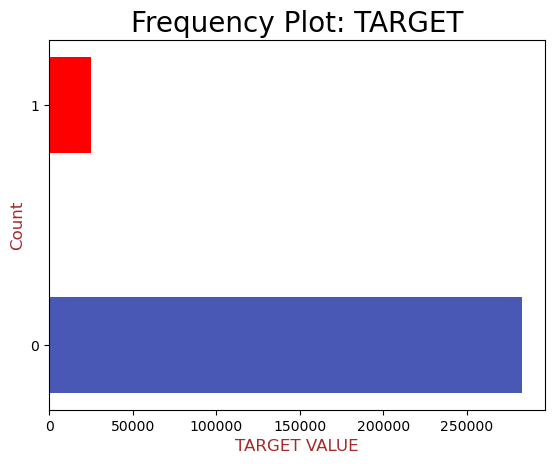

In [104]:
plt.barh(inp_appl.TARGET.value_counts().index, inp_appl.TARGET.value_counts(), color=['#4958B5', 'Red'], height=0.4)

# Adding and formatting title
plt.title("Frequency Plot: TARGET", fontdict={'fontsize': 20, 'fontweight' : 20, 'color' : 'Black'})

# Labeling Axes
plt.xlabel("TARGET VALUE", fontdict={'fontsize': 12, 'fontweight' : 20, 'color' : 'Brown'})
plt.ylabel("Count", fontdict={'fontsize': 12, 'fontweight' : 20, 'color' : 'Brown'})

plt.yticks([0, 1])

plt.show()

<b>Analysis of TARGET - Pie Chart (absolute value and %age)</b>

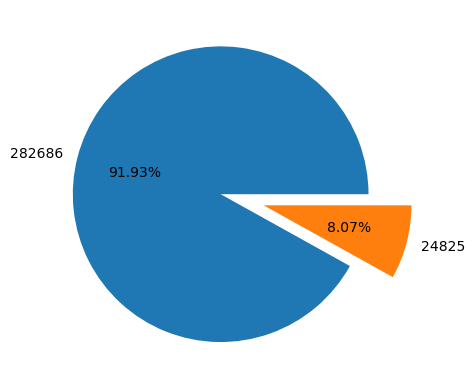

In [105]:
plt.pie(inp_appl.TARGET.value_counts(), labels=inp_appl.TARGET.value_counts(), autopct='%.2f%%', explode=[0, 0.3])
plt.show()

TARGET attribute contains the flag about whether a client has difficulty in paying loan or not. It contains two types of scenarios:
* <b>The client with payment difficulties (TARGET = 1)</b>
    * he/she had late payment more than X days on at least one of the first Y instalments of the loan in our sample,
* <b>All other cases (TARGET = 0)</b>
    * All other cases when the payment is paid on time.

### Ratio of data imbalance
Ratio of data imbalance = Number of cases with TARGET as 1 : Number of cases with TARGET as 0

Ratio of data imbalance = 8.07 : 91.93 = 1 : 11.4

### Implication due to Data Imbalance
TARGET attribute plays a important role in identification of client's capability to pay back loan. As there is a huge difference in two possible options for TARGET column with approximate ratio of 1:11.4, approach of 'Segmented Analysis based on TARGET variable' to be followed, all the data columns should be analyzed separately for two different option of TARGET variable.

# <font color='#00008B'>Custom Functions Definition</font>

Custom Functions will help in creating desired and multiple views/charts through loops.

#### For adding Header

In [ ]:
# To add header on set of plots
def drawHeader(fig, axp, flagd, dlabl):
    linec = '#E3120B'
    if flagd == 1: # Vertical for one and no horizontal
        axp.plot([1.15, 1.15], [0.2, 0.8], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color=linec, linewidth=.6)
        axp.add_patch(plt.Polygon([[0.12,.98], [0.16,.98], [0.14,.96]], transform=fig.transFigure, clip_on=False, color=linec))
        axp.text(x=0.17, y=.94, s=dlabl, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
    elif flagd == 2: # Vertical for two and horizontal
        axp.plot([0.3, 2], [-0.2, -0.2], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([1.15, 1.15], [-1.3, 0.8], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color=linec, linewidth=.6)
        axp.add_patch(plt.Polygon([[0.12,.98], [0.16,.98], [0.14,.96]], transform=fig.transFigure, clip_on=False, color=linec))
        axp.text(x=0.17, y=.94, s=dlabl, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
    elif flagd == 3: # Vertical for upper and horizontal
        axp.plot([0.3, 2], [-0.28, -0.28], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([1.15, 1.15], [0.2, 0.8], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color=linec, linewidth=.6)
        axp.add_patch(plt.Polygon([[0.12,.98], [0.16,.98], [0.14,.96]], transform=fig.transFigure, clip_on=False, color=linec))
        axp.text(x=0.17, y=.94, s=dlabl, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
    elif flagd == 4: # Vertical for two and no horizontal
        axp.plot([1.15, 1.15], [-1.3, 0.8], color=linec, lw=1, transform=axp.transAxes, clip_on=False)
        axp.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color=linec, linewidth=.6)
        axp.add_patch(plt.Polygon([[0.12,.98], [0.16,.98], [0.14,.96]], transform=fig.transFigure, clip_on=False, color=linec))
        axp.text(x=0.17, y=.94, s=dlabl, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)


### For Univariant Catgorical

Bar Plot

In [ ]:
# Bar plot for Categorical variables
def drawCateBar(fig, axp, flagd, trgtt, datas, datas_Norm, dlabl, ylabl):
    linec = '#E3120B'
    cmapc = ["#ccdefb", "#3196f3"]

    # Colourmap initializing and normalizing (between 0 to 1) [Dual tone - lighter (min) to darker (max)]
    cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", cmapc, N=256)
    norm = mpl.colors.Normalize(datas.min(), datas.max())

    # Plot bars
    axp.set_title(trgtt)
    bar1 = axp.bar(datas_Norm.index, datas_Norm, color=cmap(norm(datas)), width=0.4, zorder=2)

    # Create the grid 
    axp.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
    axp.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

    # Label and ticks
    axp.set_ylabel(ylabl, fontsize=12, labelpad=10)
    axp.set_xticks(datas.index, datas.index, rotation=90)

    # Add label on top of each bar
    axp.bar_label(bar1, labels=[f'{e:,.0f}' for e in datas], padding=3, color='black', fontsize=8) 

    # Remove the spines
    axp.spines[['top']].set_visible(False)

    drawHeader(fig, axp, flagd, dlabl)

Pie Plot

In [ ]:
# Pie chart for Categorical variables, if number of categories for variables is <= 3
def drawCatePie(fig, axp, flagd, trgtt, datas, dlabl, ylabl):
    linec = '#E3120B'
    expld = [0] * datas.shape[0]
    expld[0] = 0.3
    
    # Plot bars
    axp.set_title(trgtt)
    p = axp.pie(datas, labels=datas, autopct='%.2f%%', explode=expld)
    axp.legend(datas.index, bbox_to_anchor=(0.15,1), loc="lower right")

    drawHeader(fig, axp, flagd, dlabl)

Calling Function for Categorial Variables

In [ ]:
# This is main function that will generate segmented analysis view based on TARGET for Categorial Variables.
def drawCate(df, dlabl, vertical=False, sortbyindex=False, cumsum=False):
    if sortbyindex == True:
        data_bar_0 = df[df.TARGET == 0][dlabl].value_counts().sort_index()
        data_bar_1 = df[df.TARGET == 1][dlabl].value_counts().sort_index()

        data_bar_Norm_0 = df[df.TARGET == 0][dlabl].value_counts(normalize=True).sort_index()
        data_bar_Norm_1 = df[df.TARGET == 1][dlabl].value_counts(normalize=True).sort_index()
    else:
        data_bar_0 = df[df.TARGET == 0][dlabl].value_counts()
        data_bar_1 = df[df.TARGET == 1][dlabl].value_counts()

        data_bar_Norm_0 = df[df.TARGET == 0][dlabl].value_counts(normalize=True)
        data_bar_Norm_1 = df[df.TARGET == 1][dlabl].value_counts(normalize=True)

    if cumsum == True:
        data_bar_0 = data_bar_0.cumsum()
        data_bar_1 = data_bar_1.cumsum()

        data_bar_Norm_0 = data_bar_Norm_0.cumsum()
        data_bar_Norm_1 = data_bar_Norm_1.cumsum()
    
    if data_bar_0.shape[0] > 15 and vertical == True:
        # Create the figure and axes objects, specify the size and the dots per inches 
        fig, ax = plt.subplots(2, 1, figsize=(13.33, 12.5), dpi = 96)  # ____
        plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.9, wspace=0.4, hspace=0.4)

        # Variable Components
        ylabl = "%age (Count in Labels)"

        axp0 = ax[0]
        drawCateBar(fig, axp0, 1,  "No Payment Difficulty", data_bar_0, data_bar_Norm_0, dlabl, ylabl)
    
        axp1 = ax[1]
        drawCateBar(fig, axp1, 0, "With Payment Difficulty", data_bar_1, data_bar_Norm_1, dlabl, ylabl)

    else:
        # Create the figure and axes objects, specify the size and the dots per inches 
        fig, ax = plt.subplots(1, 2, figsize=(13.33, 7.5), dpi = 96)  # ____
        plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.9, wspace=0.4, hspace=0.4)

        # Variable Components
        ylabl = "%age (Count in Labels)"

        axp0 = ax[0]  # ____
        if data_bar_0.shape[0] <= 3:
            drawCatePie(fig, axp0, 1,  "No Payment Difficulty", data_bar_0, dlabl, ylabl)
        else:
            drawCateBar(fig, axp0, 1,  "No Payment Difficulty", data_bar_0.head(15), data_bar_Norm_0.head(15), dlabl, ylabl)

        axp1 = ax[1]  # ____
        if data_bar_1.shape[0] <= 3:
            drawCatePie(fig, axp1, 0, "With Payment Difficulty", data_bar_1, dlabl, ylabl)
        else:
            drawCateBar(fig, axp1, 0, "With Payment Difficulty", data_bar_1.head(15), data_bar_Norm_1.head(15), dlabl, ylabl)

    plt.show()

### For Univariant Numerical

Distribution Plot

In [ ]:
# Distribution plot for Numerical variables
def drawNumrDist(fig, axp, flagd, trgtt, datas, dlabl):
    axp.set_title(trgtt)
    sns.distplot(datas, ax=axp)

    # Create the grid 
    axp.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
    axp.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

    if dlabl.startswith("EXT_SOURCE"):
        xlabels = ['{:.2f}'.format(x) for x in axp.get_xticks()]
    else:
        xlabels = ['{:.0f}'.format(x) for x in axp.get_xticks()]
    axp.set_xticklabels(xlabels, rotation=90)
    drawHeader(fig, axp, flagd, dlabl)

Box Plot

In [ ]:
# Box plot for Numerical variables
def drawNumrBoxp(fig, axp, flagd, data0, data1, dlabl):
    bp1 = axp.boxplot(data0, vert=False, positions=[0], widths=0.45, 
                 patch_artist=True, boxprops=dict(facecolor="C0"))
    bp2 = axp.boxplot(data1, vert=False, positions=[1], widths=0.45, 
                     patch_artist=True, boxprops=dict(facecolor="C2"))
    
    if dlabl.startswith("EXT_SOURCE"):
        xlabels = ['{:.2f}'.format(x) for x in axp.get_xticks()]
    else:
        xlabels = ['{:.0f}'.format(x) for x in axp.get_xticks()]
    axp.set_xticklabels(xlabels, rotation=90)

    axp.legend([bp1["boxes"][0], bp2["boxes"][0]], ['TARGET = 0', 'TARGET = 1'], loc='upper right')
    axp.set_ylim(-1,2)
    drawHeader(fig, axp, flagd, dlabl)

Calling Function for Numerical Variables

In [ ]:
# This is main function that will generate segmented analysis view based on TARGET for Numerical Variables.
def drawNumr(df, dlabl):
    fig = plt.figure(figsize=(13.33, 13), dpi = 96)
    gs = fig.add_gridspec(2,2)

    plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.9, wspace=0.4, hspace=0.4)

    if dlabl == 'DAYS_EMPLOYED':
        data0 = df[(df.TARGET == 0) & (~df[dlabl].isnull()) & (~df[dlabl].isin([365243]))][dlabl]
        data1 = df[(df.TARGET == 1) & (~df[dlabl].isnull()) & (~df[dlabl].isin([365243]))][dlabl]
    else:
        data0 = df[(df.TARGET == 0) & (~df[dlabl].isnull())][dlabl]
        data1 = df[(df.TARGET == 1) & (~df[dlabl].isnull())][dlabl]

    axp1 = fig.add_subplot(gs[0, 0])
    drawNumrDist(fig, axp1, 3, "No Payment Difficulty", data0, dlabl)

    axp2 = fig.add_subplot(gs[0, 1])
    drawNumrDist(fig, axp2, 0, "With Payment Difficulty", data1, dlabl)

    axp3 = fig.add_subplot(gs[1, :])
    drawNumrBoxp(fig, axp3, 0, data0, data1, dlabl)

    plt.show()

### For Bivariant Numerical vs Numerical

Scatter Plot

In [ ]:
# Scatter plot for Bivariant Numerical vs Numerical
def drawNumrScatter(fig, axp, flagd, trgtt, data1, data2, dlabl):
    axp.set_title(trgtt)
    plt.scatter(data1, data2, alpha=0.2, zorder=2, marker=".")

    # Create the grid 
    axp.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
    axp.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

    xlabels = ['{:.0f}'.format(x) for x in axp.get_xticks()]
    axp.set_xticklabels(xlabels, rotation=90)
    ylabels = ['{:.0f}'.format(y) for y in axp.get_yticks()]
    axp.set_yticklabels(ylabels)
    
    drawHeader(fig, axp, flagd, dlabl)

Calling Function for Bivariant Numerical vs Numerical

In [ ]:
# This is main function that will generate segmented analysis view based on TARGET for Bivariant Numerical vs Numerical.
def drawNumrBi(df, dlabl1, dlabl2):
    fig = plt.figure(figsize=(13.33, 7.5), dpi = 96)
    gs = fig.add_gridspec(1,2)

    plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.88, wspace=0.4, hspace=0.4)

    if dlabl2 == 'DAYS_EMPLOYED':
        df1 = df[~df.DAYS_EMPLOYED.isin([365243])]
    else:
        df1 = df.copy()
    data0_1 = df1[df1.TARGET == 0][dlabl1]
    data1_1 = df1[df1.TARGET == 1][dlabl1]
    
    data0_2 = df1[df1.TARGET == 0][dlabl2]
    data1_2 = df1[df1.TARGET == 1][dlabl2]

    axp1 = fig.add_subplot(gs[0, 0])
    drawNumrScatter(fig, axp1, 1, "No Payment Difficulty", data0_1, data0_2, dlabl1 + " v/s " + dlabl2)

    axp2 = fig.add_subplot(gs[0, 1])
    drawNumrScatter(fig, axp2, 0, "With Payment Difficulty", data1_1, data1_2, dlabl1 + " v/s " + dlabl2)

    plt.show()

### For Bivariant Categorical vs Categorical

Bar Plot and Stack Plot

In [ ]:
# This is main function that will generate Bar Plot and Stack Plot with segmented analysis view based on TARGET 
# for Bivariant Categorical vs Categorical.
def drawCateBi(df, dlabl1, dlabl2):
    fig = plt.figure(figsize=(13.33, 17), dpi = 96)
    gs = fig.add_gridspec(2,2)

    plt.subplots_adjust(left=None, bottom=0.0, right=None, top=0.90, wspace=0.4, hspace=0.4)

    pivot_1 = pd.pivot_table(df[df.TARGET == 0], index=dlabl1, columns=dlabl2, values='SK_ID_CURR', aggfunc='count')
    pivot_2 = pd.pivot_table(df[df.TARGET == 1], index=dlabl1, columns=dlabl2, values='SK_ID_CURR', aggfunc='count')
    
    axp1 = fig.add_subplot(gs[0, 0])
    axp1.set_title("No Payment Difficulty (Density)")
    pivot_1.plot.bar(ax=axp1)
    drawHeader(fig, axp1, 4, dlabl1 + " v/s " + dlabl2)
    
    axp2 = fig.add_subplot(gs[0, 1])
    axp2.set_title("No Payment Difficulty (%)")
    pivot_1.apply(lambda x: x/x.sum(), axis=1).plot(kind='bar', stacked=True, legend=False, ax=axp2)
    
    axp3 = fig.add_subplot(gs[1, 0])
    axp3.set_title("With Payment Difficulty (Density)")
    pivot_2.plot.bar(ax=axp3)
    
    axp4 = fig.add_subplot(gs[1, 1])
    axp4.set_title("With Payment Difficulty (%)")
    pivot_2.apply(lambda x: x/x.sum(), axis=1).plot(kind='bar', stacked=True, legend=False, ax=axp4)
    
    plt.show()

### For Multivariant Categorical vs Categorical vs Numerical

Box Plot

In [ ]:
# Box plot for Multivariant analysis
def drawMultBoxp(df, dlabl1, dlabl2, dlabl3):
    fig = plt.figure(figsize=(13.33, 7.5), dpi = 96)
    gs = fig.add_gridspec(1,2)

    plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.88, wspace=0.4, hspace=0.4)

    # First Box Plot - No Payment Difficulty
    axp1 = fig.add_subplot(gs[0, 0])
    
    x_order = sorted(df[dlabl1].apply(str).unique())
    h_order = sorted(df[dlabl2].apply(str).unique())
    axp1.set_title("No Payment Difficulty")
    sns.boxplot(data=df[df.TARGET == 0], x=dlabl1, y=dlabl3, order=x_order, hue=dlabl2, hue_order=h_order, ax=axp1)
    axp1.set_xticklabels(axp1.get_xticklabels(),rotation=90)
    ylabels = ['{:.0f}'.format(y) for y in axp1.get_yticks()]
    axp1.set_yticklabels(ylabels)
    drawHeader(fig, axp1, 1, dlabl1 + " v/s " + dlabl2 + " v/s " + dlabl3)

    # First Box Plot - With Payment Difficulty
    axp2 = fig.add_subplot(gs[0, 1])
    
    axp2.set_title("With Payment Difficulty")
    sns.boxplot(data=df[df.TARGET == 1], x=dlabl1, y=dlabl3, order=x_order, hue=dlabl2, hue_order=h_order, ax=axp2)
    axp2.set_xticklabels(axp2.get_xticklabels(),rotation=90)
    ylabels = ['{:.0f}'.format(y) for y in axp2.get_yticks()]
    axp2.set_yticklabels(ylabels)

    plt.show()

Heatmap

In [ ]:
# Heatmap for Multivariant analysis
def drawMultHeatmap(df, dlabl1, dlabl2, dlabl3):
    fig = plt.figure(figsize=(13.33, 7.5), dpi = 96)
    gs = fig.add_gridspec(1,2)

    plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.88, wspace=0.4, hspace=0.4)

    pivot_data1 = pd.pivot_table(df[df.TARGET == 0], index=dlabl1, columns=dlabl2, values=dlabl3, aggfunc='sum')
    pivot_data2 = pd.pivot_table(df[df.TARGET == 1], index=dlabl1, columns=dlabl2, values=dlabl3, aggfunc='sum')
    
    # First Box Plot - No Payment Difficulty
    axp1 = fig.add_subplot(gs[0, 0])
    
    axp1.set_title("No Payment Difficulty")
    cntr = df[df.TARGET == 1][dlabl3].mean()
    sns.heatmap(pivot_data1, cmap='summer', ax=axp1, center=cntr)
    drawHeader(fig, axp1, 1, dlabl1 + " v/s " + dlabl2 + " v/s " + dlabl3)

    # First Box Plot - With Payment Difficulty
    axp2 = fig.add_subplot(gs[0, 1])
    
    axp2.set_title("With Payment Difficulty")
    cntr = df[df.TARGET == 1][dlabl3].mean()
    sns.heatmap(pivot_data2, cmap='autumn', ax=axp2, center=cntr)

    plt.show()

# <font color='#00008B'>Data Analysis - Univariant</font>

## Categorical Variables

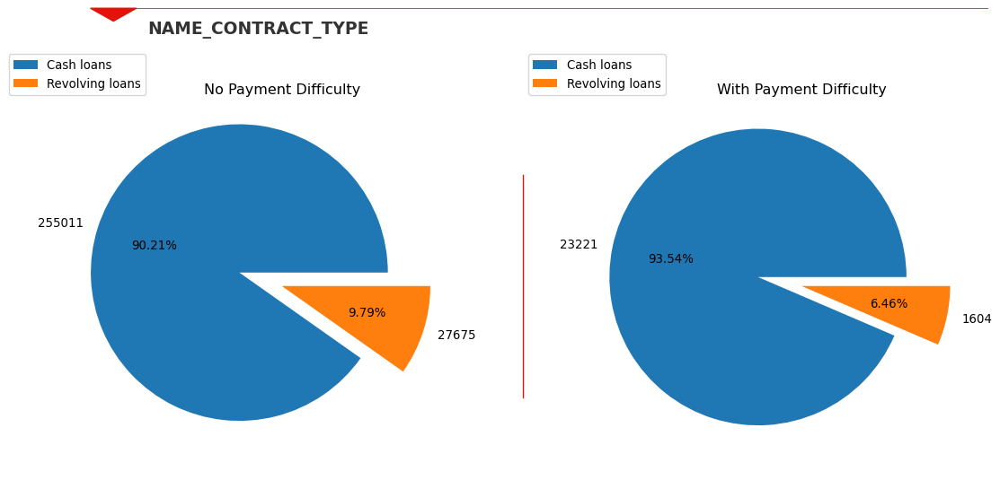

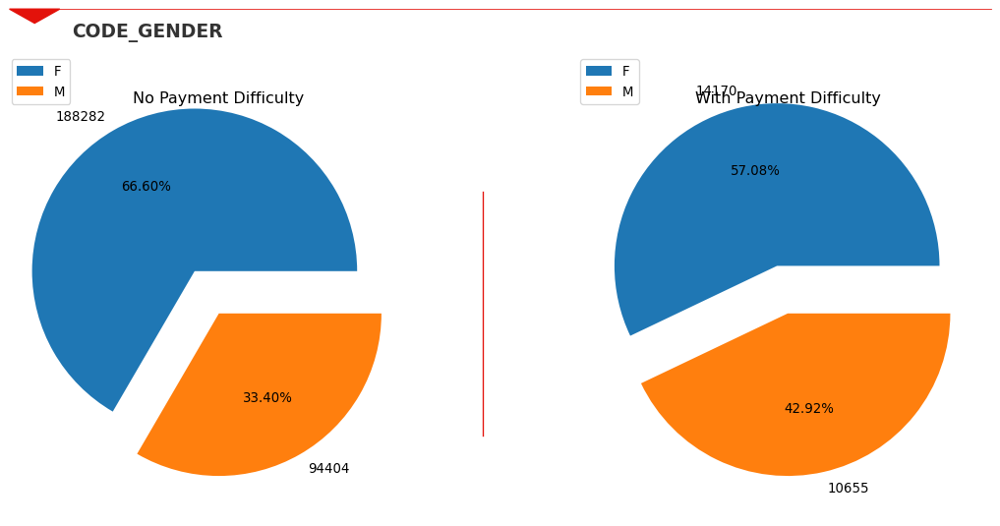

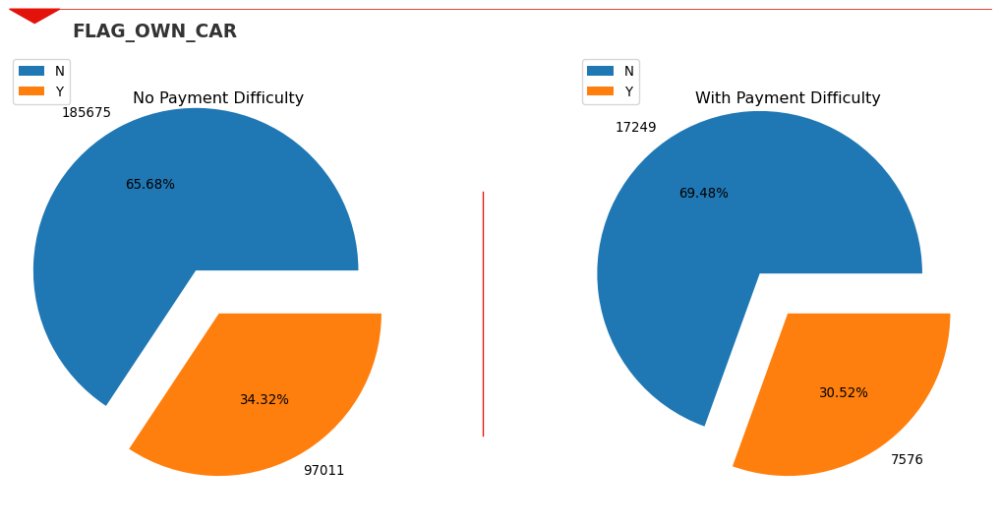

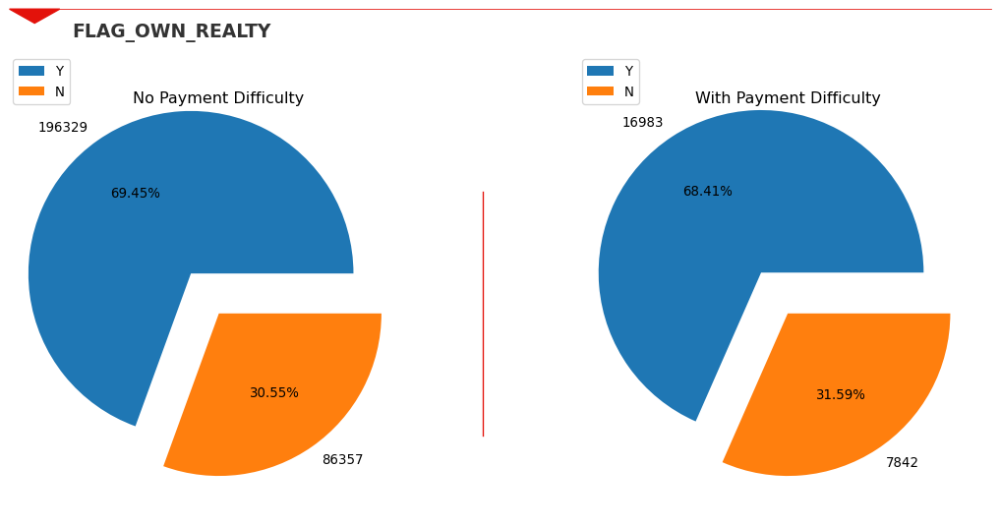

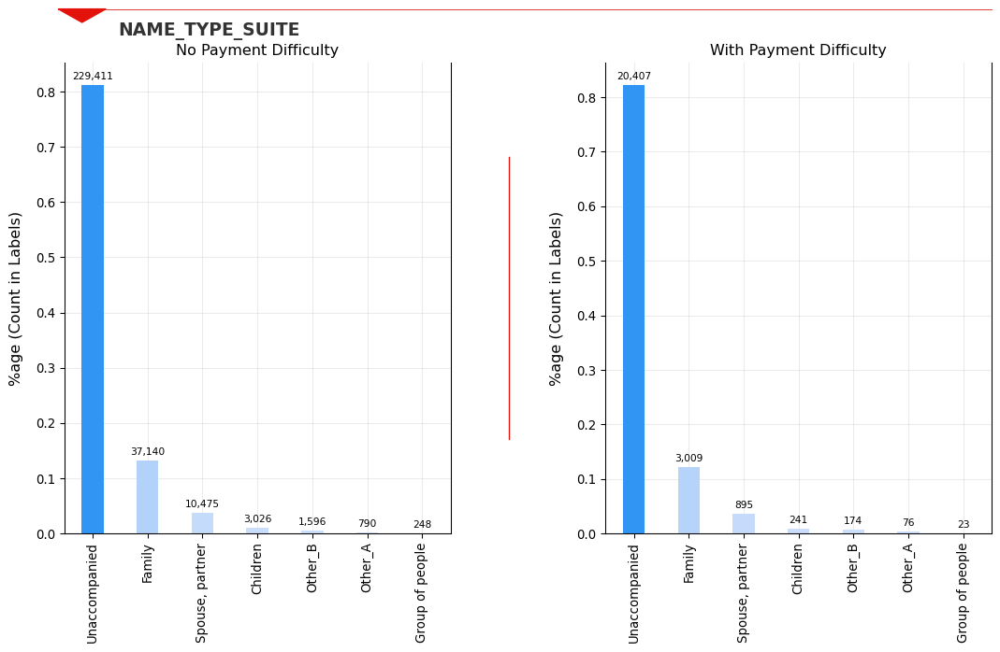

...

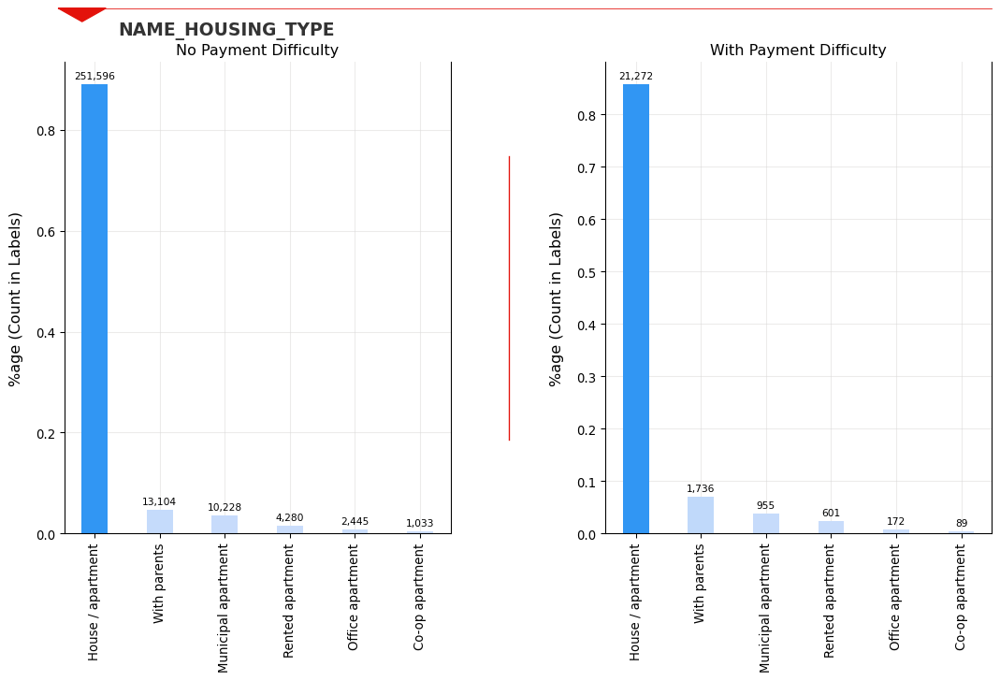

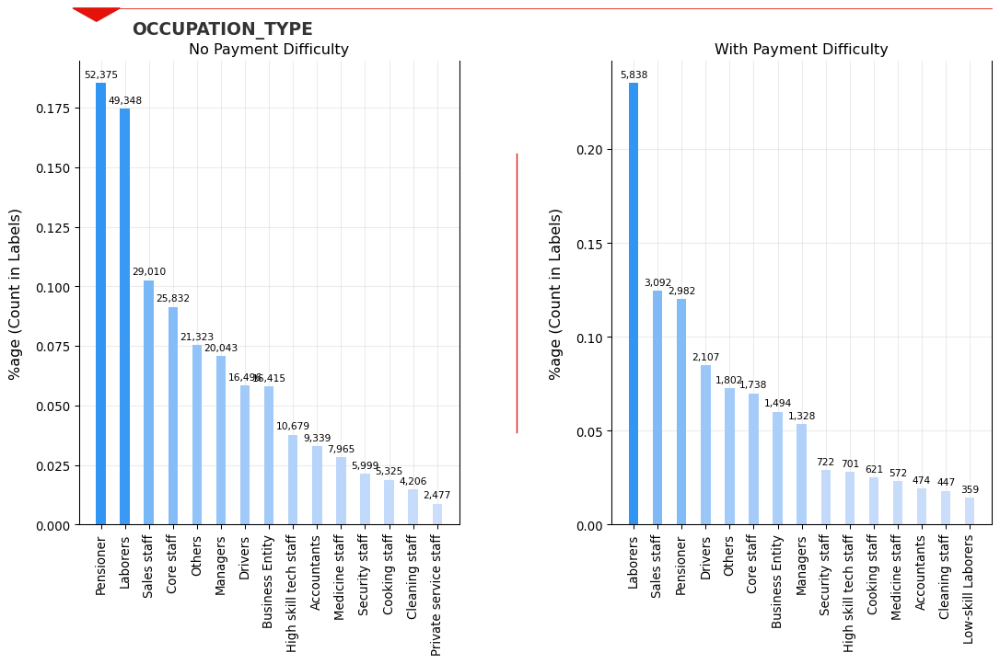

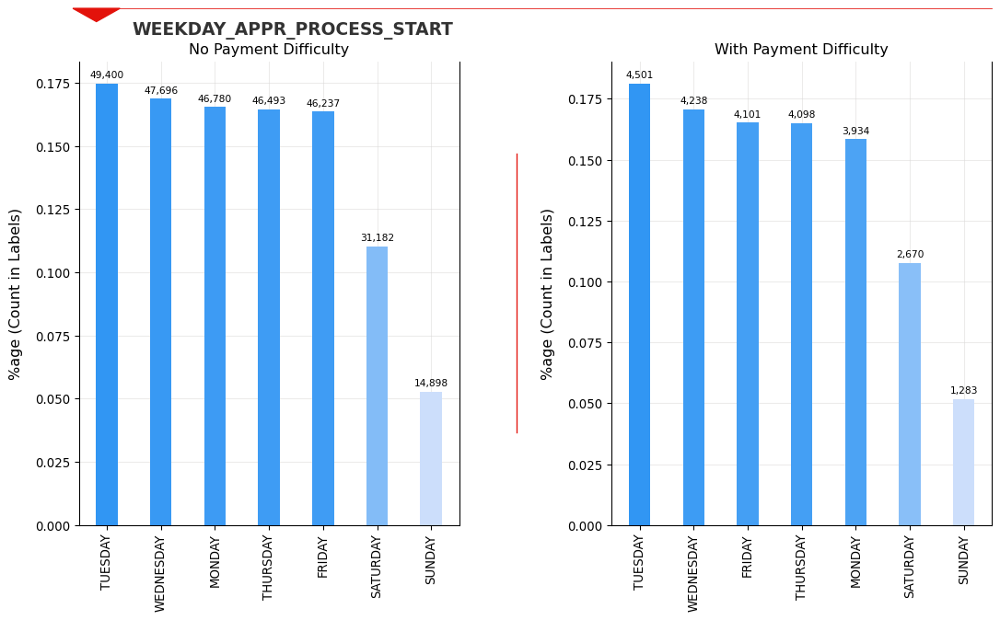

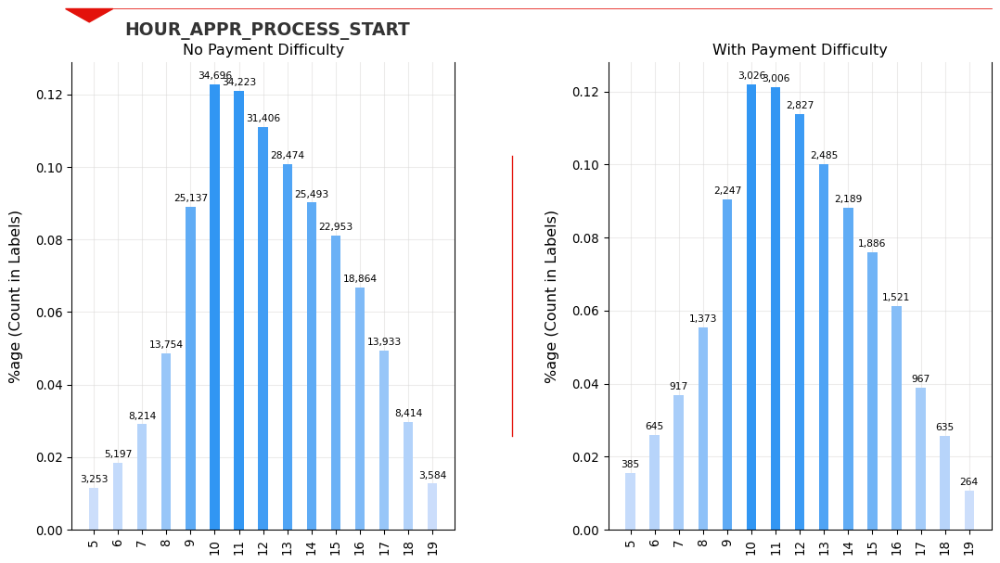

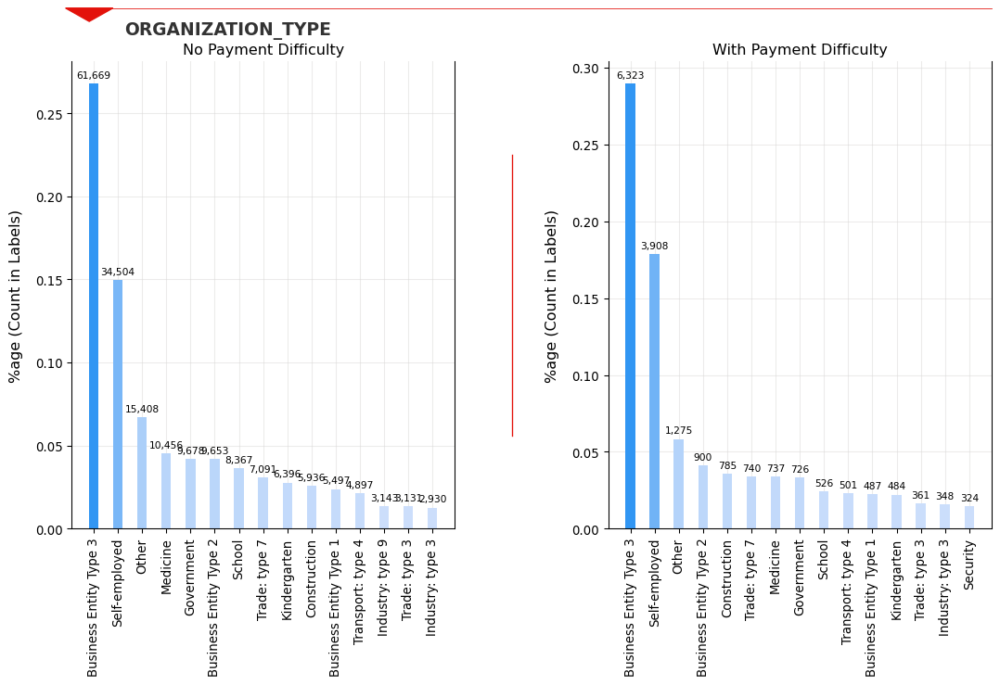

In [118]:
# Looping through all Categorical Variables
for col in col_appl_cate:
    if col != 'TARGET':
        drawCate(inp_appl, col)

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>NAME_INCOME_TYPE</b></li>
                    <ul>
                        <li>Students and Businessman have ‘No Payment Difficulties’. These NAME_INCOME_TYPE can be less risky while repayment.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

#### Redraw of ORGANIZATION_TYPE

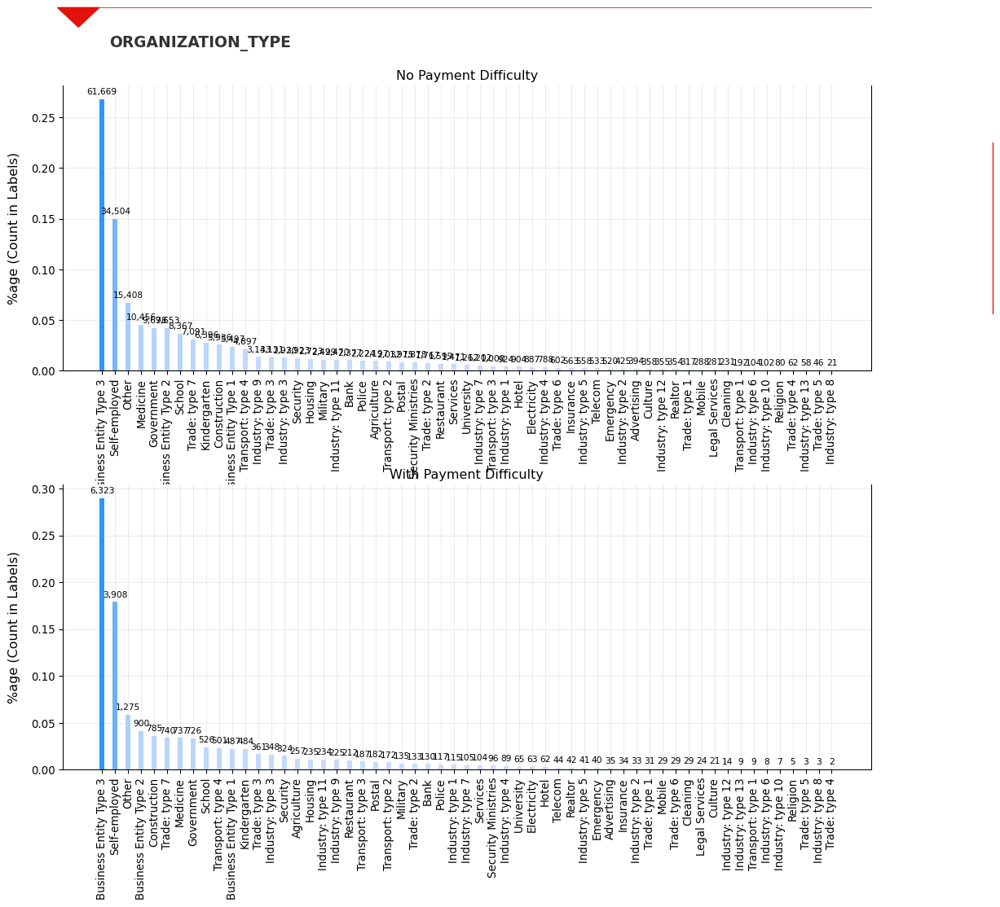

In [119]:
inp_appl[inp_appl.TARGET == 0]['ORGANIZATION_TYPE'].value_counts().shape[0]
drawCate(inp_appl, 'ORGANIZATION_TYPE', vertical=True)

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>ORGANIZATION_TYPE</h2>
            <ul>
                <li><b>NAME_INCOME_TYPE</b></li>
                    <ul>
                        <li>Further analysis show that clients in ‘Trade: type 4’ have very less chances of ‘Payment Difficulties’ (High ‘No Payment Difficulty’ compare to others).</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

## Numerical Variables

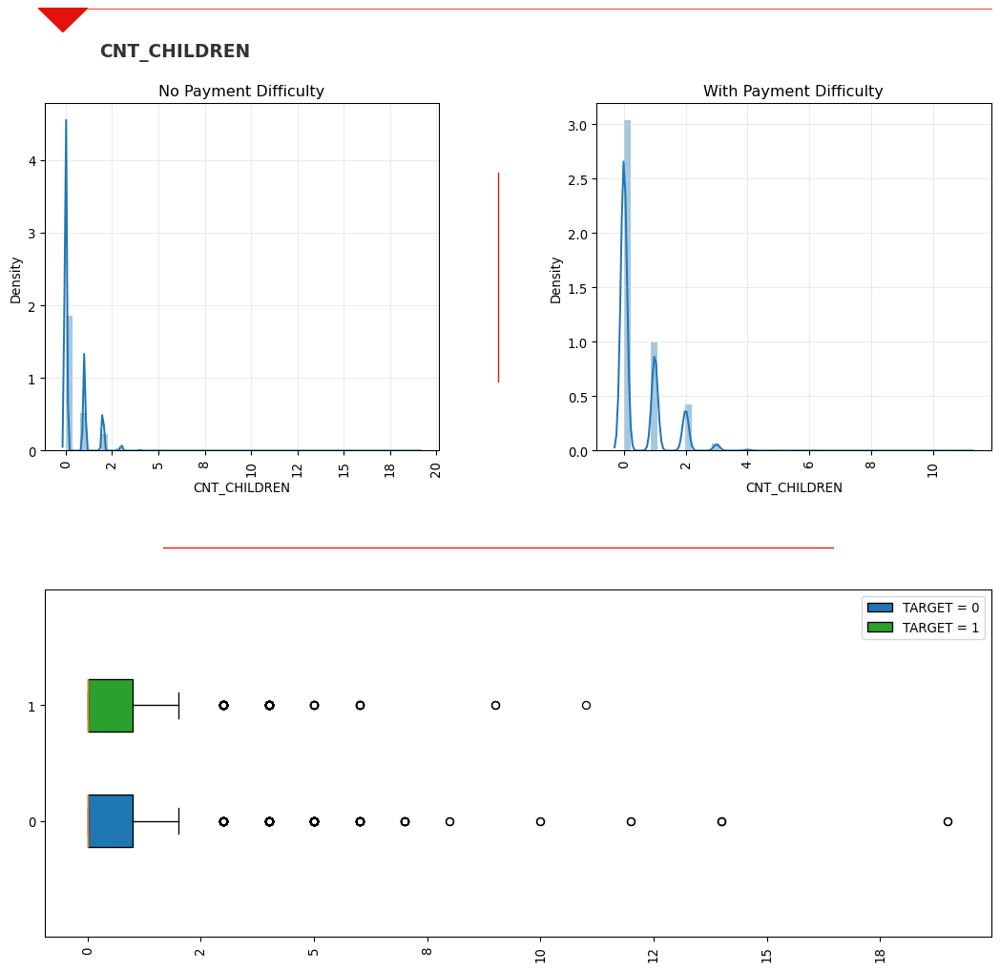

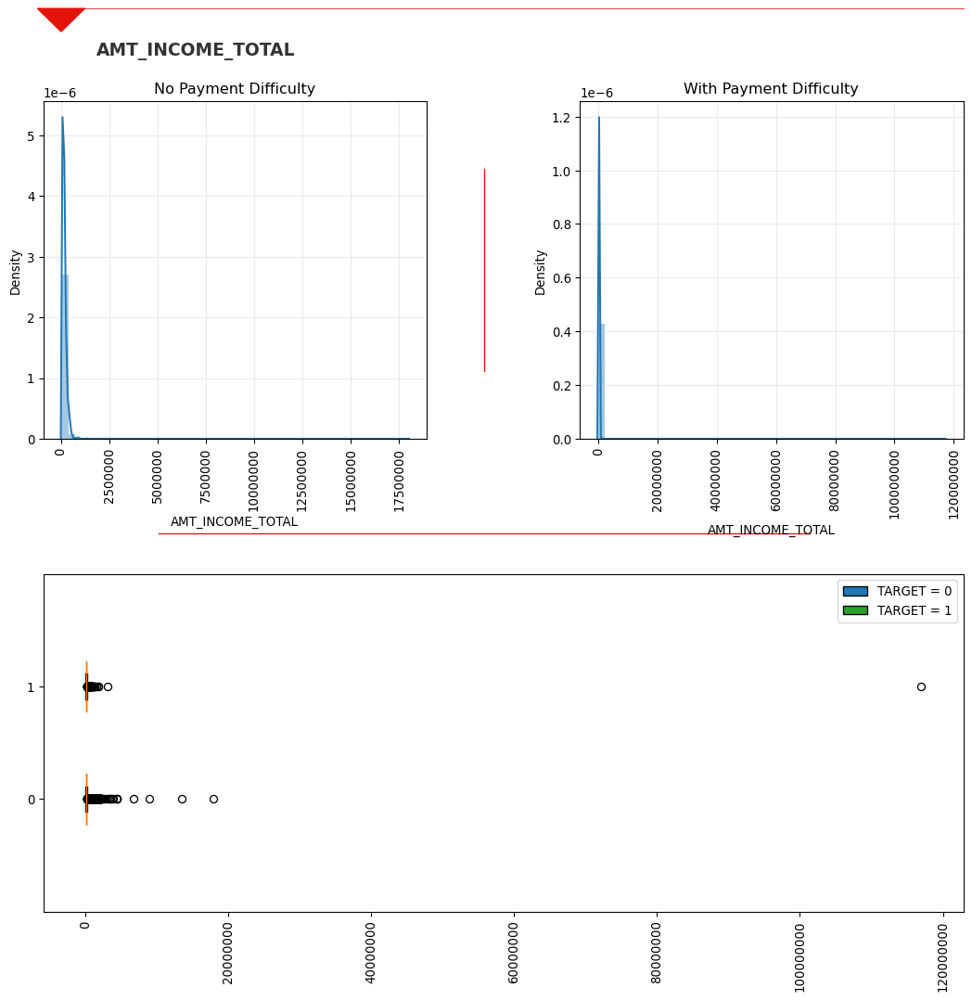

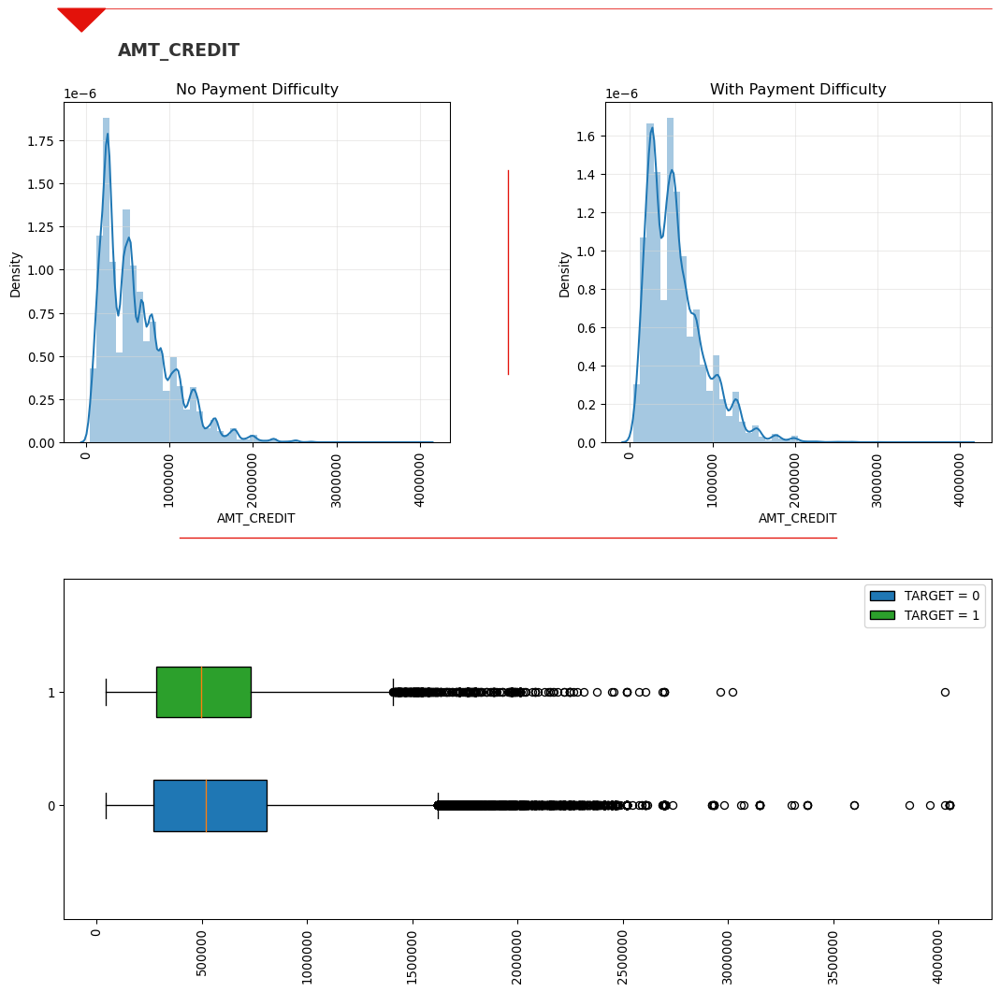

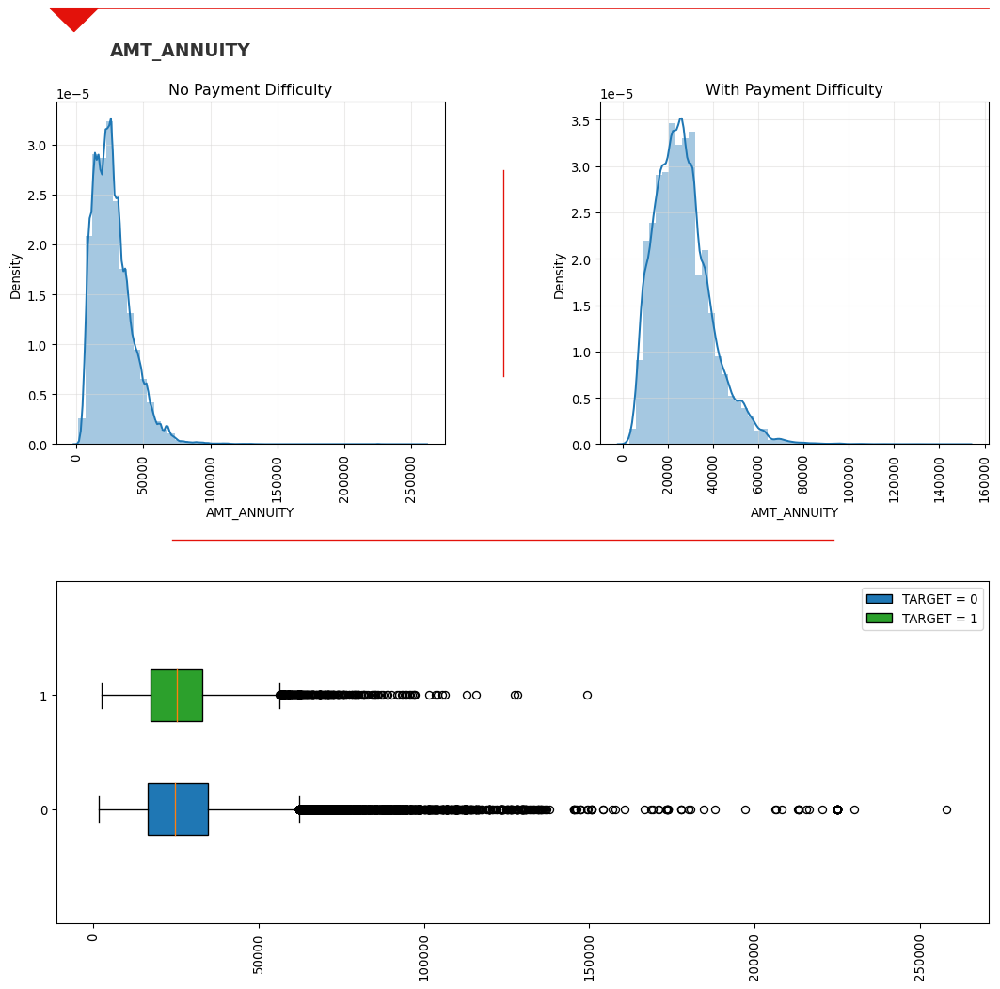

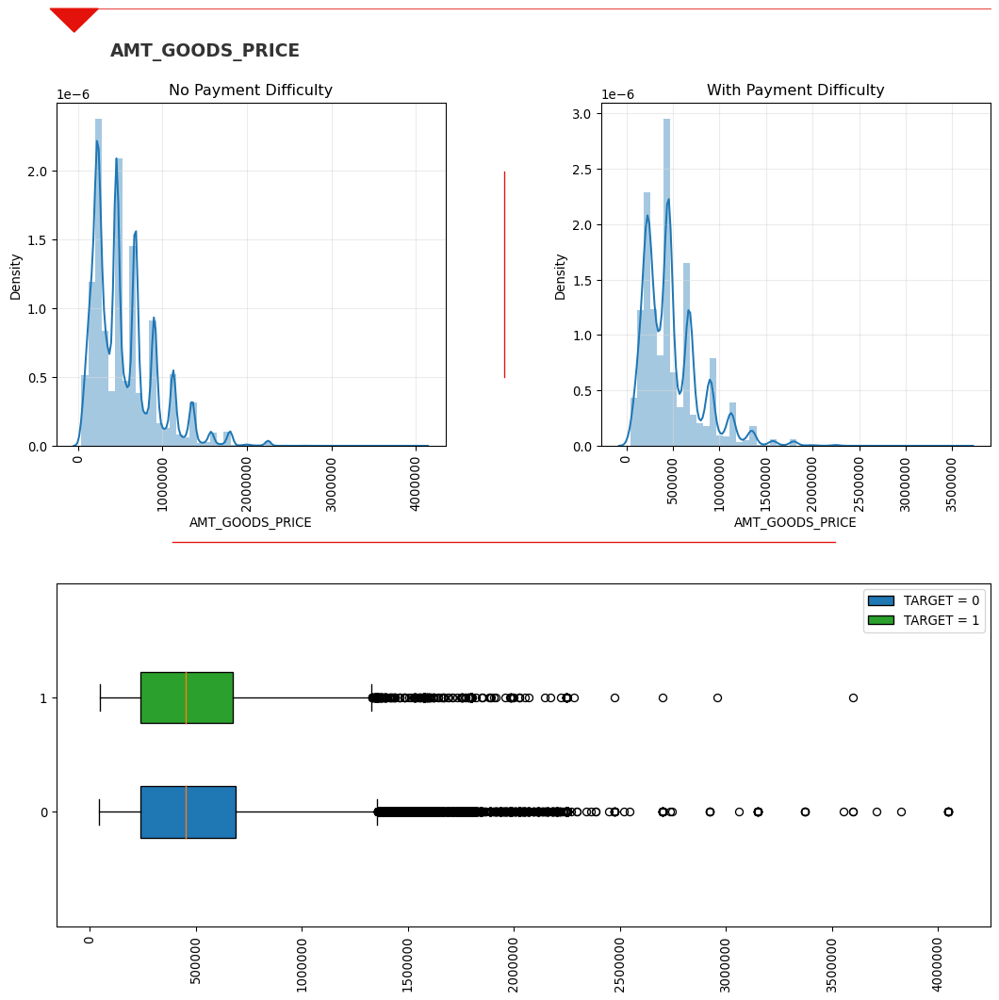

...

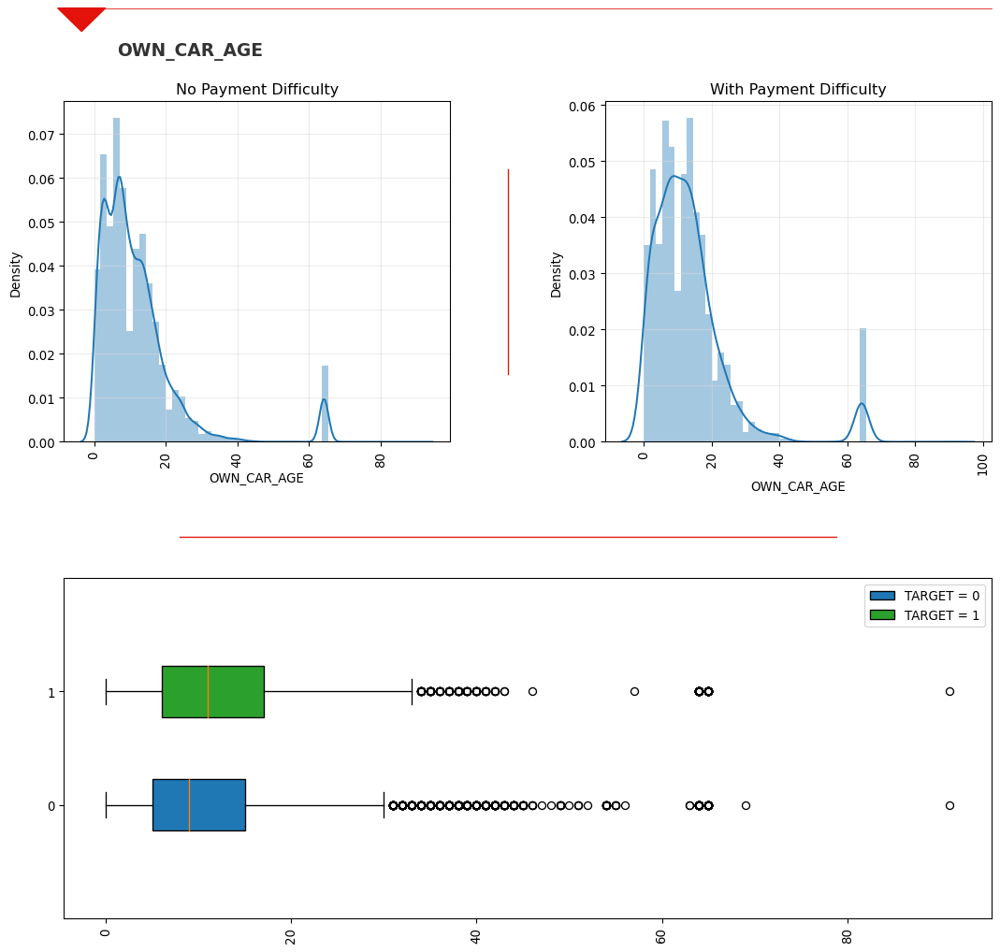

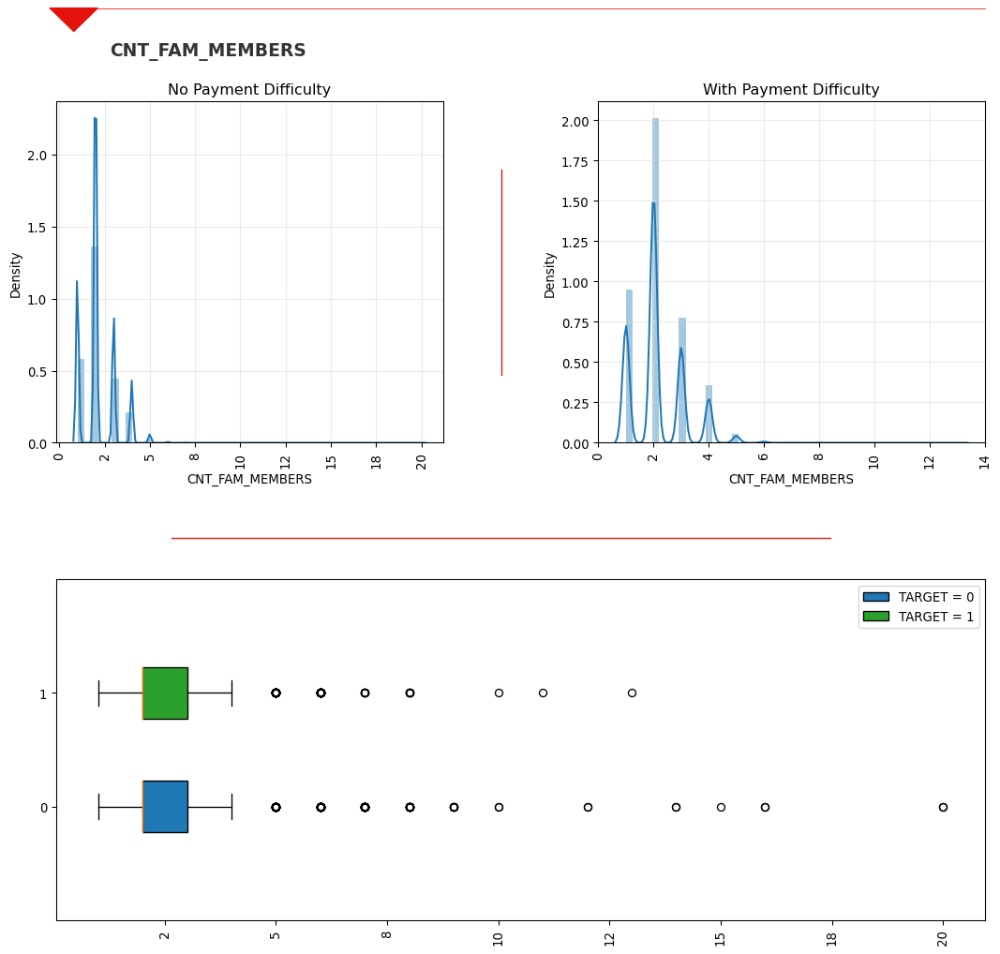

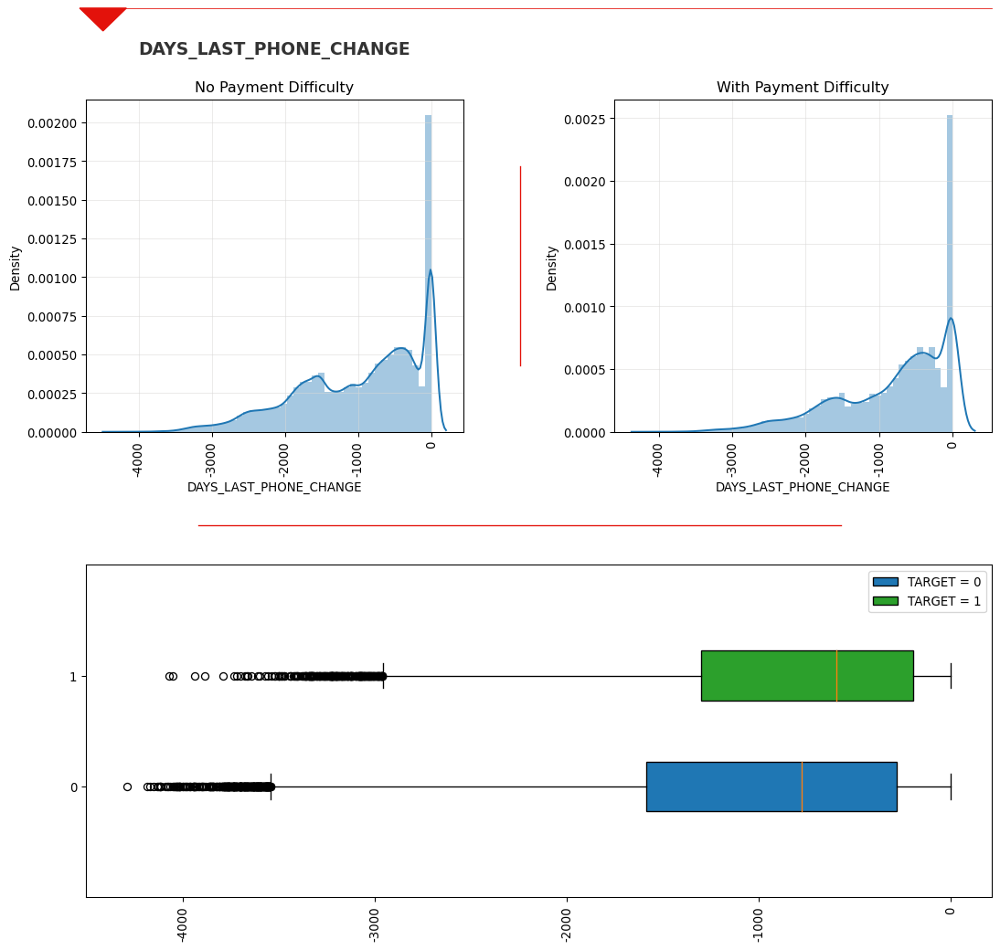

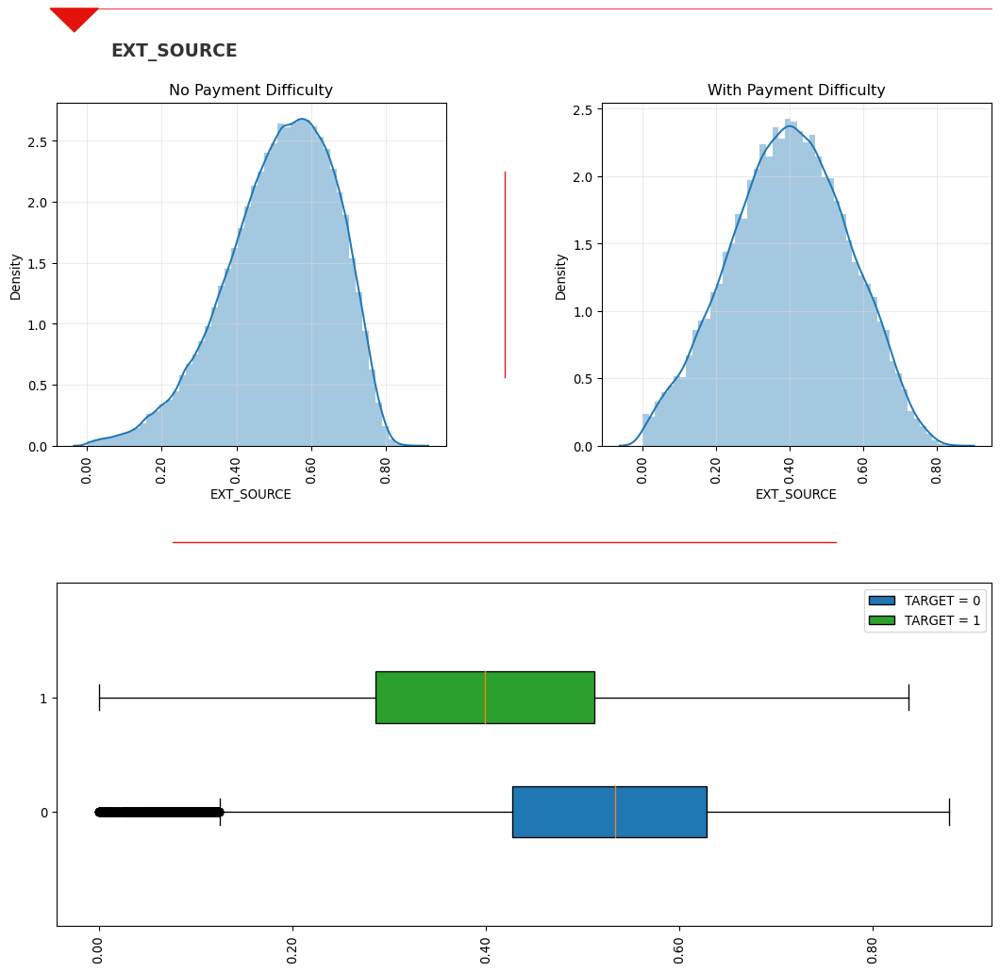

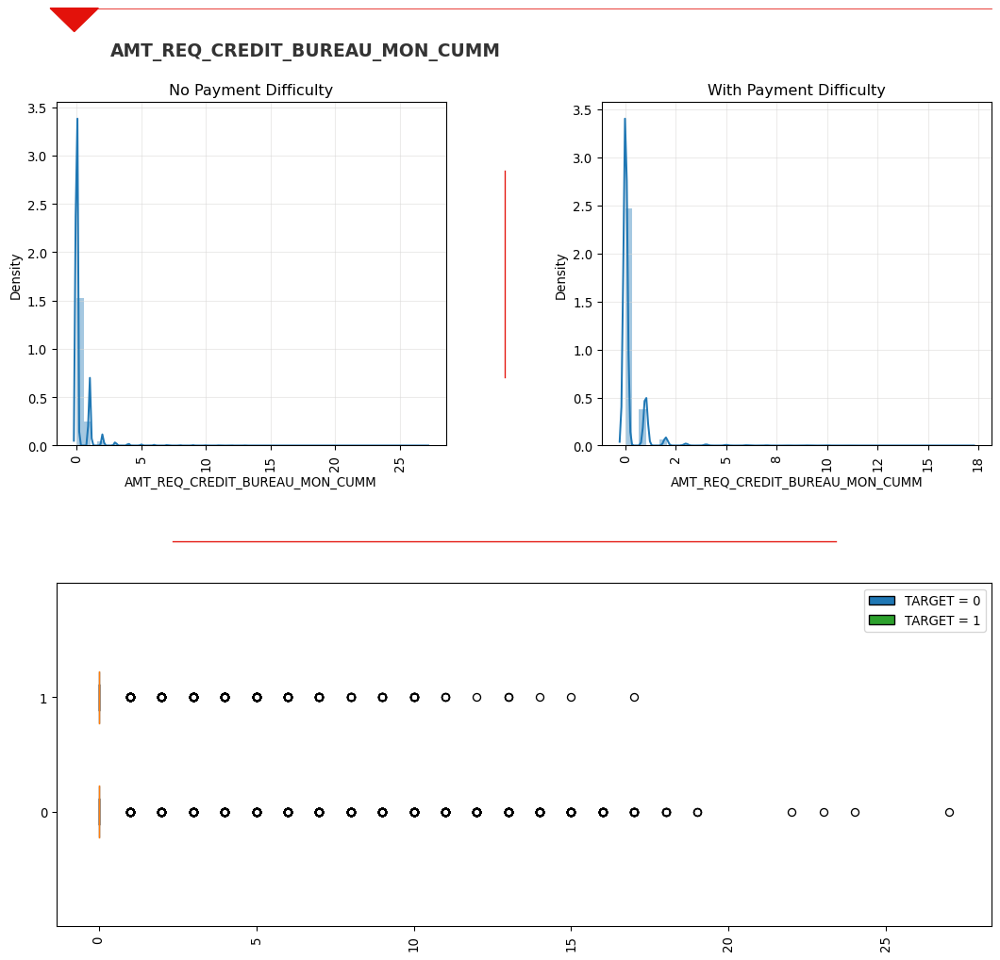

In [120]:
# Looping through all Numerical Variables
for col in col_appl_numr:
    drawNumr(inp_appl, col)

## Further Analysis of EXT_SOURCE

#### Create Baskets for EXT_SOURCE

In [121]:
inp_appl['EXT_SOURCE_BINS'] = pd.cut(x=inp_appl['EXT_SOURCE'], 
                                       bins=[0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1], 
                                       labels=['0-.1', '.1-.2', '.2-.3', '.3-.4', '.4-.5', '.5-.6', '.6-.7', '.7-.8', '.8-.9', '.9-1'])

#### EXT_SOURCE_BINS - Bar Chart

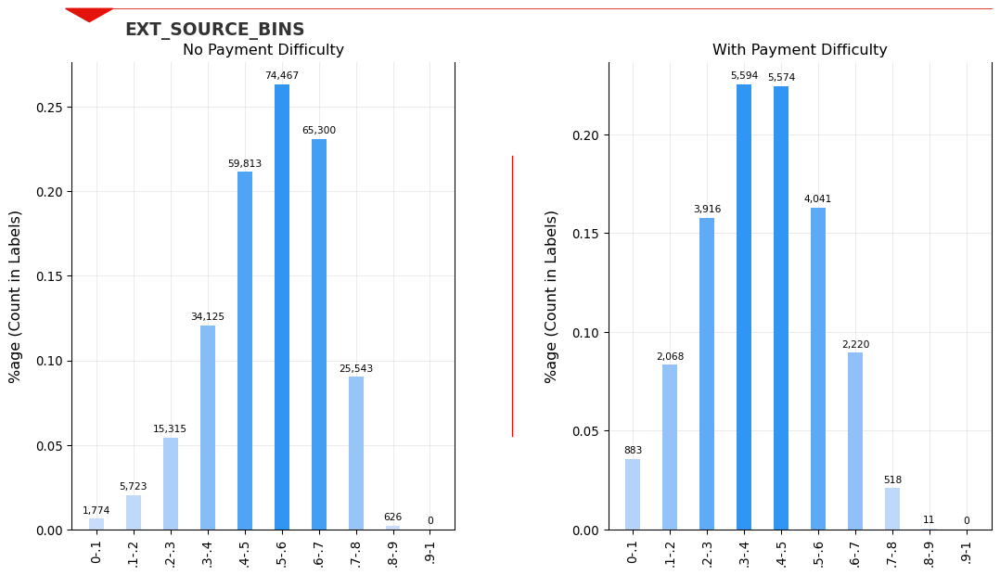

In [122]:
drawCate(inp_appl, 'EXT_SOURCE_BINS', sortbyindex=True, cumsum=False)

#### EXT_SOURCE_BINS - Bar Chart - Cummulative Sum

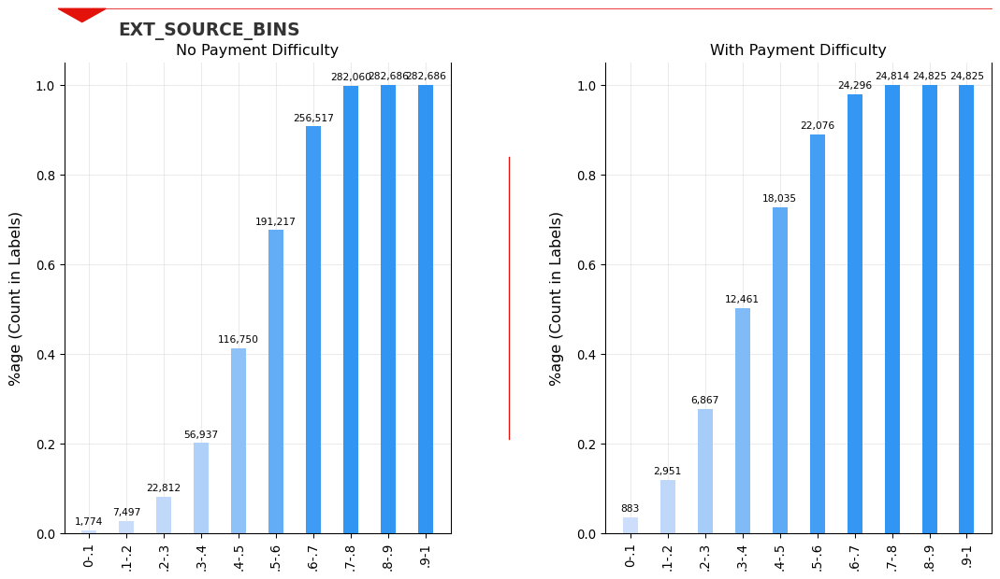

In [123]:
drawCate(inp_appl, 'EXT_SOURCE_BINS', sortbyindex=True, cumsum=True)

In [124]:
payment_difficulty_above_70 = inp_appl[(inp_appl.EXT_SOURCE > .7)][inp_appl.TARGET == 1].shape[0]
no_payment_difficulty_above_70 = inp_appl[(inp_appl.EXT_SOURCE > .7)][inp_appl.TARGET == 0].shape[0]
total_above_70 = inp_appl[(inp_appl.EXT_SOURCE > .7)].shape[0]

print("Clients %age having payment difficulty with EXT_SOURCE above 0.7    :", round(payment_difficulty_above_70 / total_above_70 * 100, 2))
print("Clients %age having NO payment difficulty with EXT_SOURCE above 0.7 :", round(no_payment_difficulty_above_70 / total_above_70 * 100, 2))

Clients %age having payment difficulty with EXT_SOURCE above 0.7    : 1.98
Clients %age having NO payment difficulty with EXT_SOURCE above 0.7 : 98.02


In [125]:
payment_difficulty_below_30 = inp_appl[(inp_appl.EXT_SOURCE < .2)][inp_appl.TARGET == 1].shape[0]
no_payment_difficulty_below_30 = inp_appl[(inp_appl.EXT_SOURCE < .2)][inp_appl.TARGET == 0].shape[0]
total_below_30 = inp_appl[(inp_appl.EXT_SOURCE < .2)].shape[0]

print("Clients %age having payment difficulty with EXT_SOURCE below 0.3    :", round(payment_difficulty_below_30 / total_below_30 * 100, 2))
print("Clients %age having NO payment difficulty with EXT_SOURCE below 0.3 :", round(no_payment_difficulty_below_30 / total_below_30 * 100, 2))

Clients %age having payment difficulty with EXT_SOURCE below 0.3    : 28.24
Clients %age having NO payment difficulty with EXT_SOURCE below 0.3 : 71.76


<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>EXT_SOURCE</b></li>
                    <ul>
                        <li>Clients with EXT_SOURCE > 0.7 have high chances of NO difficulty in payments and</li>
                        <li>Clients with EXT_SOURCE < 0.3 have higher chance of difficulty in payments, and should be provided loan with great scrutiny.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

## <font color='#00008B'>Outlier Handling</font>

### For CNT_CHILDREN

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the CNT_CHILDREN to 99.9 percentile.

In [126]:
CNT_CHILDREN_CAP = inp_appl.CNT_CHILDREN.quantile(.999)
CNT_CHILDREN_CAP

4.0

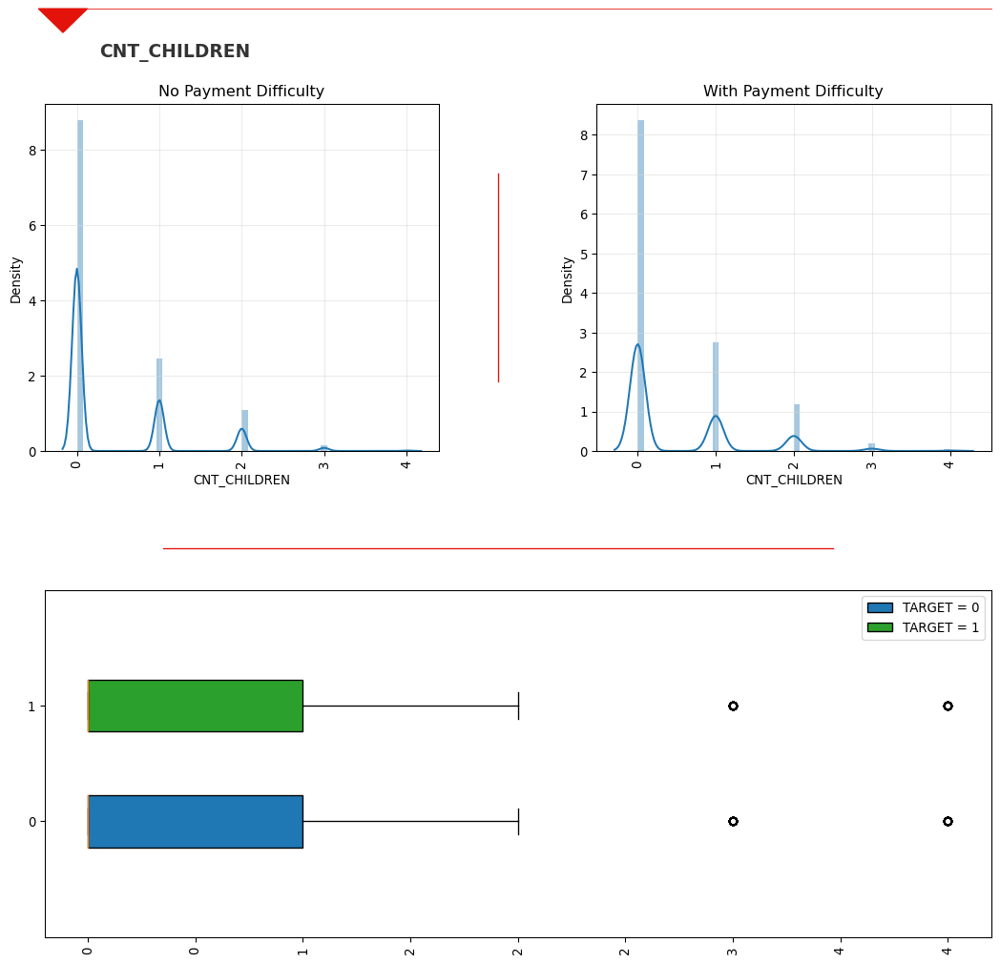

In [127]:
inp_appl.CNT_CHILDREN = inp_appl.CNT_CHILDREN.apply(lambda x: x if x < CNT_CHILDREN_CAP else CNT_CHILDREN_CAP)
drawNumr(inp_appl, 'CNT_CHILDREN')

### For AMT_INCOME_TOTAL

In [128]:
inp_appl.AMT_INCOME_TOTAL.describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [129]:
AMT_INCOME_TOTAL_CAP = inp_appl.AMT_INCOME_TOTAL.quantile(.99)
AMT_INCOME_TOTAL_CAP

472500.0

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, description and quantile distribution, Capping the AMT_INCOME_TOTAL to 99 percentile, 99.9 percentile seams to outlier for AMT_INCOME_TOTAL

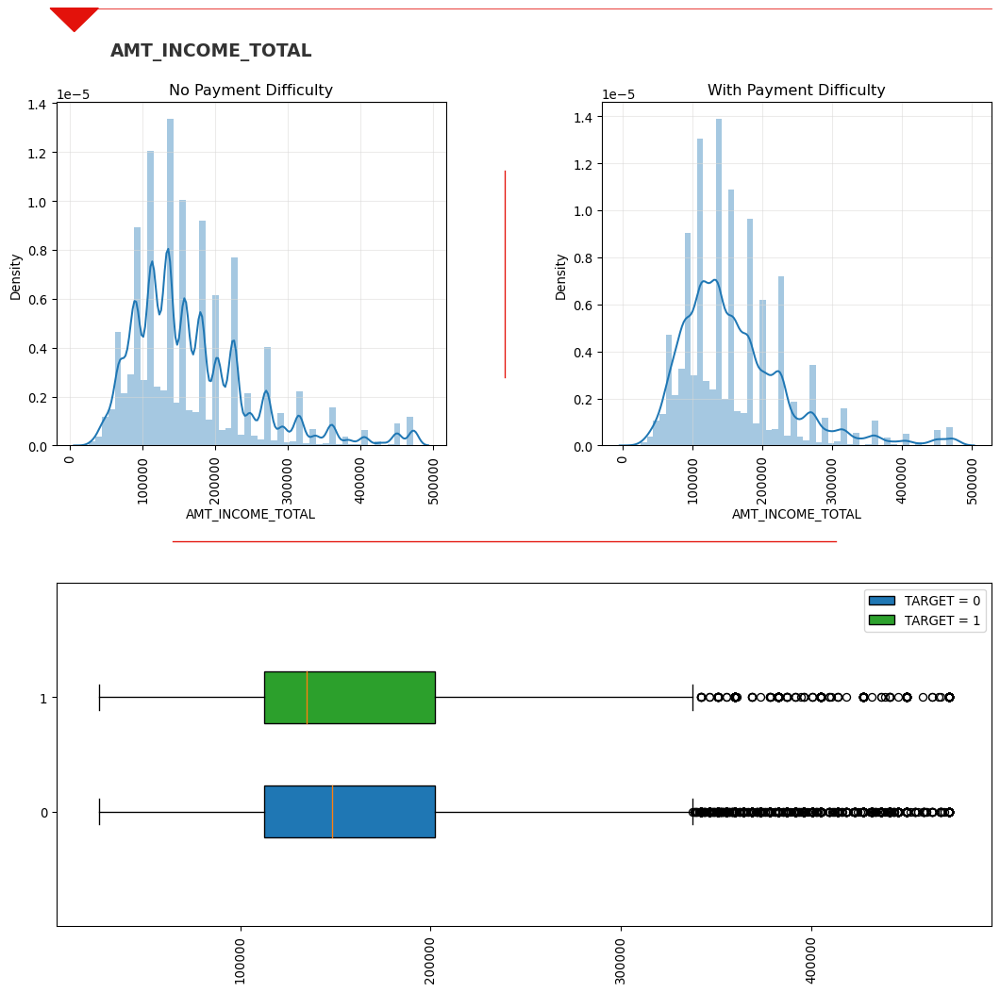

In [130]:
inp_appl.AMT_INCOME_TOTAL = inp_appl.AMT_INCOME_TOTAL.apply(lambda x: x if x < AMT_INCOME_TOTAL_CAP else AMT_INCOME_TOTAL_CAP)
drawNumr(inp_appl, 'AMT_INCOME_TOTAL')

### For AMT_CREDIT

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_INCOME_TOTAL to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [131]:
AMT_CREDIT_CAP = round(inp_appl.AMT_CREDIT.quantile(.999))
AMT_CREDIT_CAP

2517300

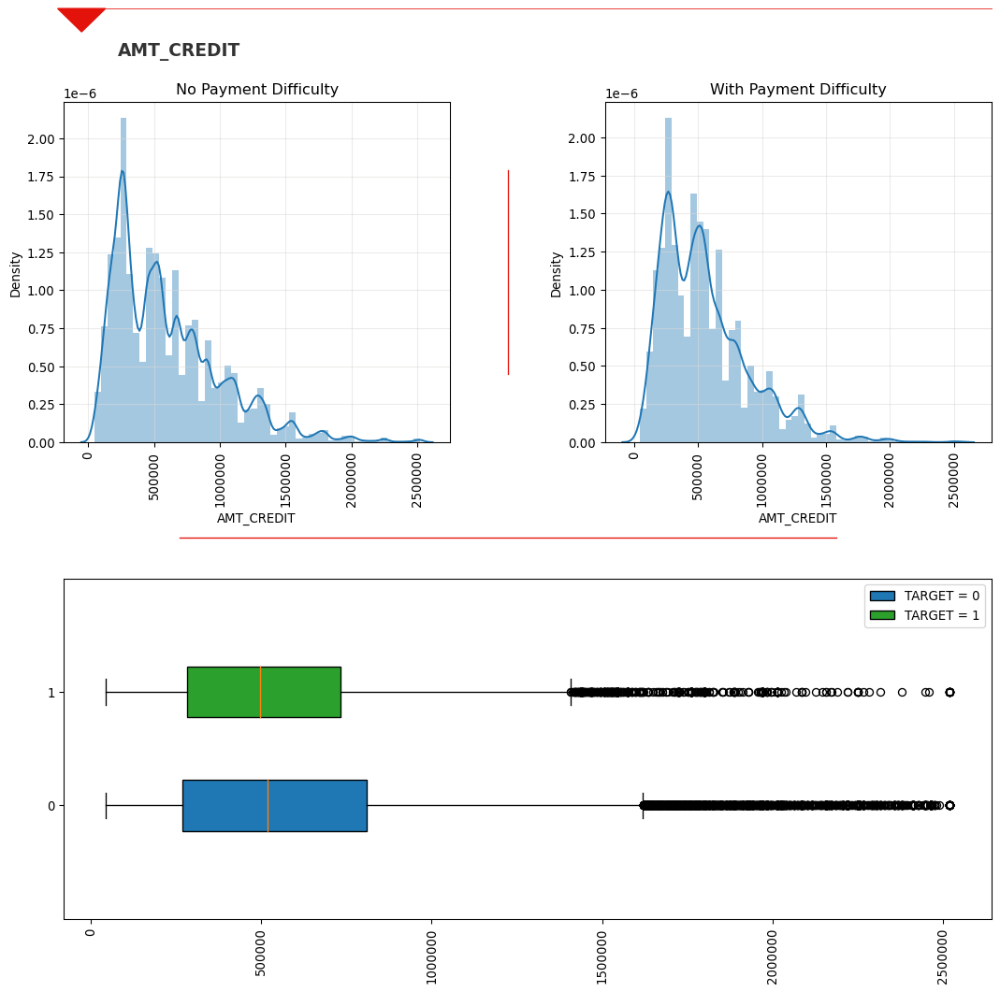

In [132]:
inp_appl.AMT_CREDIT = inp_appl.AMT_CREDIT.apply(lambda x: x if x < AMT_CREDIT_CAP else AMT_CREDIT_CAP)
drawNumr(inp_appl, 'AMT_CREDIT')

### For AMT_ANNUITY

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_ANNUITY to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [133]:
AMT_ANNUITY_CAP = round(inp_appl.AMT_ANNUITY.quantile(.999))
AMT_ANNUITY_CAP

110048

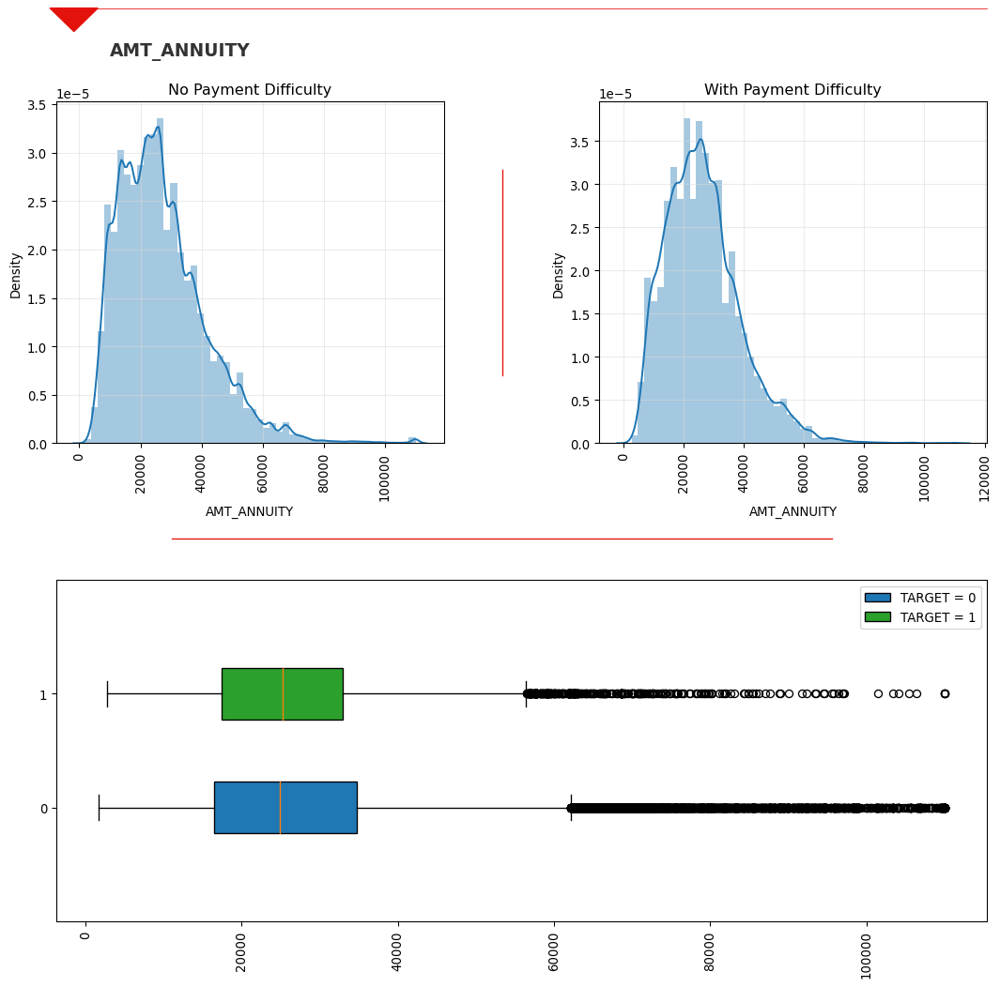

In [134]:
inp_appl.AMT_ANNUITY = inp_appl.AMT_ANNUITY.apply(lambda x: x if x < AMT_ANNUITY_CAP else AMT_ANNUITY_CAP)
drawNumr(inp_appl, 'AMT_ANNUITY')

### For AMT_GOODS_PRICE

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_GOODS_PRICE to 99.9 percentile. Till this number there are values avaiable almost at continuity. Also, corrospondance with AMT_CREDIT is considered.

In [135]:
AMT_GOODS_PRICE_CAP = round(inp_appl.AMT_GOODS_PRICE.quantile(.999))
AMT_GOODS_PRICE_CAP

2250000

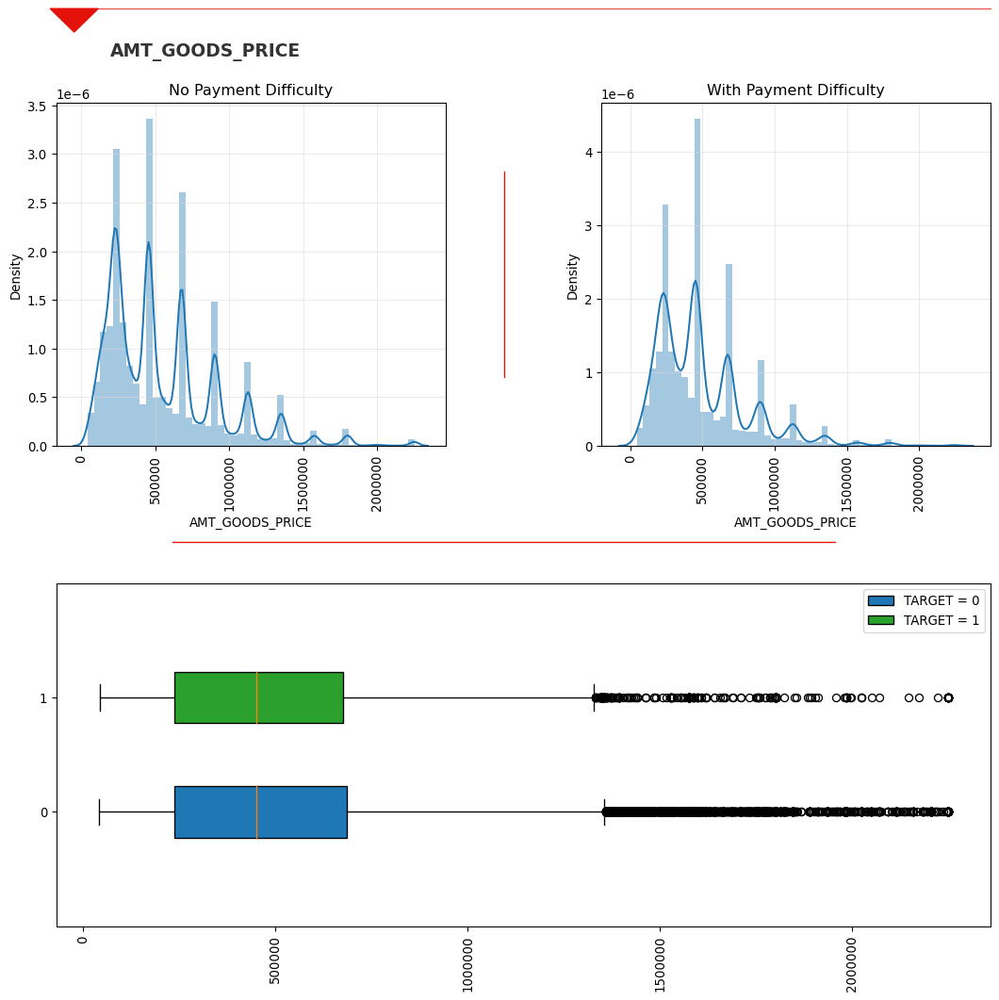

In [136]:
inp_appl.AMT_GOODS_PRICE = inp_appl.AMT_GOODS_PRICE.apply(lambda x: x if x < AMT_GOODS_PRICE_CAP else AMT_GOODS_PRICE_CAP)
drawNumr(inp_appl, 'AMT_GOODS_PRICE')

### For DAYS_EMPLOYED

<b><font color='blue'>Approach - Dataset Update:</font></b> For DAYS_EMPLOYED, negative outlier exists, capping all outliers to 1 lower percentile (Being all negative numbers evectively 99% values will be preserved).

In [137]:
DAYS_EMPLOYED_CAP = round(inp_appl.DAYS_EMPLOYED.quantile(.01))
DAYS_EMPLOYED_CAP

-11338

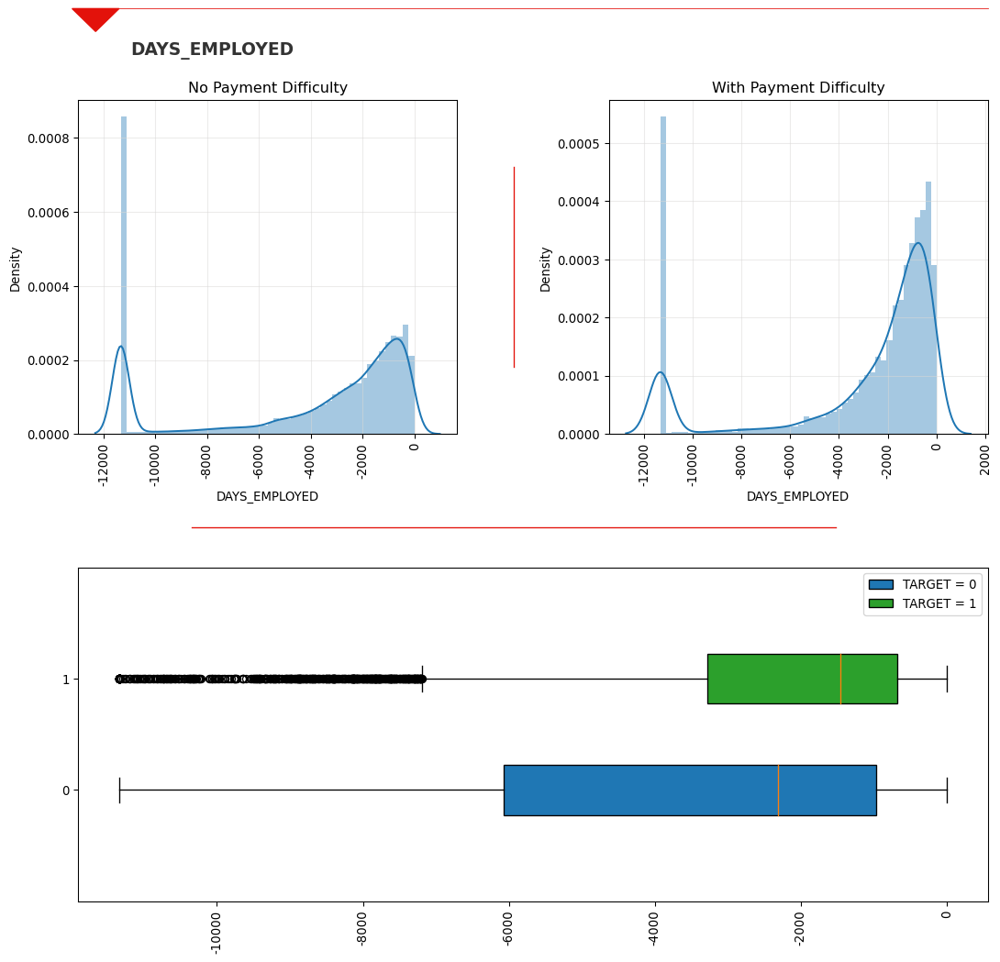

In [138]:
inp_appl.DAYS_EMPLOYED = inp_appl.DAYS_EMPLOYED.apply(lambda x: x if x > DAYS_EMPLOYED_CAP else DAYS_EMPLOYED_CAP)
drawNumr(inp_appl, 'DAYS_EMPLOYED')

### For DAYS_REGISTRATION

<b><font color='blue'>Approach - Dataset Update:</font></b> For DAYS_REGISTRATION, negative outlier exists, capping all outliers to 0.1 lower percentile (Being all negative numbers evectively 99.9% values will be preserved).

In [139]:
DAYS_REGISTRATION_CAP = round(inp_appl.DAYS_REGISTRATION.quantile(.001))
DAYS_REGISTRATION_CAP

-16503

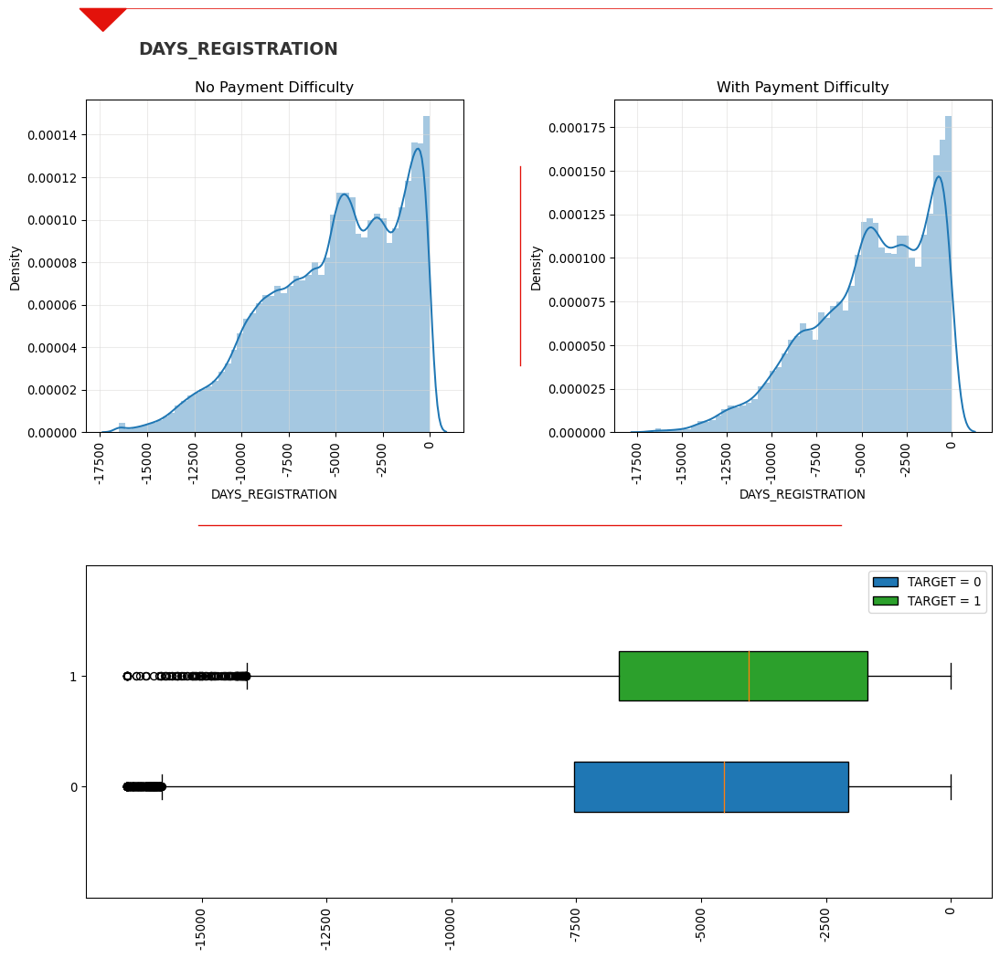

In [140]:
inp_appl.DAYS_REGISTRATION = inp_appl.DAYS_REGISTRATION.apply(lambda x: x if x > DAYS_REGISTRATION_CAP else DAYS_REGISTRATION_CAP)
drawNumr(inp_appl, 'DAYS_REGISTRATION')

### For CNT_FAM_MEMBERS

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the CNT_FAM_MEMBERS to 99.9 percentile.

In [141]:
CNT_FAM_MEMBERS_CAP = round(inp_appl.CNT_FAM_MEMBERS.quantile(.999))
CNT_FAM_MEMBERS_CAP

6

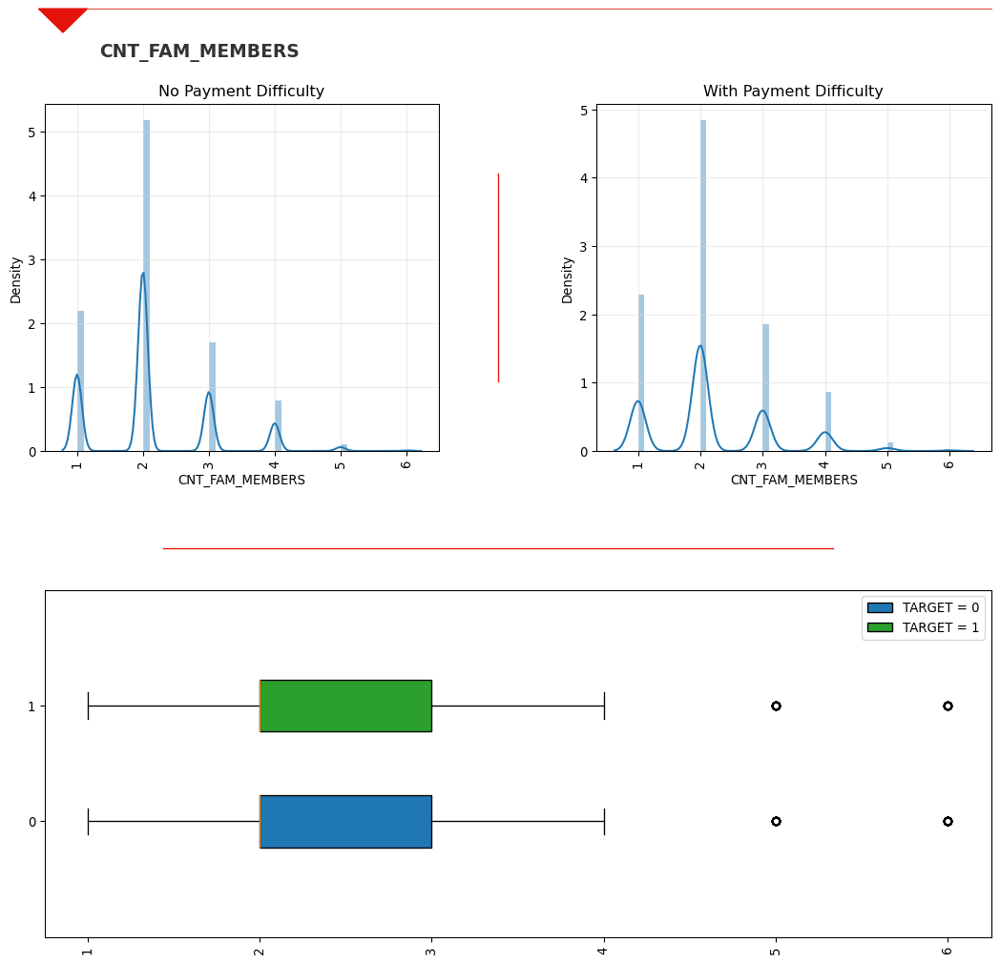

In [142]:
inp_appl.CNT_FAM_MEMBERS = inp_appl.CNT_FAM_MEMBERS.apply(lambda x: x if x < CNT_FAM_MEMBERS_CAP else CNT_FAM_MEMBERS_CAP)
drawNumr(inp_appl, 'CNT_FAM_MEMBERS')

# <font color='#00008B'>Correlation between Numerical Variables</font>

## <font color='#00008B'>For clients with NO payment difficulties (TARGET = 0)</font>

In [143]:
# Correlation Matrix
numr_corr0 = inp_appl[inp_appl.TARGET == 0][col_appl_numr].corr()
numr_corr0

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,YEARS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE,AMT_REQ_CREDIT_BUREAU_MON_CUMM
CNT_CHILDREN,1.000000,0.032890,0.003209,0.021231,-0.000497,-0.339759,0.241244,0.187438,-0.029016,0.008446,0.877133,-0.008472,-0.066539,-0.007211
AMT_INCOME_TOTAL,0.032890,1.000000,0.412714,0.489758,0.418490,-0.079138,0.132902,0.078537,0.029840,-0.158357,0.041170,-0.057221,0.093879,0.073992
AMT_CREDIT,0.003209,0.412714,1.000000,0.777337,0.987030,0.047593,0.019089,0.013363,-0.001516,-0.094926,0.065090,-0.069996,0.139849,0.053608
AMT_ANNUITY,0.021231,0.489758,0.777337,1.000000,0.781747,-0.012744,0.066648,0.039817,0.014894,-0.098279,0.077173,-0.063396,0.125278,0.038651
AMT_GOODS_PRICE,-0.000497,0.418490,0.987030,0.781747,1.000000,0.044942,0.017154,0.015748,-0.003747,-0.104006,0.063317,-0.071941,0.146984,0.055350
YEARS_BIRTH,-0.339759,-0.079138,0.047593,-0.012744,0.044942,1.000000,-0.670070,-0.332981,-0.270804,-0.003992,-0.287203,-0.076418,0.271320,0.002240
DAYS_EMPLOYED,0.241244,0.132902,0.019089,0.066648,0.017154,-0.670070,1.000000,0.254925,0.275721,-0.007308,0.218688,0.042945,-0.153748,0.013405
DAYS_REGISTRATION,0.187438,0.078537,0.013363,0.039817,0.015748,-0.332981,0.254925,1.000000,0.100235,-0.027594,0.176562,0.053652,-0.123839,-0.010937
DAYS_ID_PUBLISH,-0.029016,0.029840,-0.001516,0.014894,-0.003747,-0.270804,0.275721,0.100235,1.000000,0.006580,-0.020573,0.082950,-0.116297,-0.018245
OWN_CAR_AGE,0.008446,-0.158357,-0.094926,-0.098279,-0.104006,-0.003992,-0.007308,-0.027594,0.006580,1.000000,-0.014036,0.000199,-0.075622,-0.021787


#### Corr Heatmap

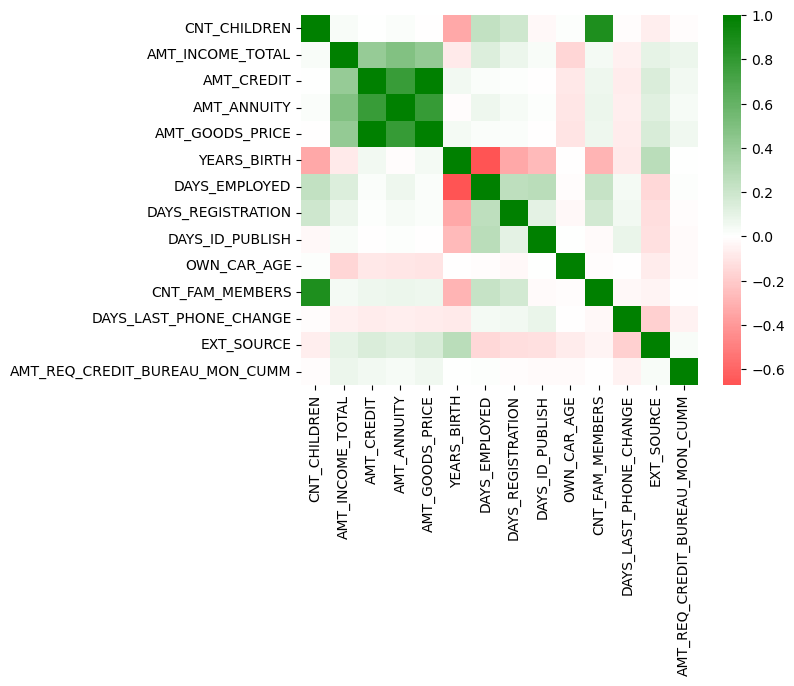

In [144]:
# Red / Green Color Map
cmap_corr = mpl.colors.LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256)

# Plotting Heatmap
sns.heatmap(numr_corr0, cmap=cmap_corr, center=0)
plt.show()

#### Top Correlated Variables

In [145]:
# Calculating Top10
data0 = []
for i in range(len(col_appl_numr)):
    for j in range(i+1, len(col_appl_numr)):
        row = []
        row.append(col_appl_numr[i])
        row.append(col_appl_numr[j])
        row.append(numr_corr0[col_appl_numr[i]][col_appl_numr[j]])
        data0.append(row)
df0 = pd.DataFrame(data0)

# Sorting
lookupcomb = df0.sort_values(by=[2], key=lambda x: abs(x), ascending=False).reset_index()
lookupcomb

,index,0,1,2
0,26,AMT_CREDIT,AMT_GOODS_PRICE,0.987030
1,9,CNT_CHILDREN,CNT_FAM_MEMBERS,0.877133
2,36,AMT_ANNUITY,AMT_GOODS_PRICE,0.781747
3,25,AMT_CREDIT,AMT_ANNUITY,0.777337
4,55,YEARS_BIRTH,DAYS_EMPLOYED,-0.670070
5,14,AMT_INCOME_TOTAL,AMT_ANNUITY,0.489758
6,15,AMT_INCOME_TOTAL,AMT_GOODS_PRICE,0.418490
7,13,AMT_INCOME_TOTAL,AMT_CREDIT,0.412714
8,4,CNT_CHILDREN,YEARS_BIRTH,-0.339759
9,56,YEARS_BIRTH,DAYS_REGISTRATION,-0.332981


## <font color='#00008B'>For clients with payment difficulties (TARGET = 1)</font>

In [146]:
# Correlation Matrix
numr_corr1 = inp_appl[inp_appl.TARGET == 1][col_appl_numr].corr()
numr_corr1

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,YEARS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE,AMT_REQ_CREDIT_BUREAU_MON_CUMM
CNT_CHILDREN,1.000000,-0.001681,-0.001830,0.031227,-0.008323,-0.262880,0.185645,0.150898,-0.032752,0.006754,0.883554,0.011146,-0.040289,-0.013029
AMT_INCOME_TOTAL,-0.001681,1.000000,0.351573,0.428473,0.352929,0.000697,0.089329,0.040029,-0.002051,-0.141201,0.006085,-0.084094,0.086779,0.074786
AMT_CREDIT,-0.001830,0.351573,1.000000,0.753014,0.982739,0.135228,-0.048962,-0.025727,-0.052375,-0.065961,0.051646,-0.111351,0.153376,0.056185
AMT_ANNUITY,0.031227,0.428473,0.753014,1.000000,0.752931,0.013769,0.049671,0.034566,-0.016587,-0.081944,0.076131,-0.079870,0.118361,0.055177
AMT_GOODS_PRICE,-0.008323,0.352929,0.982739,0.752931,1.000000,0.135608,-0.055535,-0.025570,-0.056073,-0.078050,0.047751,-0.118684,0.162560,0.059233
YEARS_BIRTH,-0.262880,0.000697,0.135228,0.013769,0.135608,1.000000,-0.623845,-0.289023,-0.252256,0.001730,-0.205191,-0.111353,0.255582,0.012260
DAYS_EMPLOYED,0.185645,0.089329,-0.048962,0.049671,-0.055535,-0.623845,1.000000,0.224450,0.242570,-0.010314,0.163197,0.076409,-0.147220,0.000897
DAYS_REGISTRATION,0.150898,0.040029,-0.025727,0.034566,-0.025570,-0.289023,0.224450,1.000000,0.096777,-0.024024,0.146850,0.071731,-0.120547,0.002165
DAYS_ID_PUBLISH,-0.032752,-0.002051,-0.052375,-0.016587,-0.056073,-0.252256,0.242570,0.096777,1.000000,0.017019,-0.032107,0.123951,-0.118507,-0.025592
OWN_CAR_AGE,0.006754,-0.141201,-0.065961,-0.081944,-0.078050,0.001730,-0.010314,-0.024024,0.017019,1.000000,-0.027550,0.007972,-0.029367,-0.031131


#### Corr Heatmap

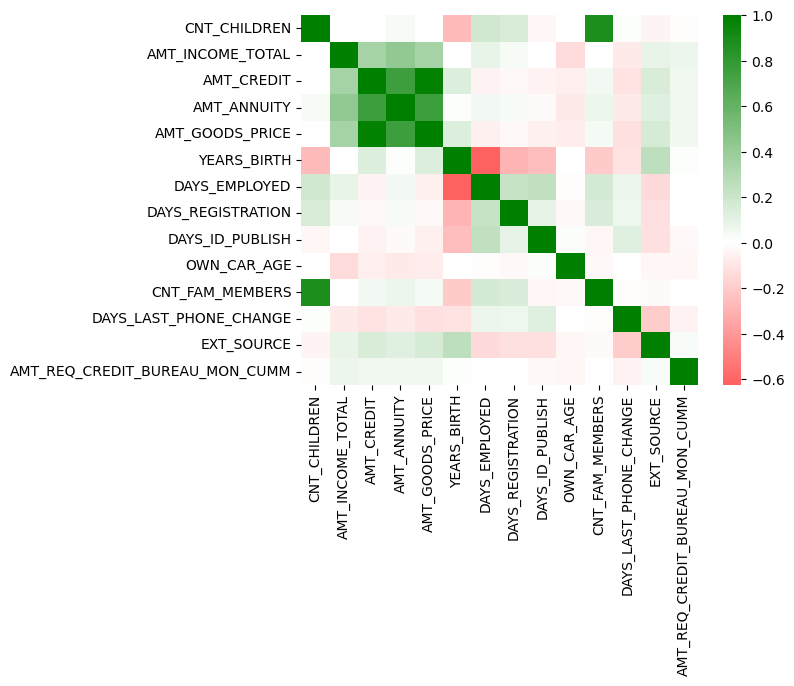

In [147]:
# Red / Green Color Map
cmap_corr = mpl.colors.LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256)

# Plotting Heatmap
sns.heatmap(numr_corr1, cmap=cmap_corr, center=0)
plt.show()

#### Top Correlated Variables

In [148]:
# Calculating Top10
data1 = []
for i in range(len(col_appl_numr)):
    for j in range(i+1, len(col_appl_numr)):
        row = []
        row.append(col_appl_numr[i])
        row.append(col_appl_numr[j])
        row.append(numr_corr1[col_appl_numr[i]][col_appl_numr[j]])
        data1.append(row)
df1 = pd.DataFrame(data1)

# Sorting
lookupcomb1 = df1.sort_values(by=[2], key=lambda x: abs(x), ascending=False).reset_index()
lookupcomb1

,index,0,1,2
0,26,AMT_CREDIT,AMT_GOODS_PRICE,0.982739
1,9,CNT_CHILDREN,CNT_FAM_MEMBERS,0.883554
2,25,AMT_CREDIT,AMT_ANNUITY,0.753014
3,36,AMT_ANNUITY,AMT_GOODS_PRICE,0.752931
4,55,YEARS_BIRTH,DAYS_EMPLOYED,-0.623845
5,14,AMT_INCOME_TOTAL,AMT_ANNUITY,0.428473
6,15,AMT_INCOME_TOTAL,AMT_GOODS_PRICE,0.352929
7,13,AMT_INCOME_TOTAL,AMT_CREDIT,0.351573
8,56,YEARS_BIRTH,DAYS_REGISTRATION,-0.289023
9,4,CNT_CHILDREN,YEARS_BIRTH,-0.262880


# <font color='#00008B'>Bivariant Analysis - Numerical vs Numerical</font>

In [149]:
# Top 10 plus relevant combination
lookupcomb = lookupcomb.head(10)[[0, 1]]
lookupcomb = lookupcomb.append([['AMT_CREDIT', 'EXT_SOURCE']])
lookupcomb.reset_index(drop=True, inplace=True)
lookupcomb

,0,1
0,AMT_CREDIT,AMT_GOODS_PRICE
1,CNT_CHILDREN,CNT_FAM_MEMBERS
2,AMT_ANNUITY,AMT_GOODS_PRICE
3,AMT_CREDIT,AMT_ANNUITY
4,YEARS_BIRTH,DAYS_EMPLOYED
5,AMT_INCOME_TOTAL,AMT_ANNUITY
6,AMT_INCOME_TOTAL,AMT_GOODS_PRICE
7,AMT_INCOME_TOTAL,AMT_CREDIT
8,CNT_CHILDREN,YEARS_BIRTH
9,YEARS_BIRTH,DAYS_REGISTRATION


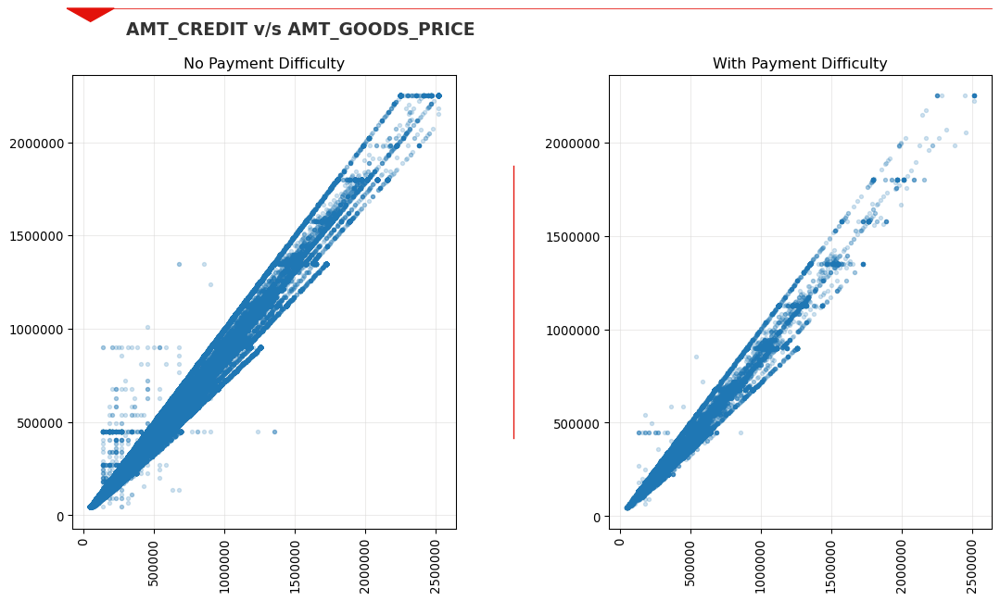

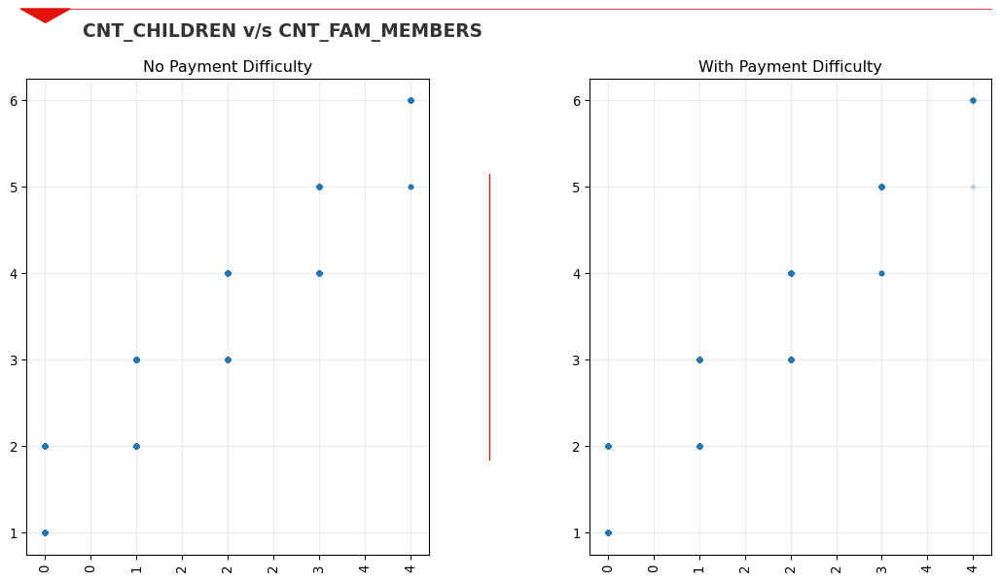

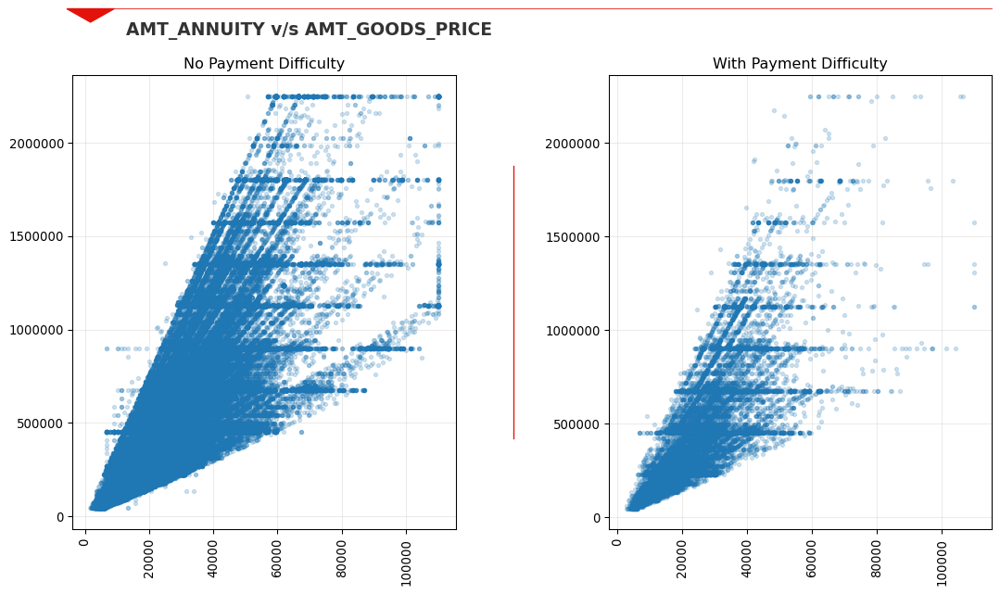

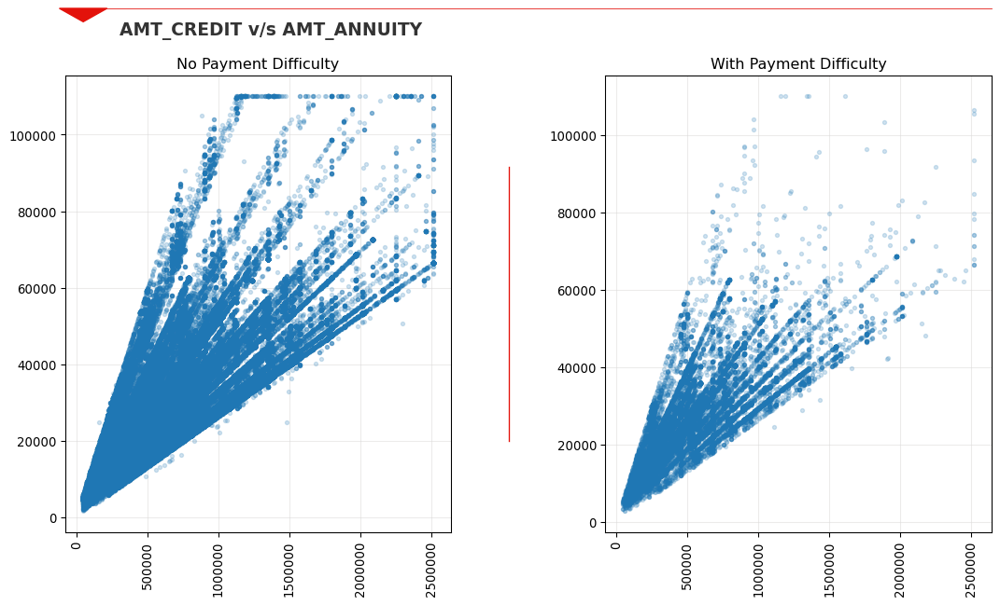

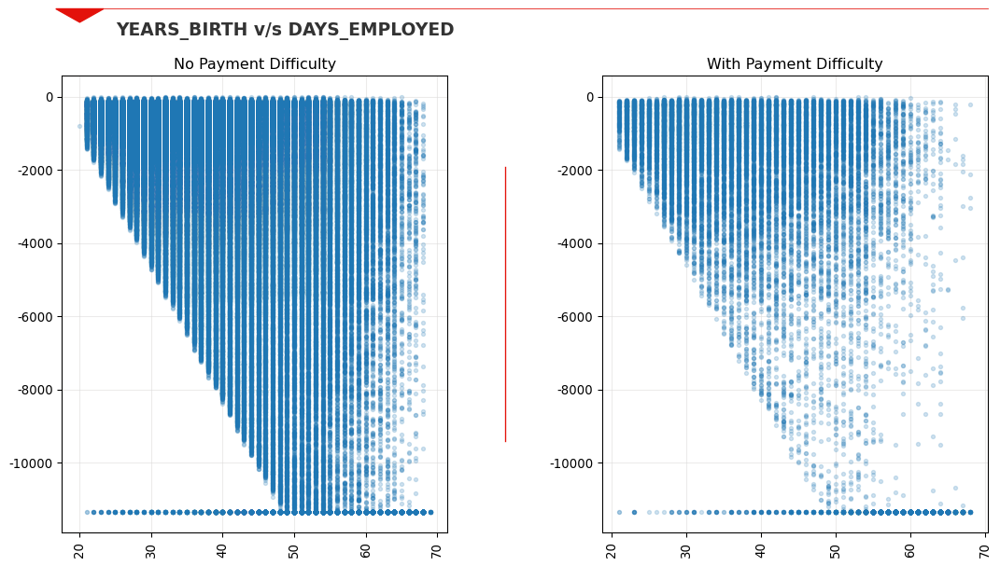

...

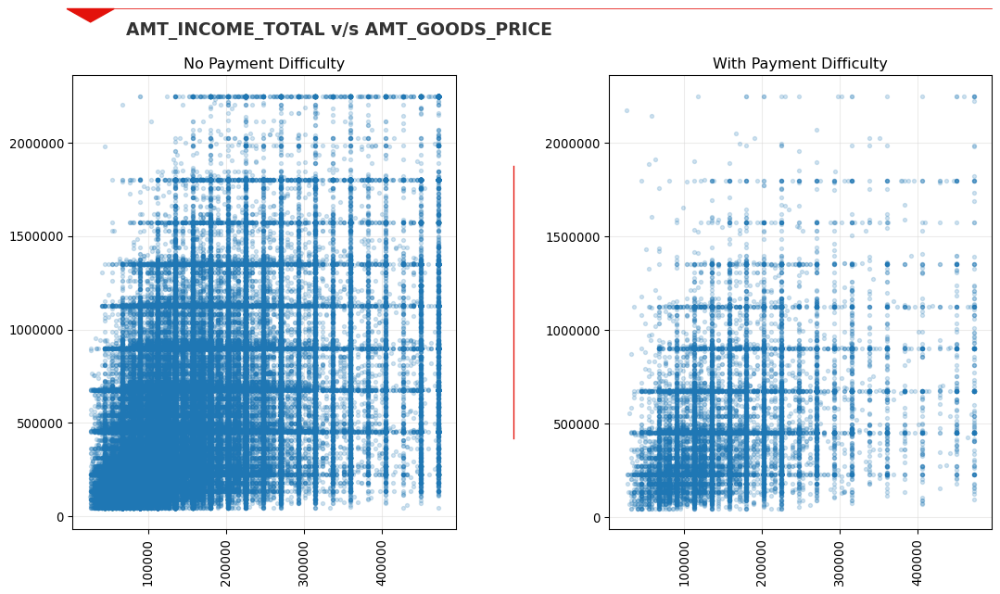

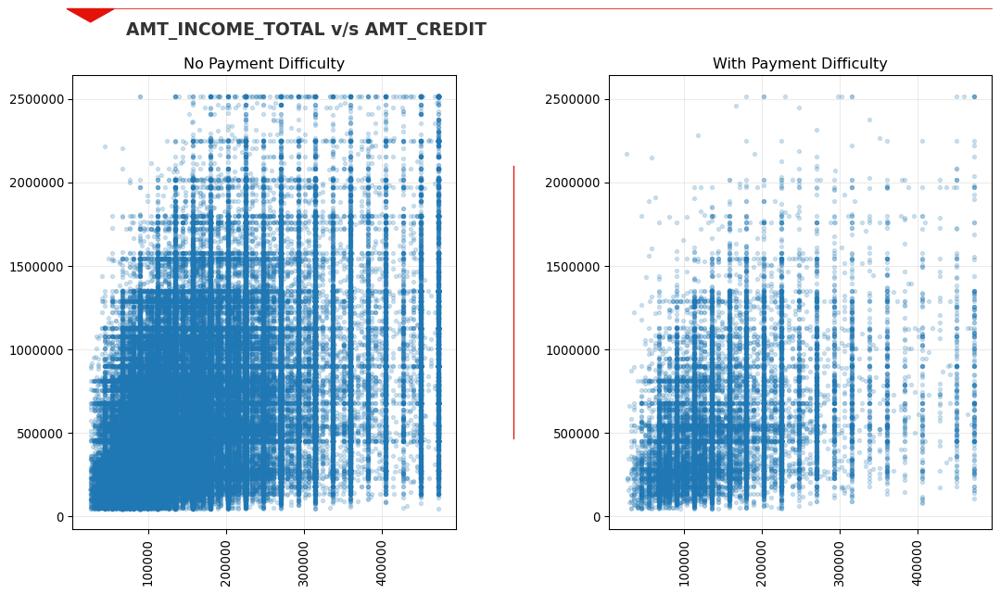

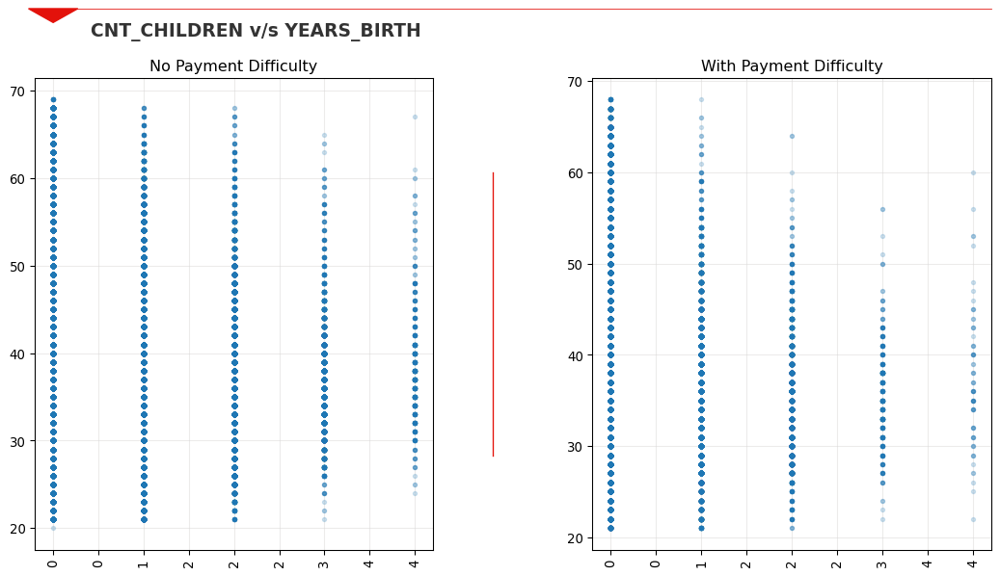

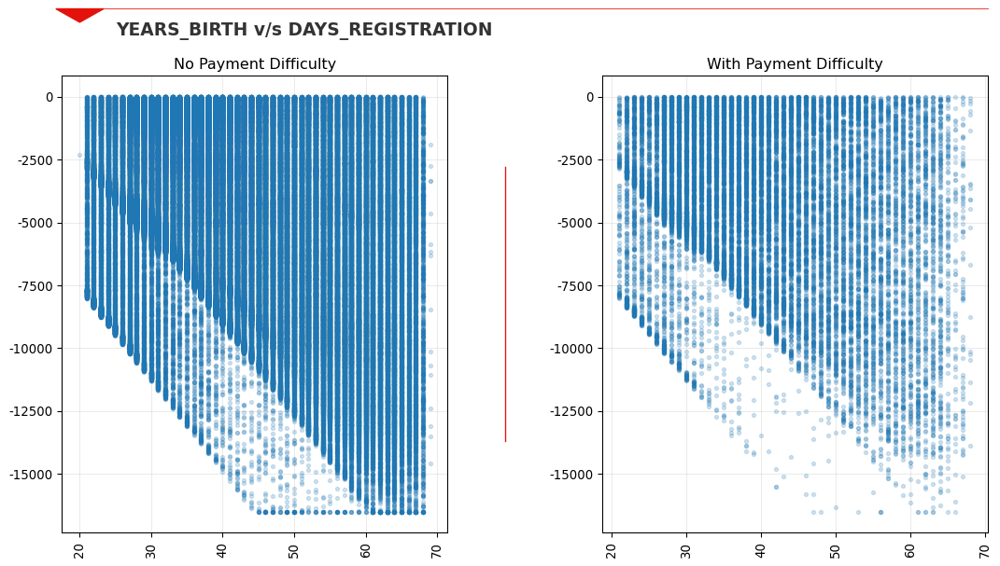

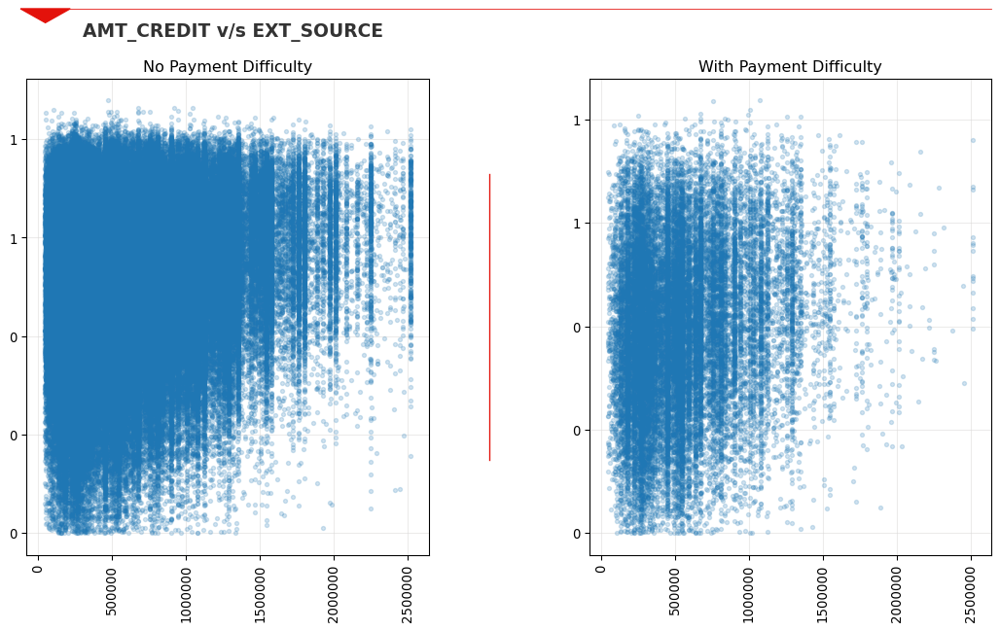

In [150]:
# Looping through Bivariant Analysis - Numerical vs Numerical
for ind in lookupcomb.index:
    drawNumrBi(inp_appl, lookupcomb[0][ind], lookupcomb[1][ind])

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>YEARS_BIRTH v/s DAYS_EMPLOYED</h2>
            <ul>
                <li><b>NAME_INCOME_TYPE</b></li>
                    <ul>
                        <li>As data points drastically reduce for chart ‘With Payment Difficulty’ below 6000. This shows that Clients who are employed for more than 6000 days have very less payment difficulties.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

# <font color='#00008B'>Bivariant Analysis - Categorical vs Categorical</font>

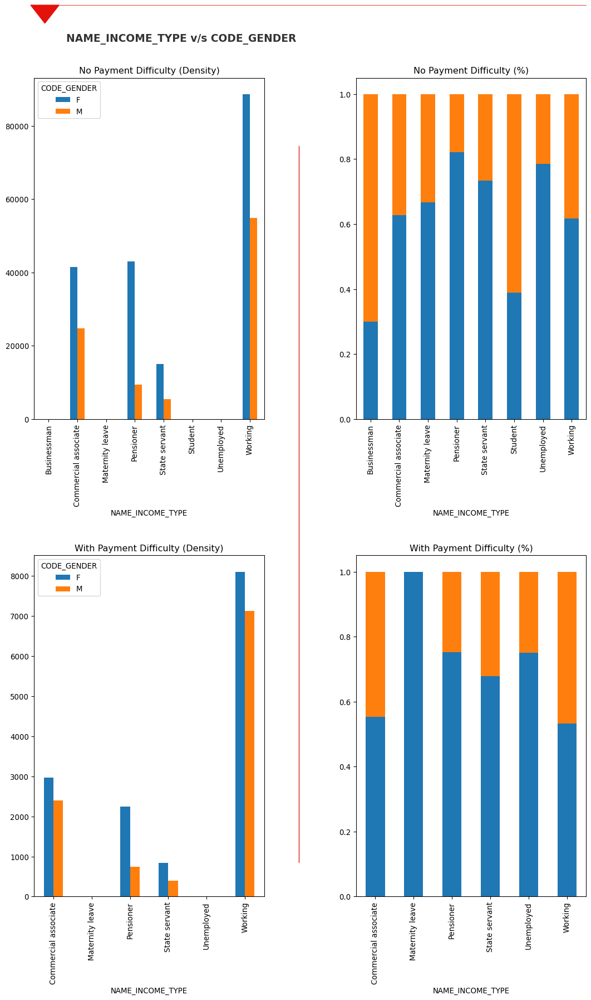

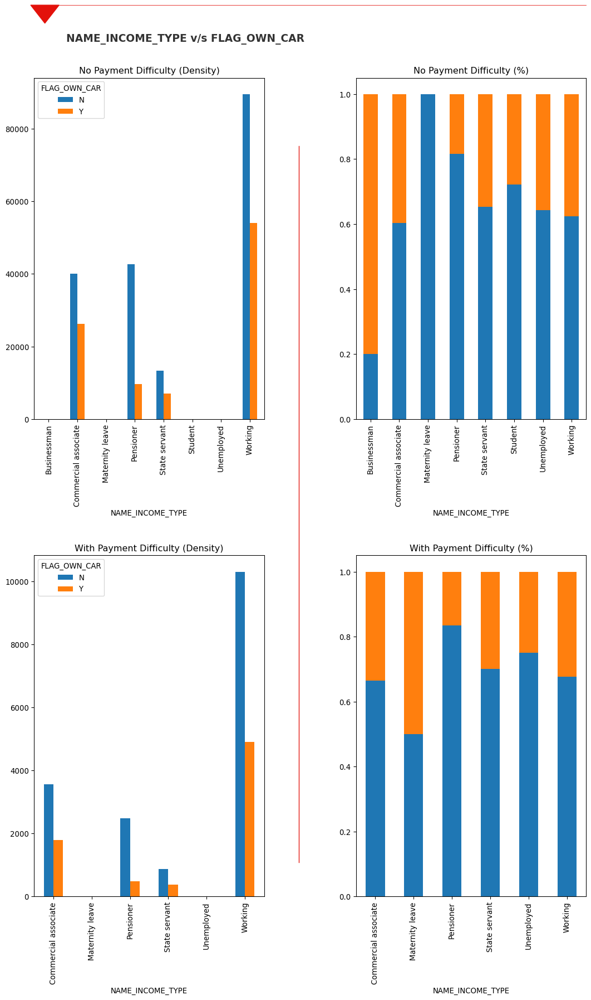

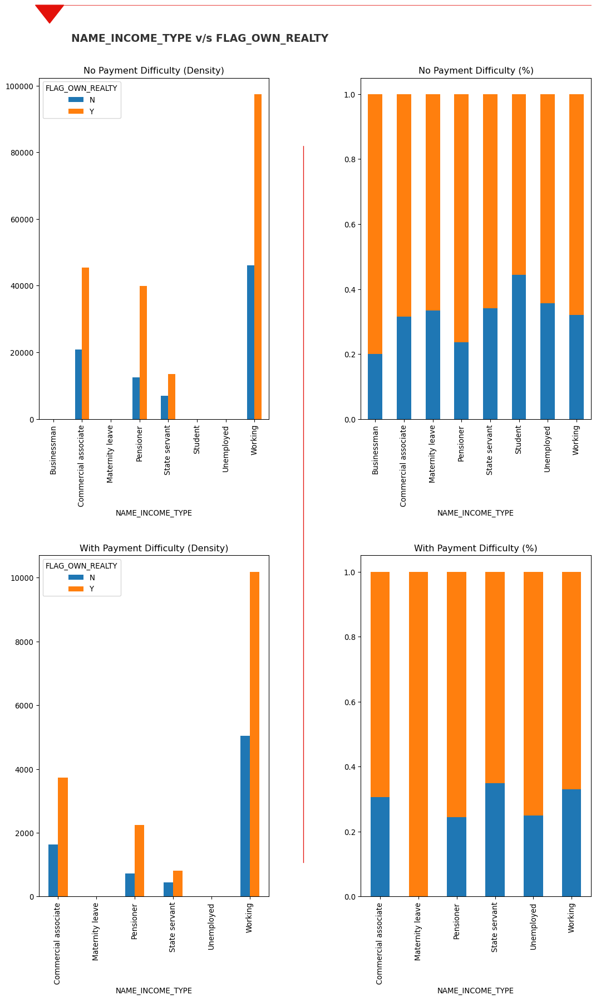

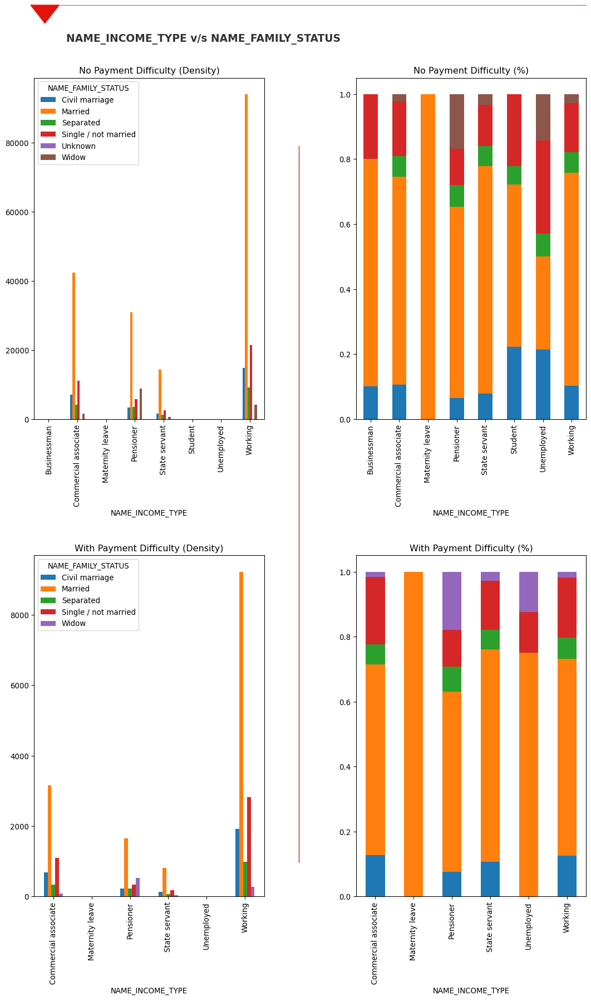

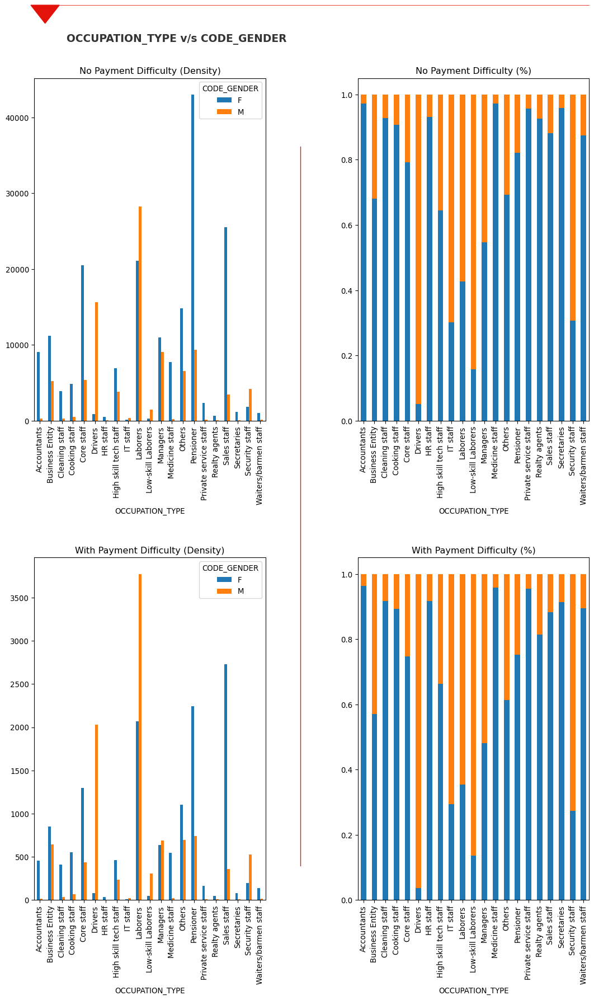

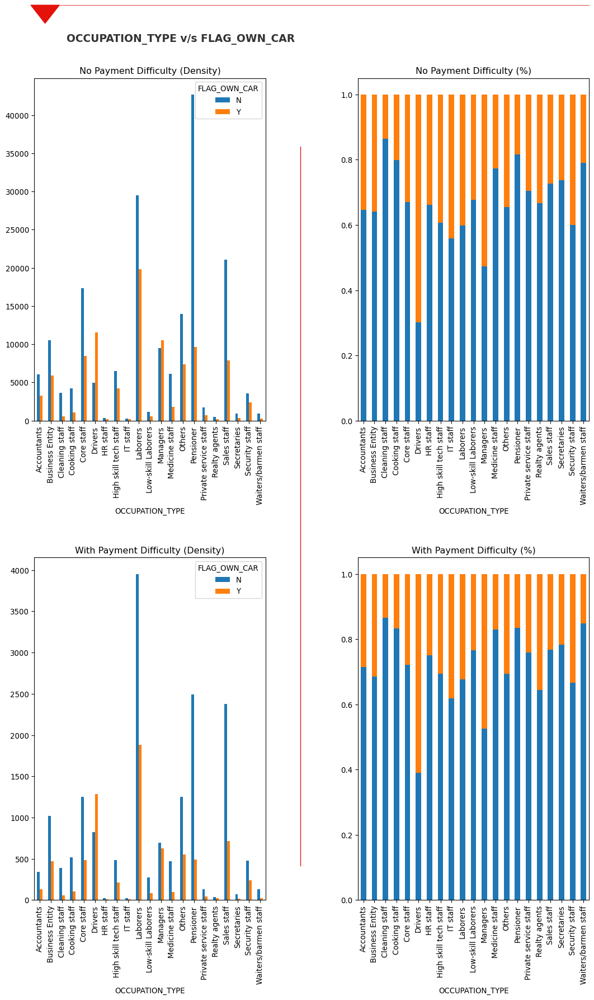

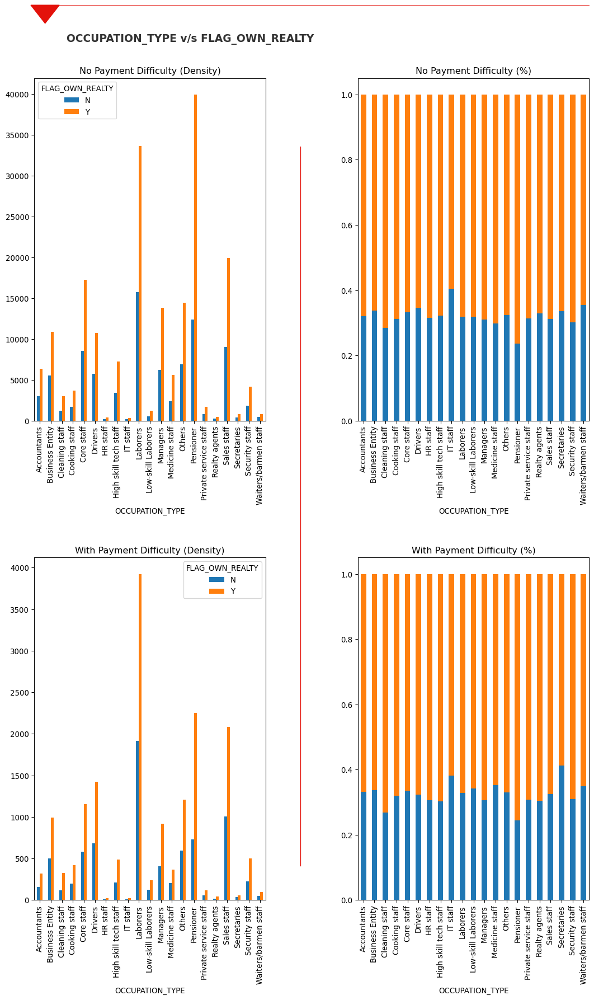

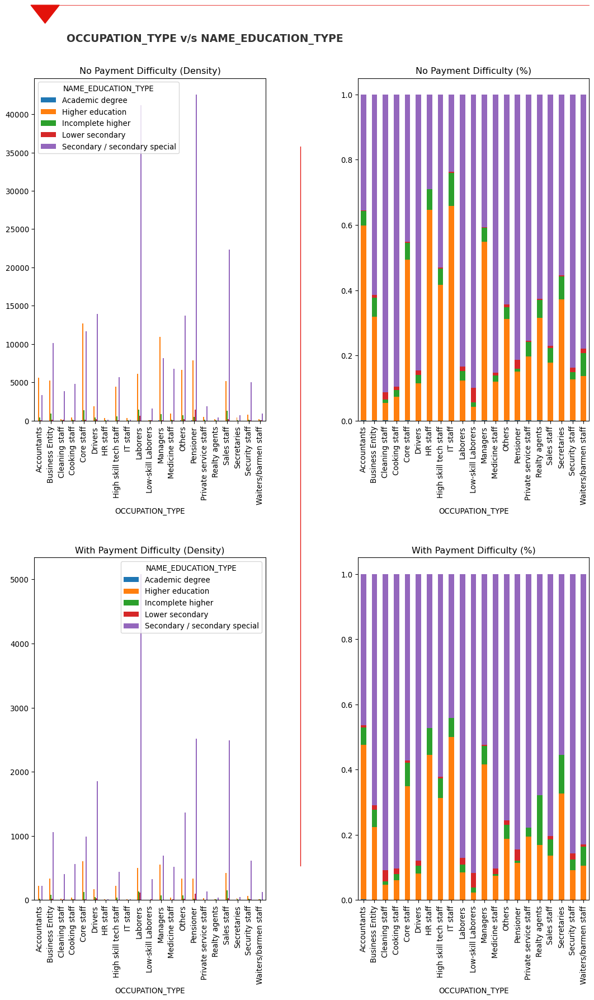

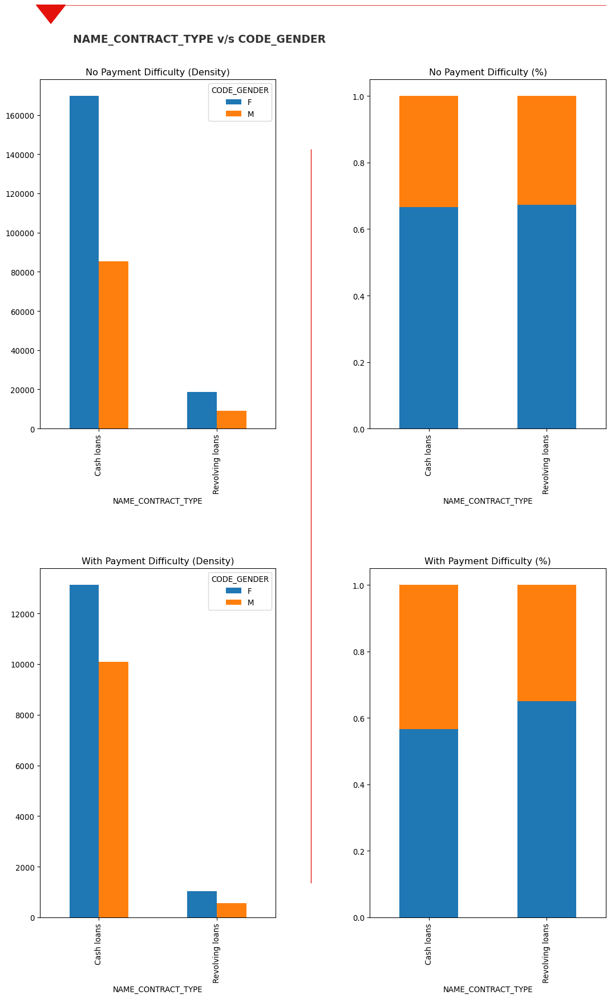

In [151]:
col_appl_cate_cate = [
    ['NAME_INCOME_TYPE', 'CODE_GENDER'], 
    ['NAME_INCOME_TYPE', 'FLAG_OWN_CAR'], 
    ['NAME_INCOME_TYPE', 'FLAG_OWN_REALTY'], 
    ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS'], 
    ['OCCUPATION_TYPE', 'CODE_GENDER'], 
    ['OCCUPATION_TYPE', 'FLAG_OWN_CAR'], 
    ['OCCUPATION_TYPE', 'FLAG_OWN_REALTY'], 
    ['OCCUPATION_TYPE', 'NAME_EDUCATION_TYPE'], 
    ['NAME_CONTRACT_TYPE', 'CODE_GENDER']
]
# Looping through Bivariant Analysis - Categorical vs Categorical
for entry in col_appl_cate_cate:
    drawCateBi(inp_appl, entry[0], entry[1])

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>NAME_INCOME_TYPE v/s FLAG_OWN_CAR</b></li>
                    <ul>
                        <li>Clients with ‘Maternity Leave’ income and own car, have payment difficulty.</li>
                    </ul>
                <li><b>NAME_INCOME_TYPE v/s NAME_FAMILY_STATUS</b></li>
                    <ul>
                        <li>Unemployed clients with family status of ‘Civil marriage’ or ‘Separated’ have NO payment difficulty.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

# <font color='#00008B'>Multivariant Analysis</font>

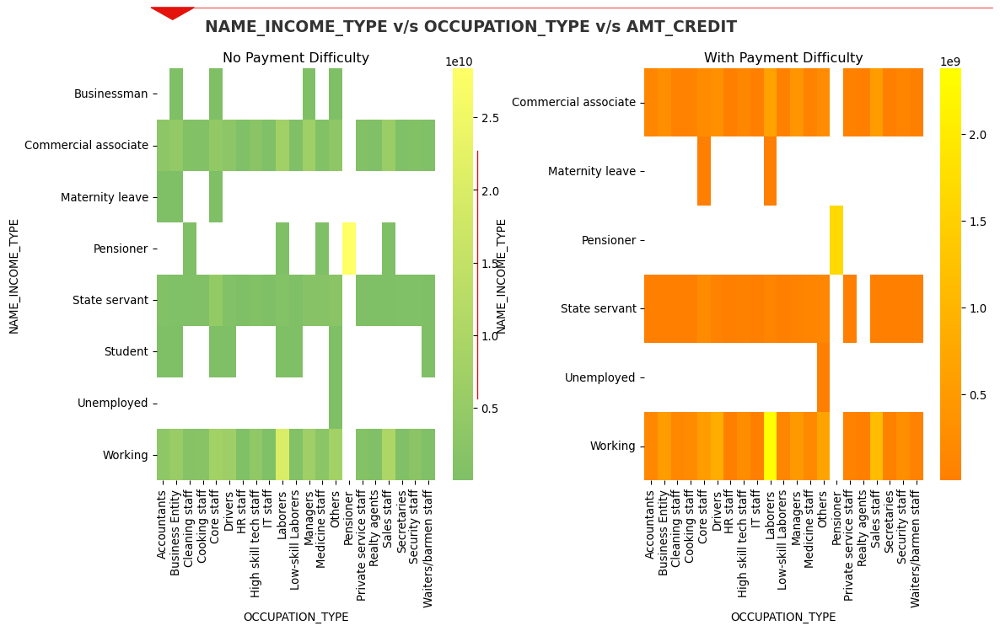

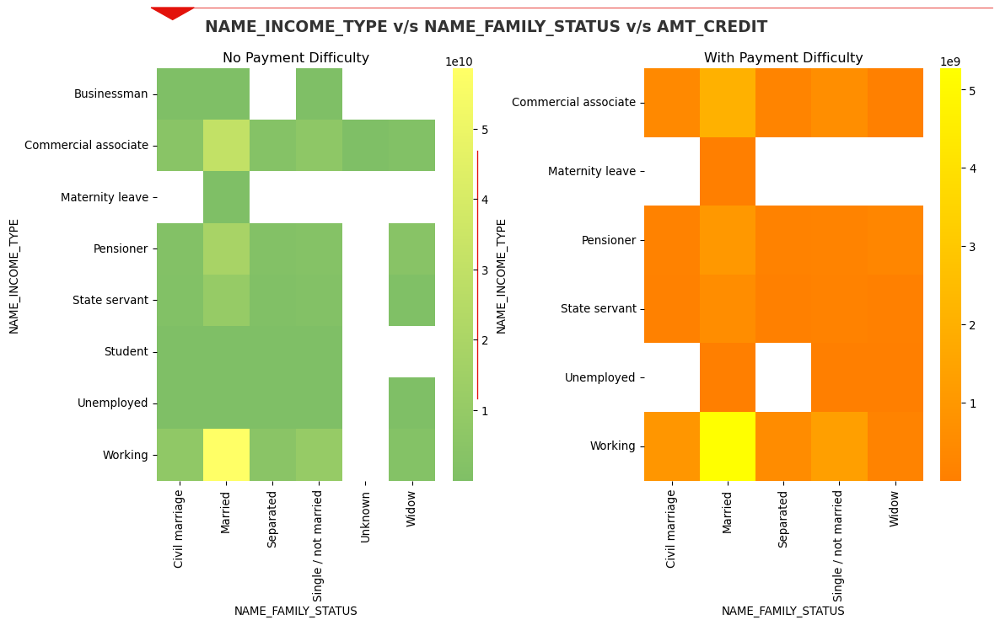

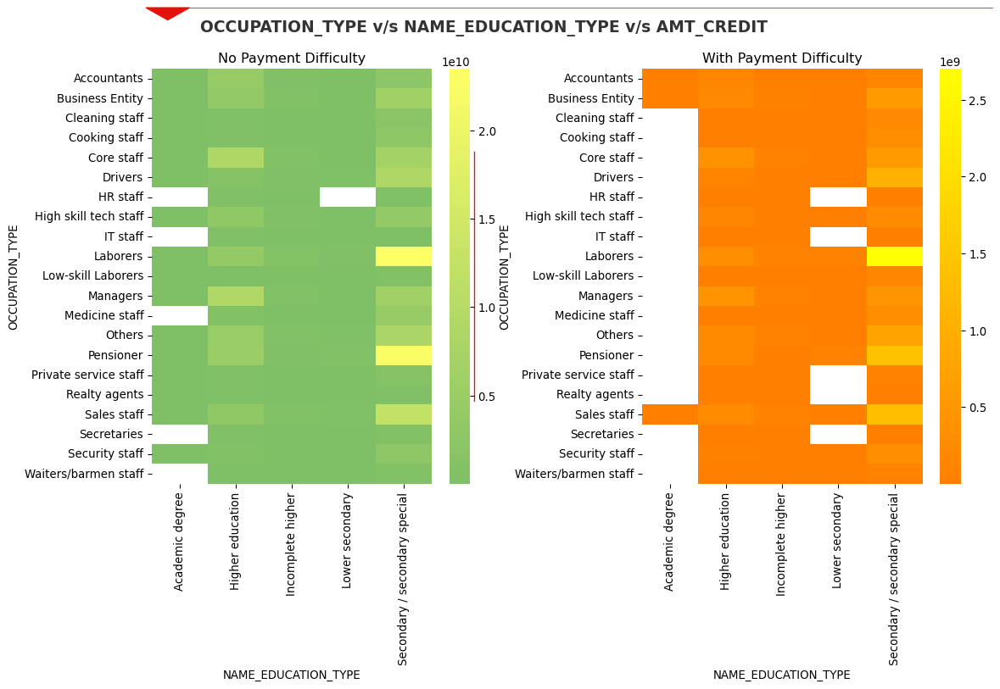

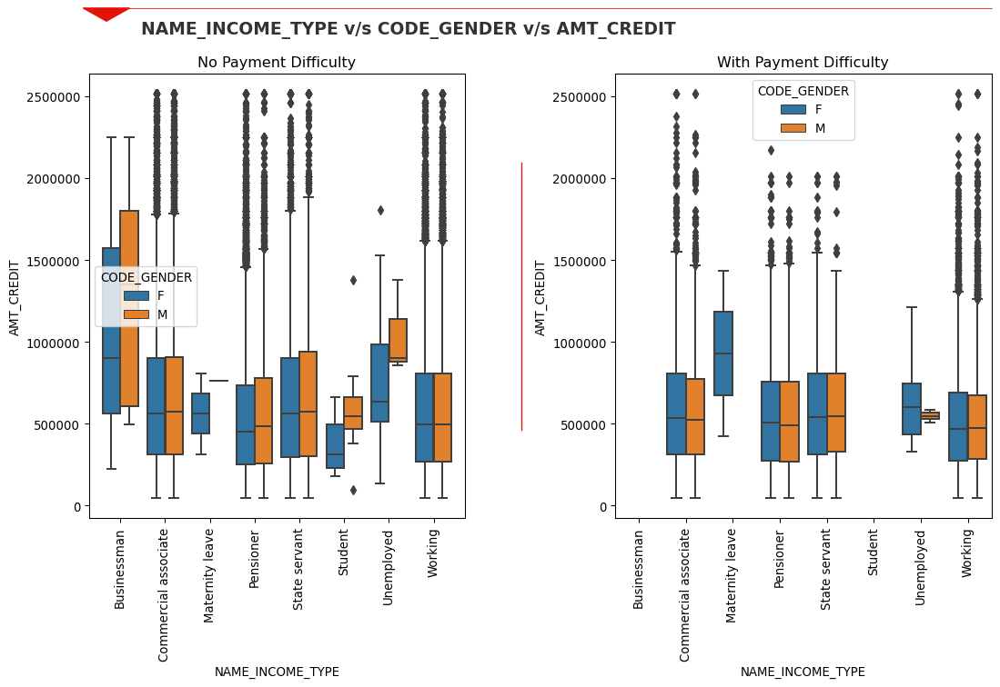

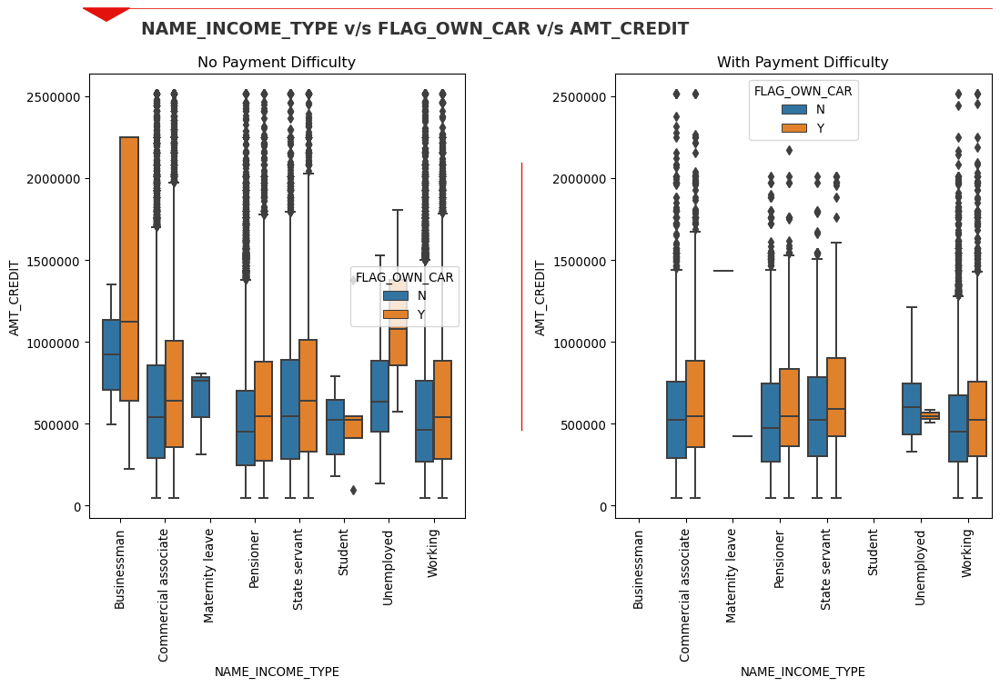

...

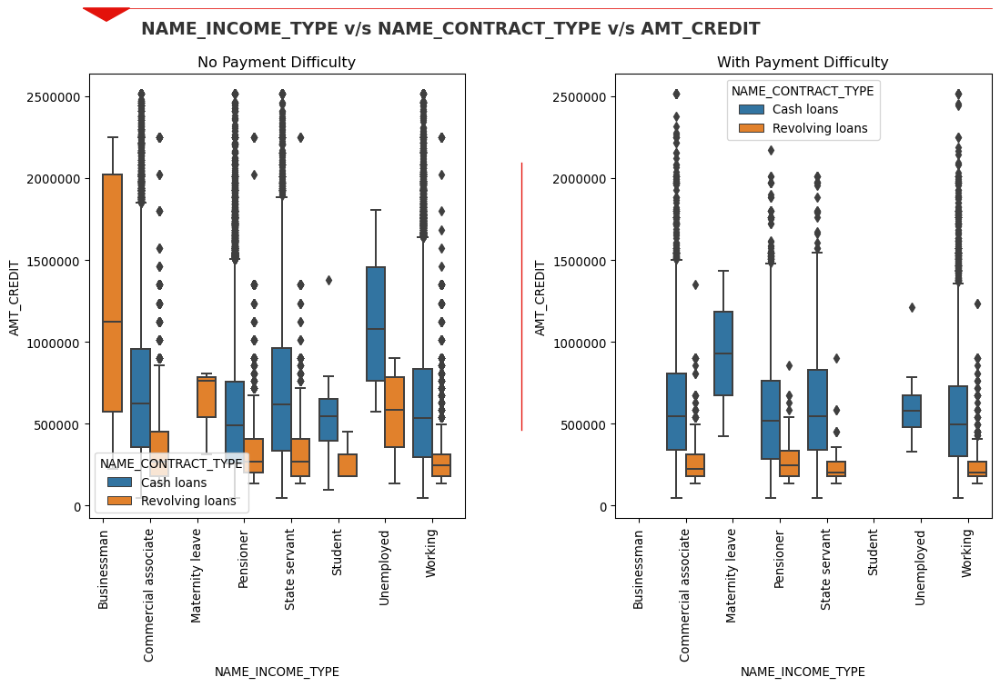

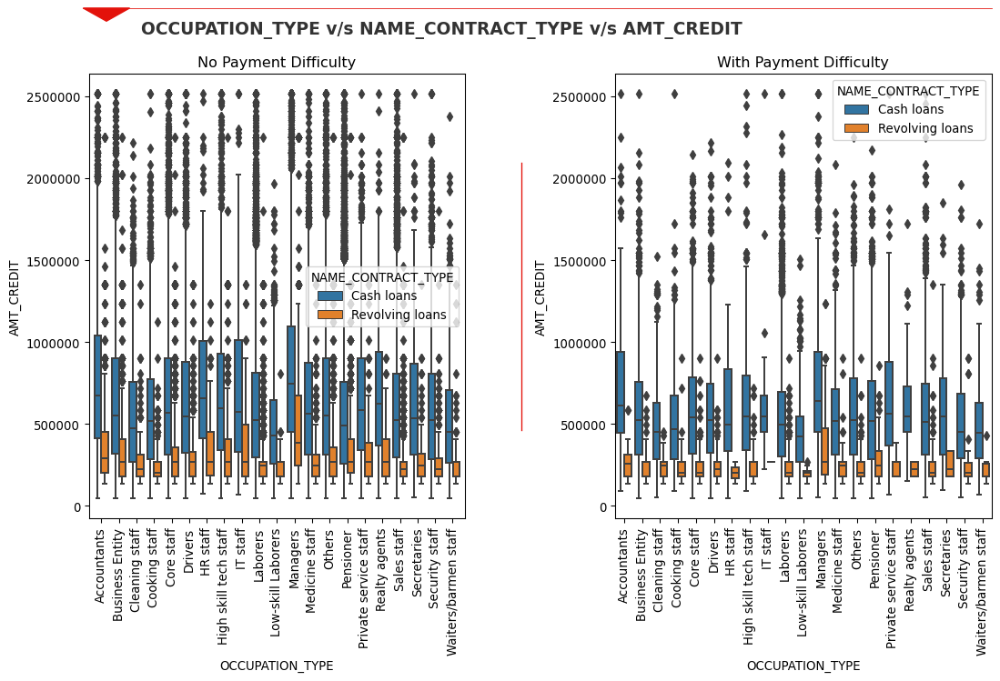

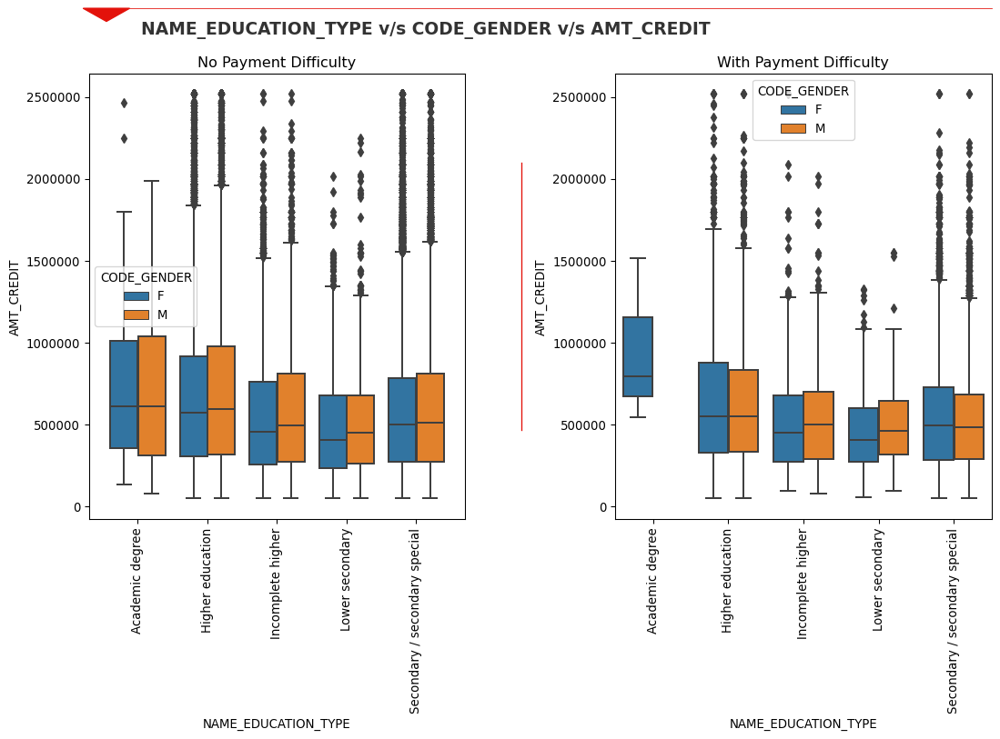

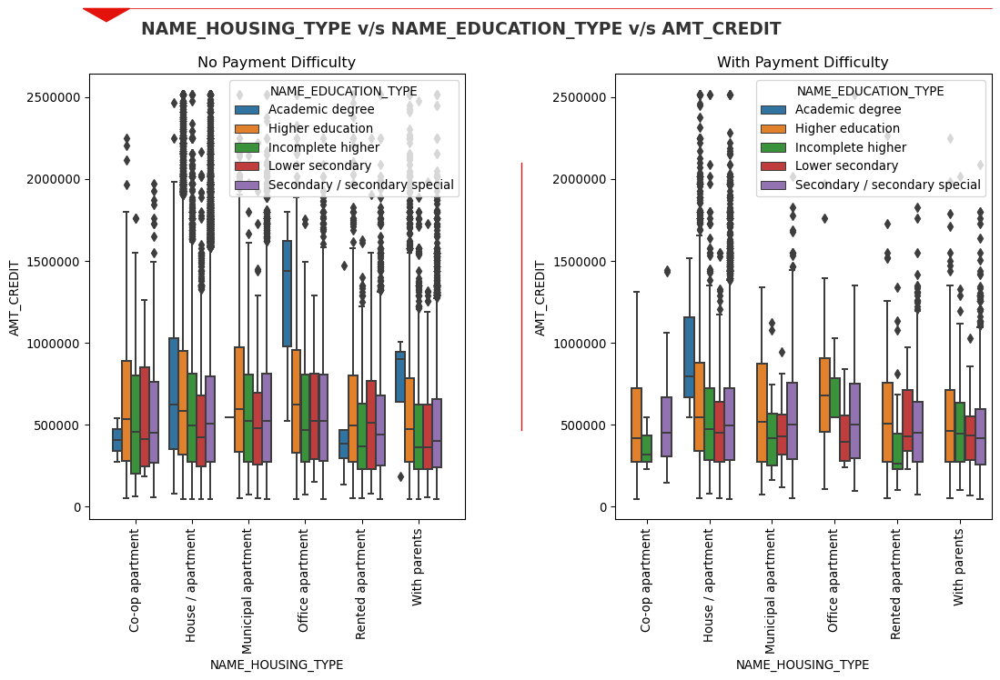

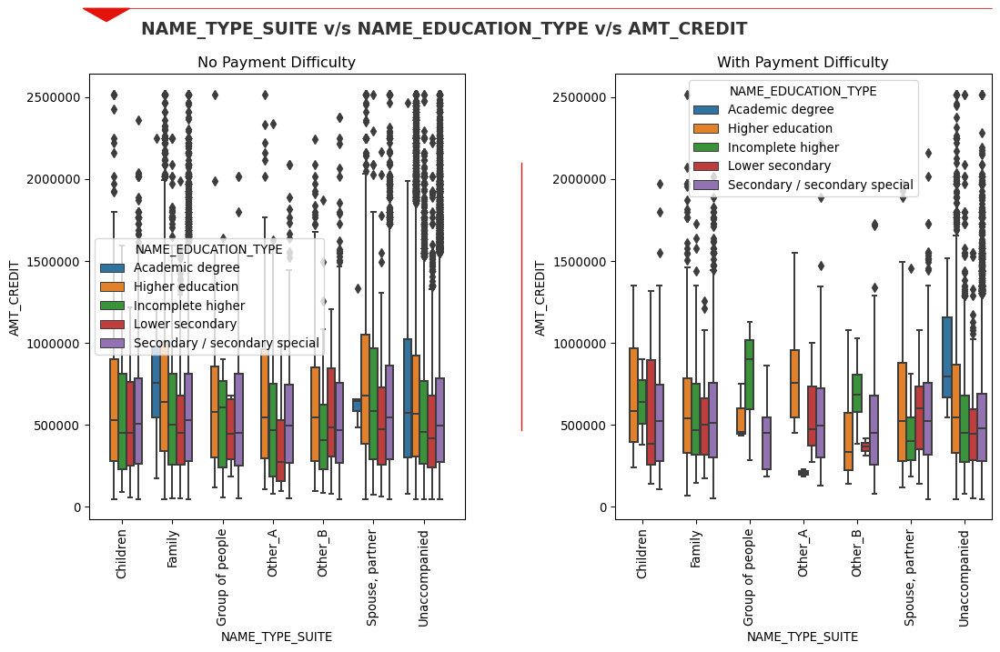

In [152]:
col_appl_cate_cate_numr_boxp = [
    ['NAME_INCOME_TYPE', 'CODE_GENDER', 'AMT_CREDIT'], 
    ['NAME_INCOME_TYPE', 'FLAG_OWN_CAR', 'AMT_CREDIT'], 
    ['NAME_INCOME_TYPE', 'FLAG_OWN_REALTY', 'AMT_CREDIT'], 
    ['OCCUPATION_TYPE', 'CODE_GENDER', 'AMT_CREDIT'], 
    ['OCCUPATION_TYPE', 'FLAG_OWN_CAR', 'AMT_CREDIT'], 
    ['OCCUPATION_TYPE', 'FLAG_OWN_REALTY', 'AMT_CREDIT'], 
    ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'AMT_CREDIT'], 
    ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'AMT_CREDIT'], 
    ['NAME_INCOME_TYPE', 'NAME_CONTRACT_TYPE', 'AMT_CREDIT'], 
    ['OCCUPATION_TYPE', 'NAME_CONTRACT_TYPE', 'AMT_CREDIT'], 
    ['NAME_EDUCATION_TYPE', 'CODE_GENDER', 'AMT_CREDIT'], 
    ['NAME_HOUSING_TYPE', 'NAME_EDUCATION_TYPE', 'AMT_CREDIT'], 
    ['NAME_TYPE_SUITE', 'NAME_EDUCATION_TYPE', 'AMT_CREDIT']
]
col_appl_cate_cate_numr_heat = [
    ['NAME_INCOME_TYPE', 'OCCUPATION_TYPE', 'AMT_CREDIT'], 
    ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'AMT_CREDIT'], 
    ['OCCUPATION_TYPE', 'NAME_EDUCATION_TYPE', 'AMT_CREDIT']
]

# Loop for Heatmap
for entry in col_appl_cate_cate_numr_heat:
    drawMultHeatmap(inp_appl, entry[0], entry[1], entry[2])

# Loop for Boxplot
for entry in col_appl_cate_cate_numr_boxp:
    drawMultBoxp(inp_appl, entry[0], entry[1], entry[2])

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>NAME_INCOME_TYPE v/s OCCUPATION_TYPE v/s AMT_CREDIT</b></li>
                    <ul>
                        <li>Businessman and Students have no payment difficulty.</li>
                        <li>Pensioners with occupation type other than ‘Pensioner’ and <BLANK>, have no payment difficulty.</li>
                    </ul>
                <li><b>OCCUPATION_TYPE v/s CODE_GENDER v/s AMT_CREDIT</b></li>
                    <ul>
                        <li>Male HR staff with higher Credit Amount (above 12 lakh) have higher chances of payment difficulty.</li>
                    </ul>
                <li><b>NAME_INCOME_TYPE v/s NAME_CONTRACT_TYPE v/s AMT_CREDIT</b></li>
                    <ul>
                        <li>Unemployed and client with income type ‘Maternity leave’ have NO payment difficulty in repayment of ‘Revolving loans’.</li>
                        <li>Unemployed and client with income type ‘Maternity leave’ have payment difficulty in repayment of ‘Cash loans’.</li>
                        <li>Businessman and Students have no payment difficulty.</li>
                    </ul>
                <li><b>NAME_EDUCATION_TYPE v/s CODE_GENDER v/s  AMT_CREDIT</b></li>
                    <ul>
                        <li>Male clients with ‘Academic degree’ have no Payment Difficulties.</li>
                    </ul>
                <li><b>NAME_TYPE_SUITE v/s NAME_EDUCATION_TYPE v/s  AMT_CREDIT</b></li>
                    <ul>
                        <li>Clients with ‘Academic degree’ and Accompanied (not ‘Unaccompanied’) have no Payment Difficulties.</li>
                        <li>Clients with ‘Lower secondary’ and categorized part of ‘Group of people’ have no Payment Difficulties.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

# <font color='#00008B'>Data cleaning of previous_application</font>

It is observed that Sometimes by mistake of client or our clerk there could be more applications for one single contract. Rarely it could also be error in our system that one application is in the database twice. All these records are creating redundancy and not required. Also, these records are less than 0.6% of total.

In [153]:
inp_prev.groupby(['FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY']).agg({'SK_ID_PREV':'count'})

SK_ID_PREV
FLAG_LAST_APPL_PER_CONTRACT NFLAG_LAST_APPL_IN_DAY            
N                           0                             5114
                            1                             3361
Y                           0                              786
                            1                          1660953

In [154]:
(5114+3361+786)/1660602*100

0.557689319897242

### Removal of duplicate or old records for same contract from previous data, keeping only latest contract copy

In [155]:
inp_prev = inp_prev[(inp_prev.FLAG_LAST_APPL_PER_CONTRACT == 'Y') & (inp_prev.NFLAG_LAST_APPL_IN_DAY == 1)]

In [156]:
inp_prev.drop(['FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY'], axis=1, inplace=True)

# <font color='#00008B'>Understanding the Relation between application_data and previous_application</font>

* In application_data unique key for each record is SK_ID_CURR, and for previous_application unique key is SK_ID_PREV.
* Common Key between two dataset is SK_ID_CURR.

In [157]:
print("Total Records in application_data        : ", inp_appl.SK_ID_CURR.nunique())
print("Total Records in previous_application    : ", inp_prev.SK_ID_PREV.nunique())
print("Unique SK_ID_CURR in previous_application: ", inp_prev.SK_ID_CURR.nunique())

Total Records in application_data        :  307511
Total Records in previous_application    :  1660953
Unique SK_ID_CURR in previous_application:  338810


### Checking record counts while inner join

In [158]:
merge_inner = pd.merge(left=inp_appl, right=inp_prev, how="inner", 
         left_on="SK_ID_CURR", right_on="SK_ID_CURR", 
         suffixes=('_APPL', '_PREV')).sort_values(['SK_ID_CURR'])
print("After inner join: Unique SK_ID_CURR: ", merge_inner.SK_ID_CURR.nunique())
print("After inner join: Unique SK_ID_PREV: ", merge_inner.SK_ID_PREV.nunique())

After inner join: Unique SK_ID_CURR:  291015
After inner join: Unique SK_ID_PREV:  1405705


### Checking record counts while left join (application_data)

In [159]:
merge_left = pd.merge(left=inp_appl, right=inp_prev, how="left", 
         left_on="SK_ID_CURR", right_on="SK_ID_CURR", 
         suffixes=('_APPL', '_PREV')).sort_values(['SK_ID_CURR'])

In [160]:
merge_left[merge_left.SK_ID_PREV.isnull()].TARGET.value_counts()

0    15512
1      984
Name: TARGET, dtype: int64

In [161]:
merge_left[merge_left.SK_ID_PREV.isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_APPL,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_APPL,AMT_ANNUITY_APPL,AMT_GOODS_PRICE_APPL,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,WEEKDAY_APPR_PROCESS_START_APPL,HOUR_APPR_PROCESS_START_APPL,ORGANIZATION_TYPE,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE,YEARS_BIRTH,AMT_REQ_CREDIT_BUREAU_MON_CUMM,EXT_SOURCE_BINS,SK_ID_PREV,NAME_CONTRACT_TYPE_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION,AMT_CREDIT_PREV,AMT_GOODS_PRICE_PREV,WEEKDAY_APPR_PROCESS_START_PREV,HOUR_APPR_PROCESS_START_PREV,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
68,100024,0,Revolving loans,M,Y,Y,0.0,135000.0,427500.0,21375.0,427500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,-4286.0,-298.0,-1800,7.0,Laborers,2.0,FRIDAY,13,Self-employed,-296.0,0.339515,50,0.0,.3-.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,100031,1,Cash loans,F,N,Y,0.0,112500.0,979992.0,27076.5,702000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,-2628.0,-6573.0,-1827,NaN,Cooking staff,1.0,MONDAY,9,Business Entity Type 3,-161.0,0.369592,51,0.0,.3-.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201,100058,0,Revolving loans,F,N,Y,0.0,54000.0,135000.0,6750.0,135000.0,Unaccompanied,State servant,Higher education,Married,House / apartment,-1176.0,-1149.0,-2576,NaN,Core staff,2.0,THURSDAY,9,School,0.0,0.528841,33,0.0,.5-.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,100076,0,Cash loans,M,Y,N,0.0,180000.0,315000.0,9679.5,315000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,-2546.0,-5448.0,-4097,1.0,Drivers,2.0,MONDAY,12,Transport: type 3,-3.0,0.339979,37,0.0,.3-.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
393,100096,1,Cash loans,F,N,Y,0.0,81000.0,252000.0,14593.5,252000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,-11338.0,-5391.0,-4199,NaN,Pensioner,2.0,THURSDAY,10,NaN,0.0,0.372448,67,0.0,.3-.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1420869,455951,0,Cash loans,M,Y,N,2.0,247500.0,1125000.0,50314.5,1125000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,-5395.0,-7365.0,-6,14.0,Others,4.0,THURSDAY,16,Housing,-2582.0,0.485870,45,0.0,.4-.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1421556,456113,0,Cash loans,M,N,Y,3.0,180000.0,1096020.0,56092.5,900000.0,Other_B,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,-2056.0,-1780.0,-3092,NaN,Others,5.0,SUNDAY,15,Government,-1780.0,0.524502,28,0.0,.5-.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1421767,456155,0,Cash loans,F,N,Y,0.0,202500.0,1971072.0,68643.0,1800000.0,Family,Pensioner,Higher education,Married,House / apartment,-11338.0,-8689.0,-5049,NaN,Pensioner,2.0,FRIDAY,14,NaN,0.0,0.710292,62,0.0,.7-.8,NaN,NaN,NaN,NaN,NaN,NaN,Na

### Checking record counts while right join (previous_application)

In [162]:
merge_right = pd.merge(left=inp_appl, right=inp_prev, how="right", 
         left_on="SK_ID_CURR", right_on="SK_ID_CURR", 
         suffixes=('_APPL', '_PREV')).sort_values(['SK_ID_CURR'])

In [163]:
merge_right[merge_right.TARGET.isnull()].NAME_CONTRACT_STATUS.value_counts()

Approved        150587
Canceled         56878
Refused          44122
Unused offer      3661
Name: NAME_CONTRACT_STATUS, dtype: int64

In [164]:
merge_right[merge_right.TARGET.isnull()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_APPL,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_APPL,AMT_ANNUITY_APPL,AMT_GOODS_PRICE_APPL,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,WEEKDAY_APPR_PROCESS_START_APPL,HOUR_APPR_PROCESS_START_APPL,ORGANIZATION_TYPE,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE,YEARS_BIRTH,AMT_REQ_CREDIT_BUREAU_MON_CUMM,EXT_SOURCE_BINS,SK_ID_PREV,NAME_CONTRACT_TYPE_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION,AMT_CREDIT_PREV,AMT_GOODS_PRICE_PREV,WEEKDAY_APPR_PROCESS_START_PREV,HOUR_APPR_PROCESS_START_PREV,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
200551,100001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1369693,Consumer loans,3951.000,24835.5,23787.0,24835.5,FRIDAY,13,NaN,Approved,-1740,Cash through the bank,NaN,Refreshed,Mobile,POS,NaN,Country-wide,23,Connectivity,8.0,high,POS mobile with interest,NaN,-1709.0,-1499.0,-1619.0,-1612.0
1252109,100005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1857999,Cash loans,NaN,0.0,0.0,NaN,FRIDAY,10,NaN,Canceled,-315,NaN,NaN,Repeater,NaN,NaN,NaN,Credit and cash offices,-1,NaN,NaN,NaN,Cash,NaN,NaN,NaN,NaN,NaN
1371268,100005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2495675,Consumer loans,4813.200,44617.5,40153.5,44617.5,THURSDAY,11,NaN,Approved,-757,Cash through the bank,NaN,New,Mobile,POS,NaN,Country-wide,37,Connectivity,12.0,high,POS mobile with interest,NaN,-706.0,-376.0,-466.0,-460.0
336148,100013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1222069,Cash loans,NaN,0.0,0.0,NaN,WEDNESDAY,16,NaN,Canceled,-222,NaN,NaN,Repeater,NaN,NaN,NaN,Credit and cash offices,-1,NaN,NaN,NaN,Cash,NaN,NaN,NaN,NaN,NaN
384061,100013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1594297,Cash loans,23153.985,450000.0,512370.0,450000.0,SATURDAY,12,NaN,Approved,-856,Cash through the bank,NaN,Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,36.0,middle,Cash X-Sell: middle,NaN,-826.0,224.0,-346.0,-344.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1459233,456250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1740566,Cash loans,26474.625,225000.0,239850.0,225000.0,MONDAY,4,NaN,Approved,-737,NaN,NaN,Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,12.0,high,Cash X-Sell: high,NaN,-707.0,-377.0,-377.0,-374.0
550455,456250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1511244,Cash loans,NaN,0.0,0.0,NaN,THURSDAY,7,NaN,Canceled,-454,NaN,NaN,Repeater,NaN,NaN,NaN,Credit and cash offices,-1,NaN,NaN,NaN,Cash,NaN,NaN,NaN,NaN,NaN
1088427,456250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1482581,Revolving loans,NaN,0.0,0.0,NaN,MONDAY,11,NaN,Canceled,-373,NaN,NaN,Repeater,NaN,NaN,NaN,Credit and cash offices,-1,NaN,NaN,NaN,Card Street,NaN,NaN,NaN,NaN,NaN
1432460,456250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26260

#### Cleaning up memory

In [165]:
import gc

# Delete the unused DataFrame
del merge_left
del merge_right
del inp_prev

# Perform garbage collection
gc.collect()

71476

### <font color='blue'>Conclusion for relation between application_data and previous_application</font>

* application_data and previous_application data has common key SK_ID_CURR.
* application_data and previous_application data has one-to-many relationship between two.
* Relation is soft at both end, which means both have records for which there is no corrosponding record in other dataset.
* <b>Missing records in previous application dataset corrosponding to particular SK_ID_CURR from application data is because of clients that don't have any loan history with bank.</b>
* Approximately 95% of records in application_data found a match in previous_application.
* For further analysis, <b>data merged based on inner join is used</b>.

# <font color='#00008B'>Analysis of new columns on merged dataset</font>

In [166]:
merge_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1405705 entries, 0 to 1405704
Data columns (total 58 columns):
 #   Column                           Non-Null Count    Dtype   
---  ------                           --------------    -----   
 0   SK_ID_CURR                       1405705 non-null  int64   
 1   TARGET                           1405705 non-null  int64   
 2   NAME_CONTRACT_TYPE_APPL          1405705 non-null  object  
 3   CODE_GENDER                      1405705 non-null  object  
 4   FLAG_OWN_CAR                     1405705 non-null  object  
 5   FLAG_OWN_REALTY                  1405705 non-null  object  
 6   CNT_CHILDREN                     1405705 non-null  float64 
 7   AMT_INCOME_TOTAL                 1405705 non-null  float64 
 8   AMT_CREDIT_APPL                  1405705 non-null  float64 
 9   AMT_ANNUITY_APPL                 1405705 non-null  float64 
 10  AMT_GOODS_PRICE_APPL             1405705 non-null  float64 
 11  NAME_TYPE_SUITE                  1405

# <font color='#00008B'>Data Categorisation for Analysis</font>

#### Categorical Columns List for Analysis

In [167]:
col_prev_cate = ['NAME_CONTRACT_TYPE_PREV', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'NAME_CLIENT_TYPE', 
                 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 
                 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION', 
                 'WEEKDAY_APPR_PROCESS_START_PREV', 'HOUR_APPR_PROCESS_START_PREV']

#### Numerical Columns List for Analysis

In [168]:
col_prev_numr = ['AMT_ANNUITY_PREV', 'AMT_APPLICATION', 'AMT_CREDIT_PREV', 'AMT_GOODS_PRICE_PREV', 'CNT_PAYMENT']

# <font color='#00008B'>Data Analysis (Merged Dataset) - Univariant (additional Columns)</font>

#### Categorical Variables

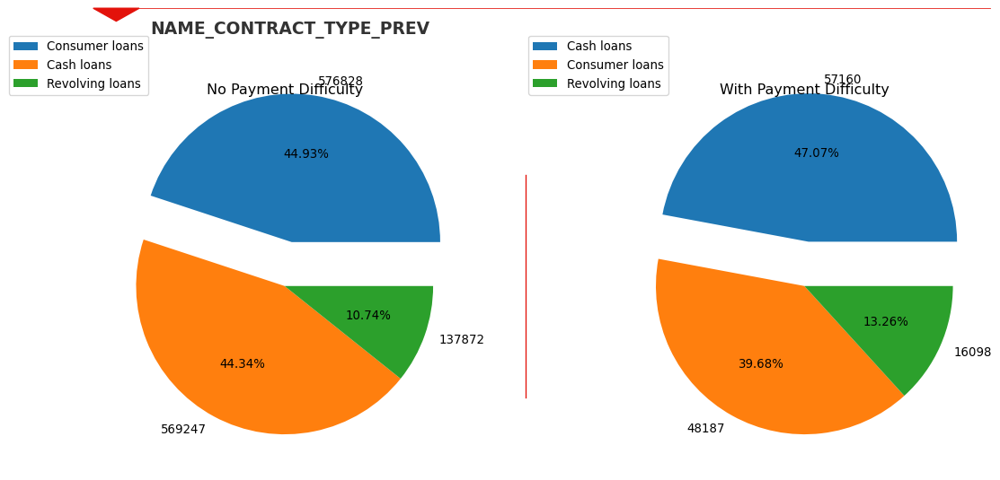

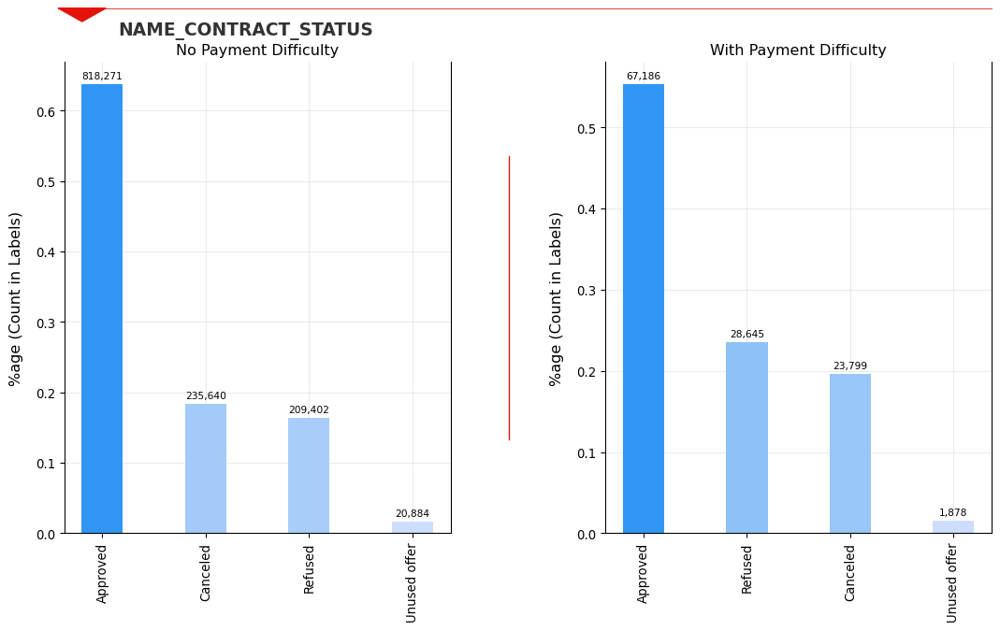

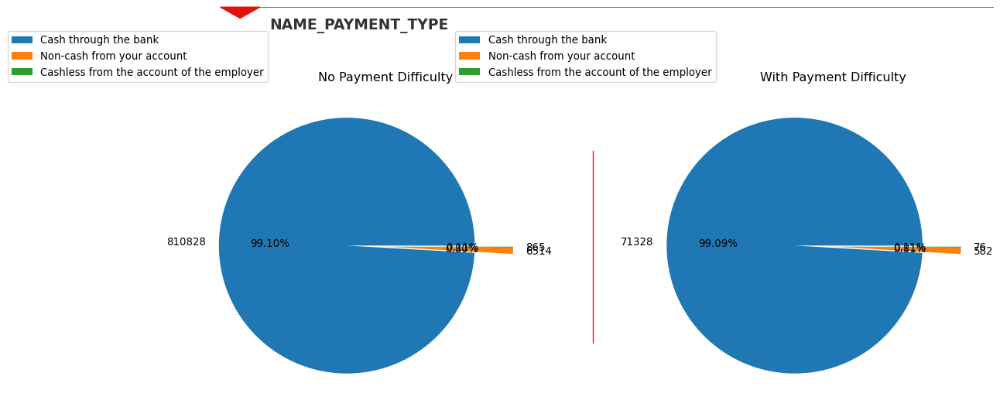

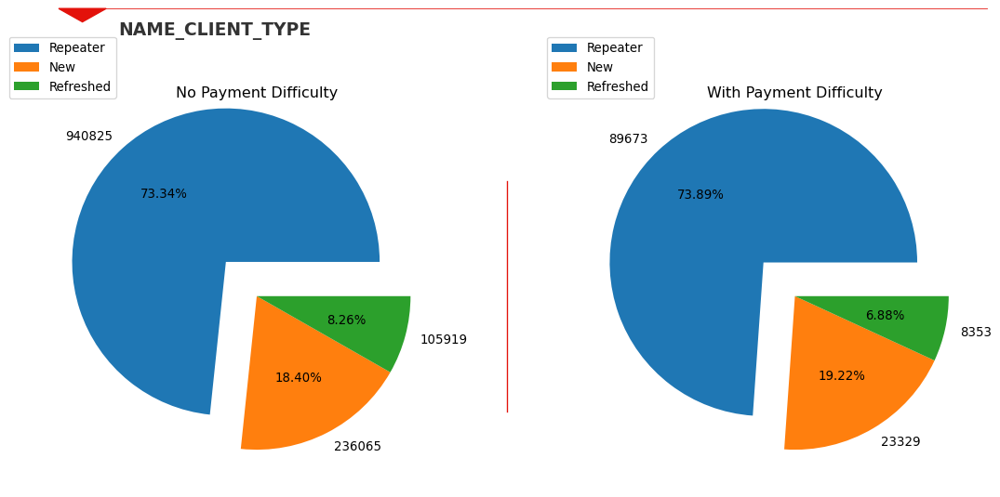

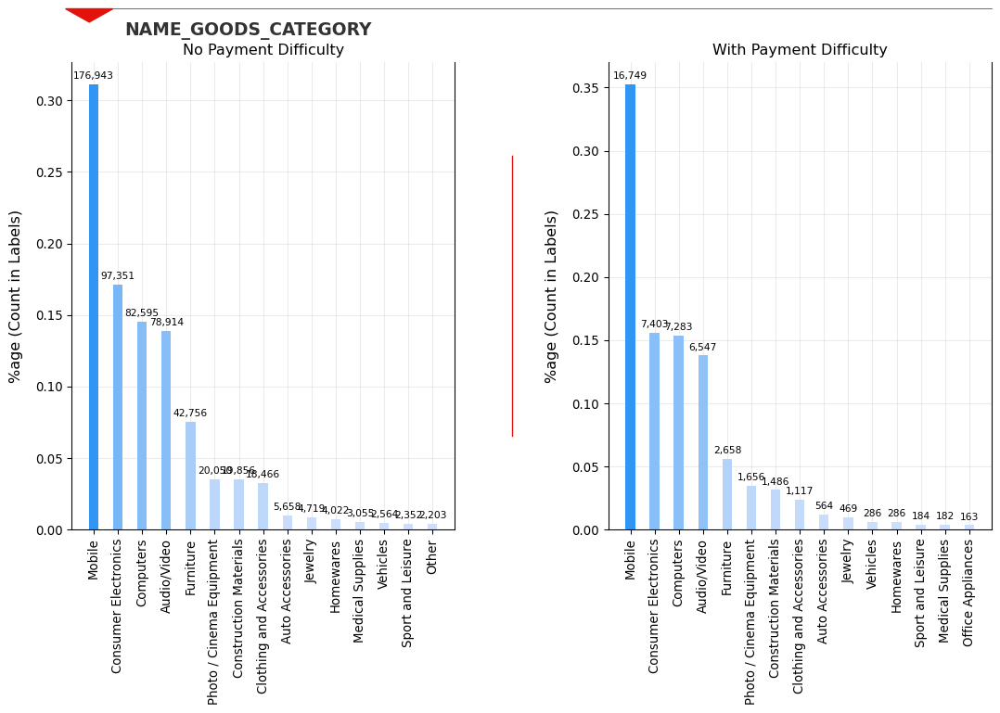

...

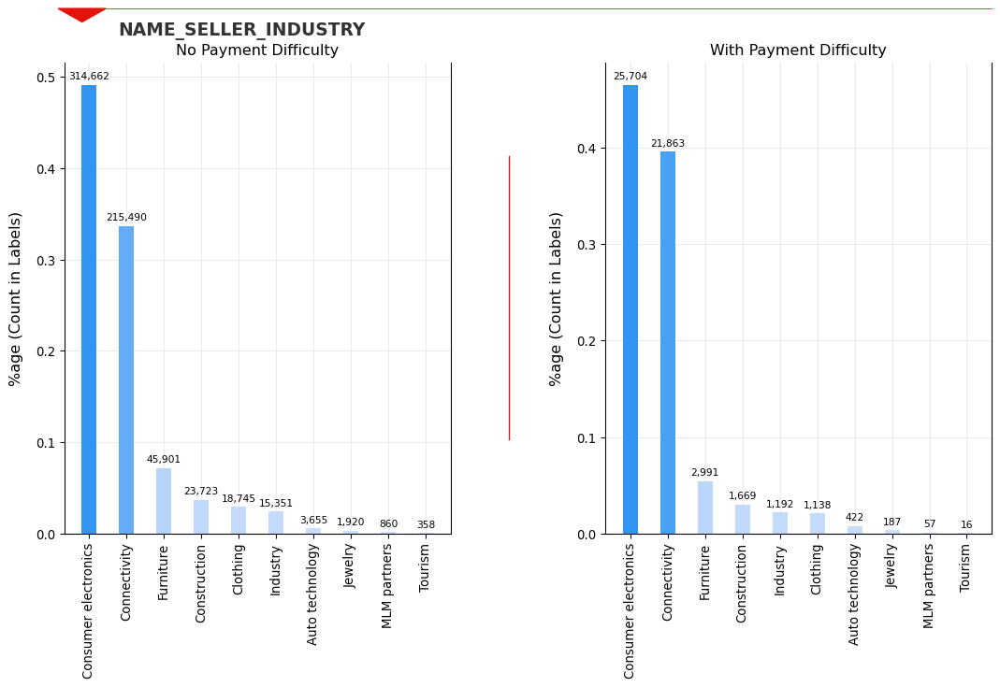

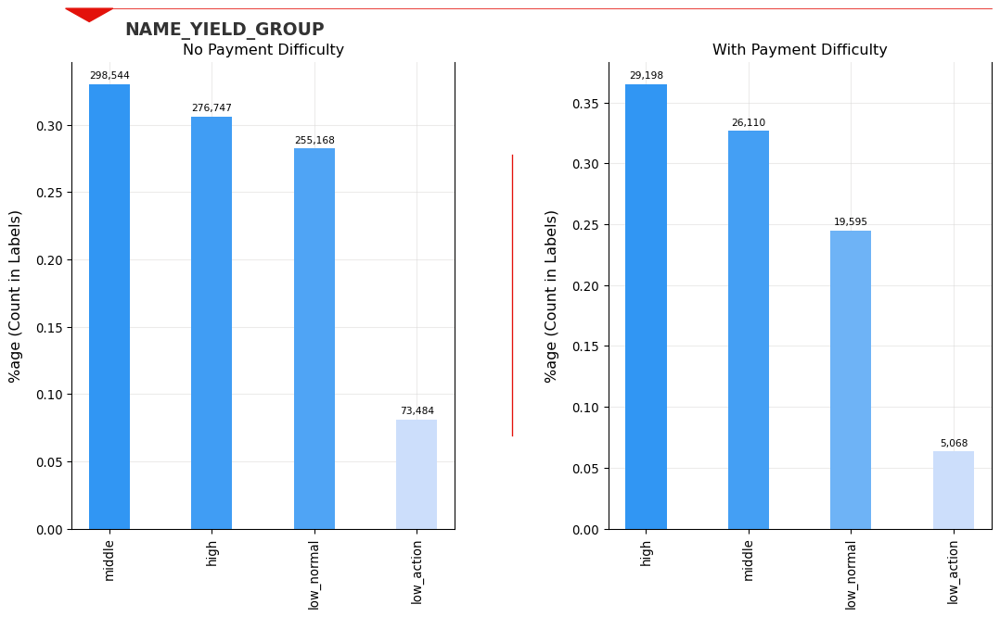

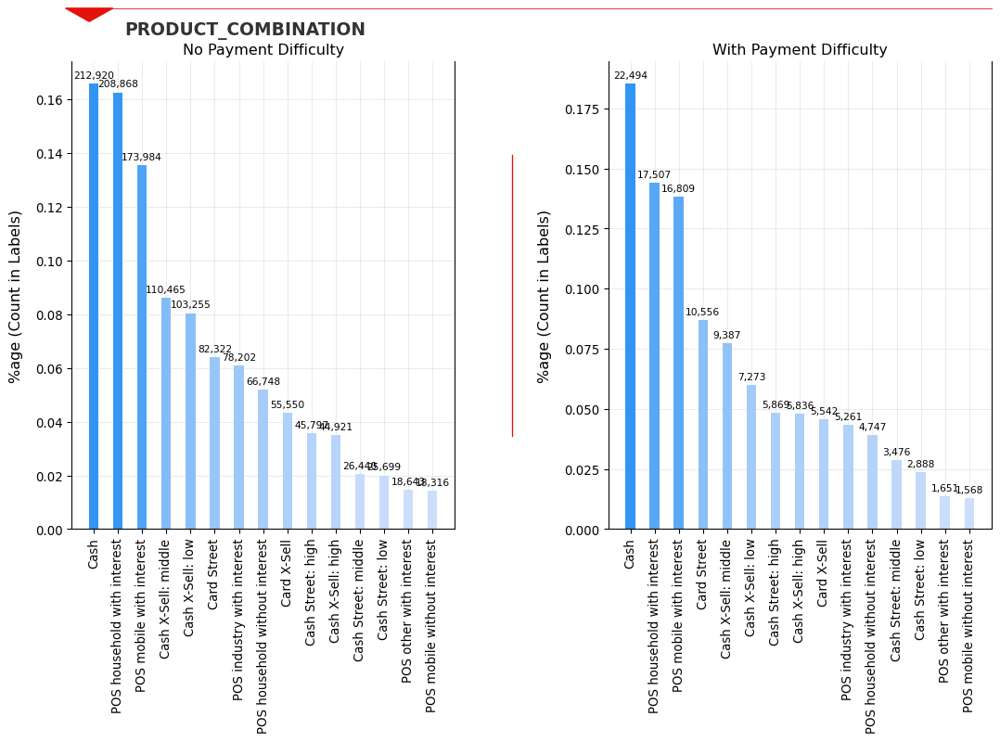

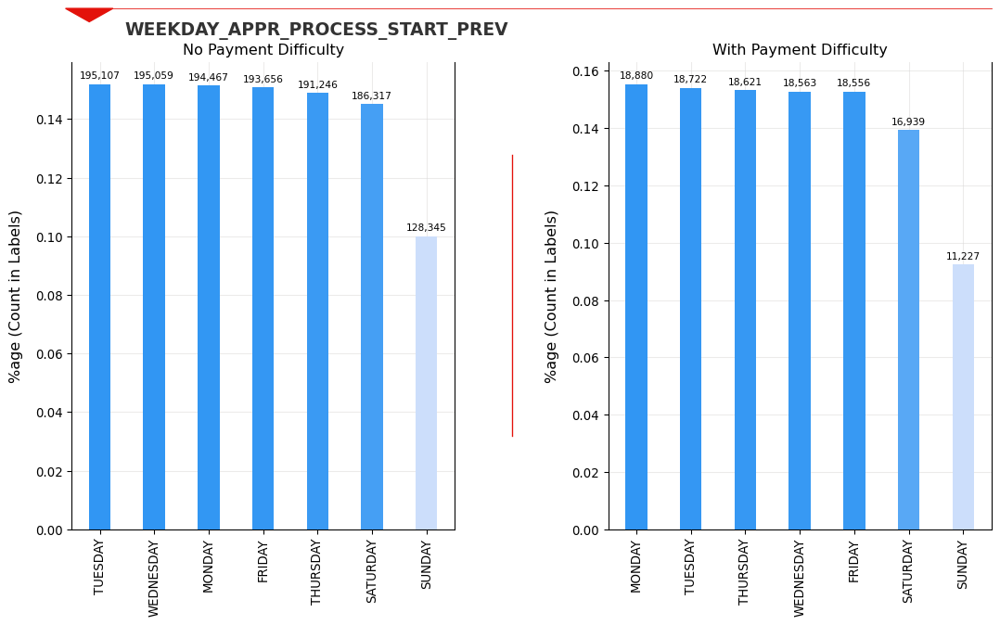

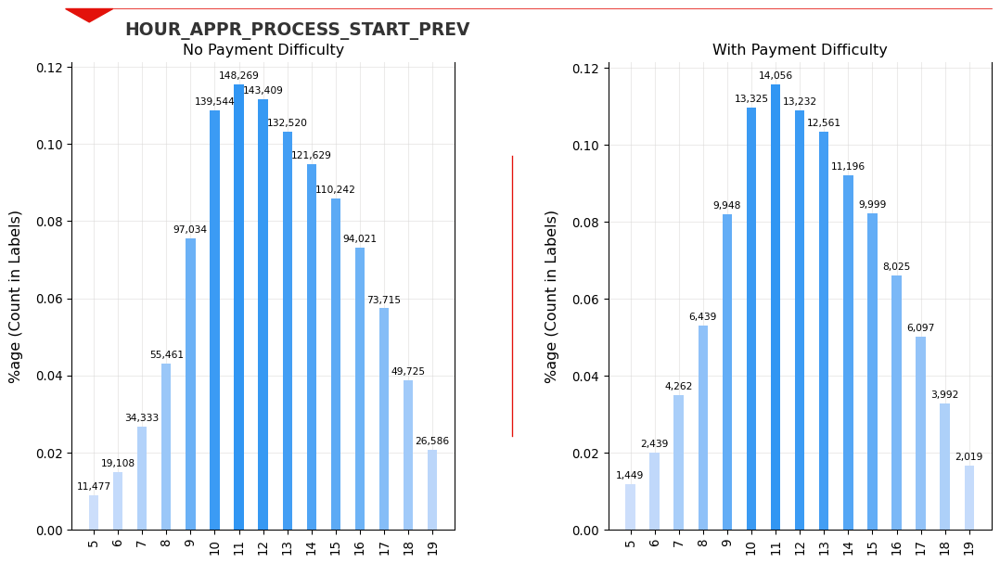

In [169]:
# Looping through all Categorical Variables
for col in col_prev_cate:
        drawCate(merge_inner, col)

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>NAME_PRODUCT_TYPE</b></li>
                    <ul>
                        <li>There is higher percentage of walk-in clients with ‘Payment difficulty’.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

#### Numerical Variables

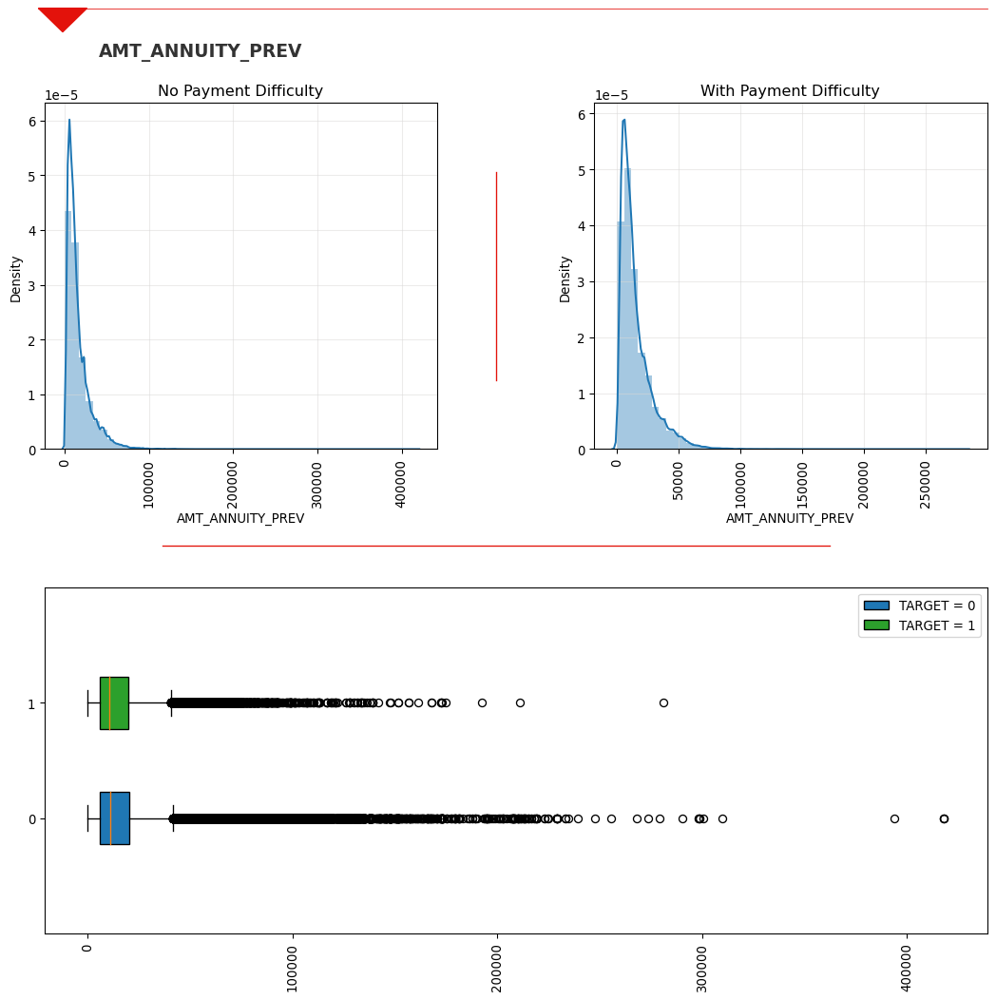

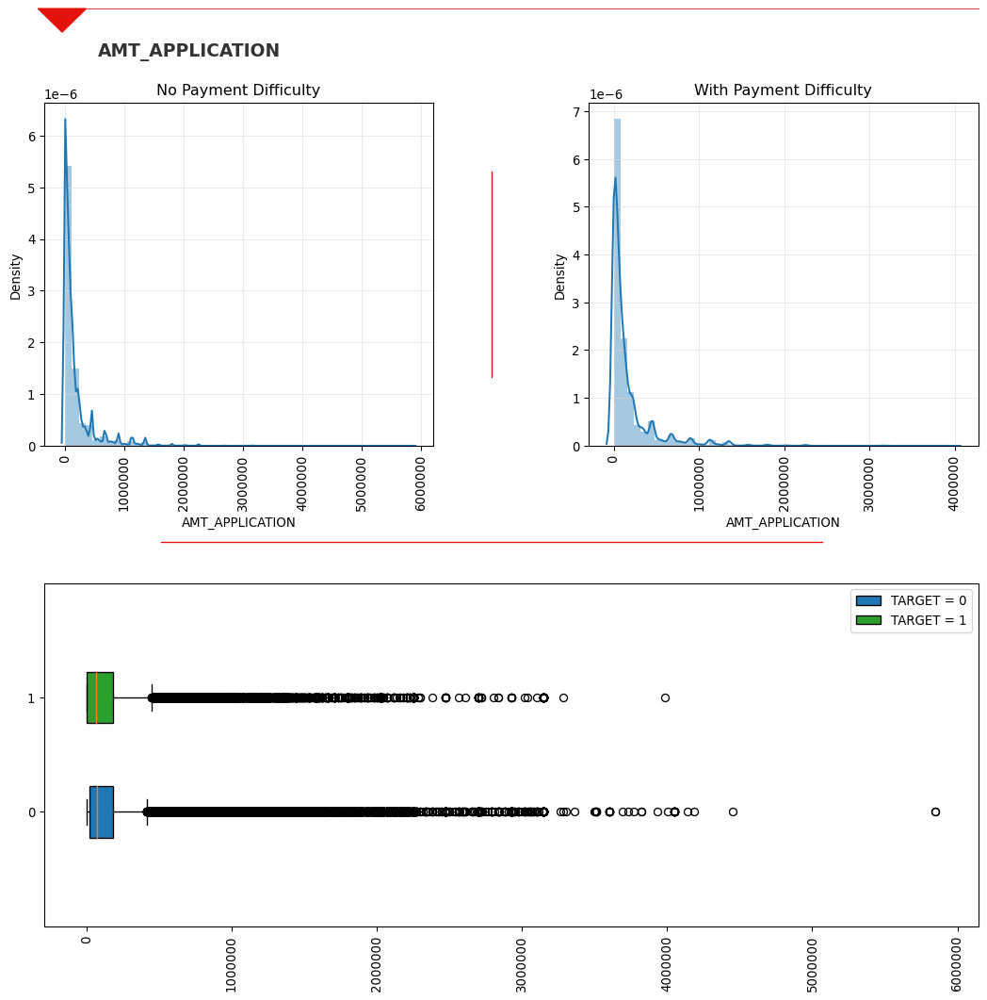

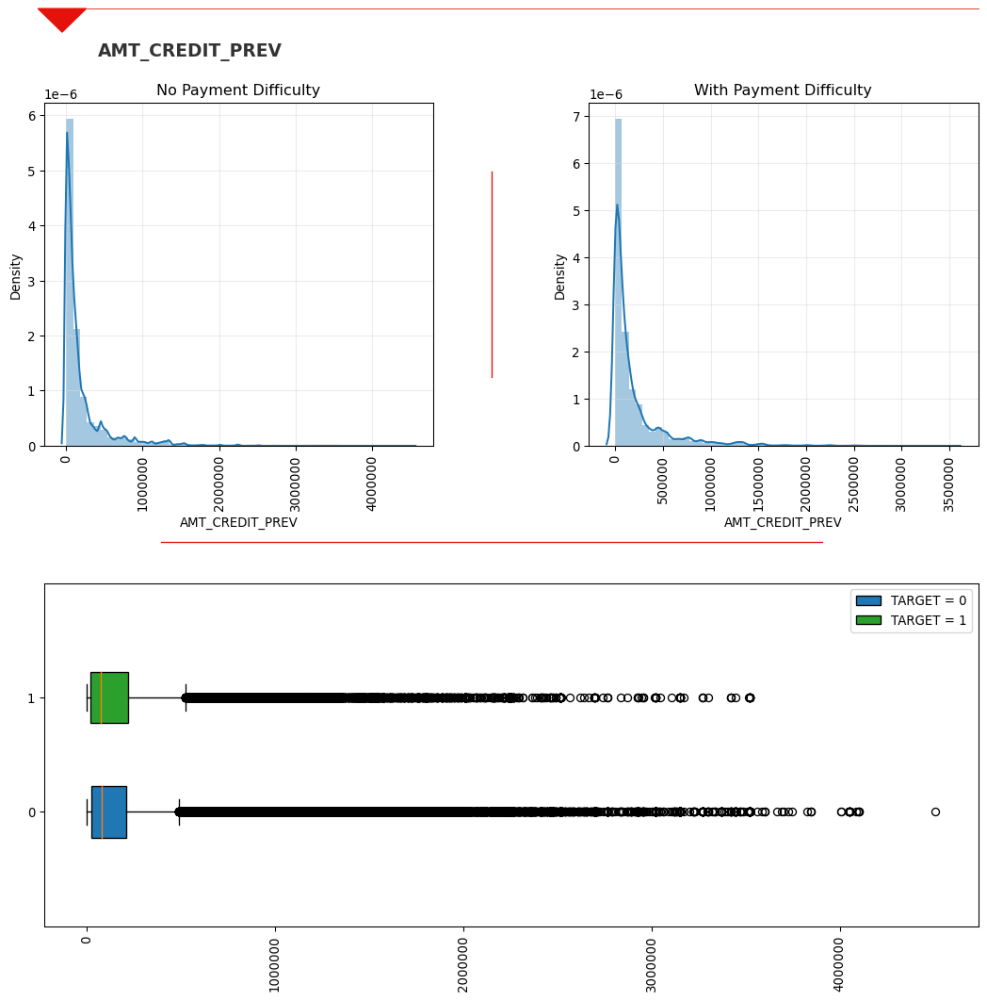

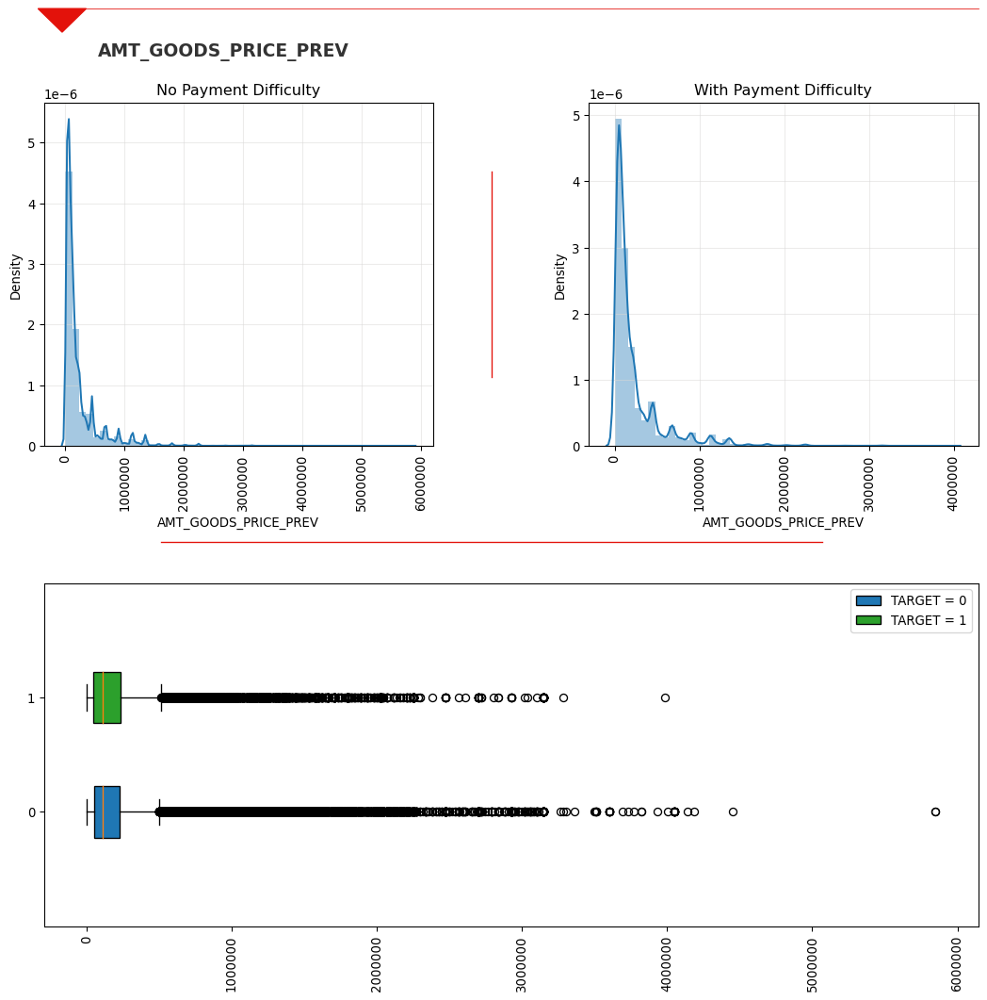

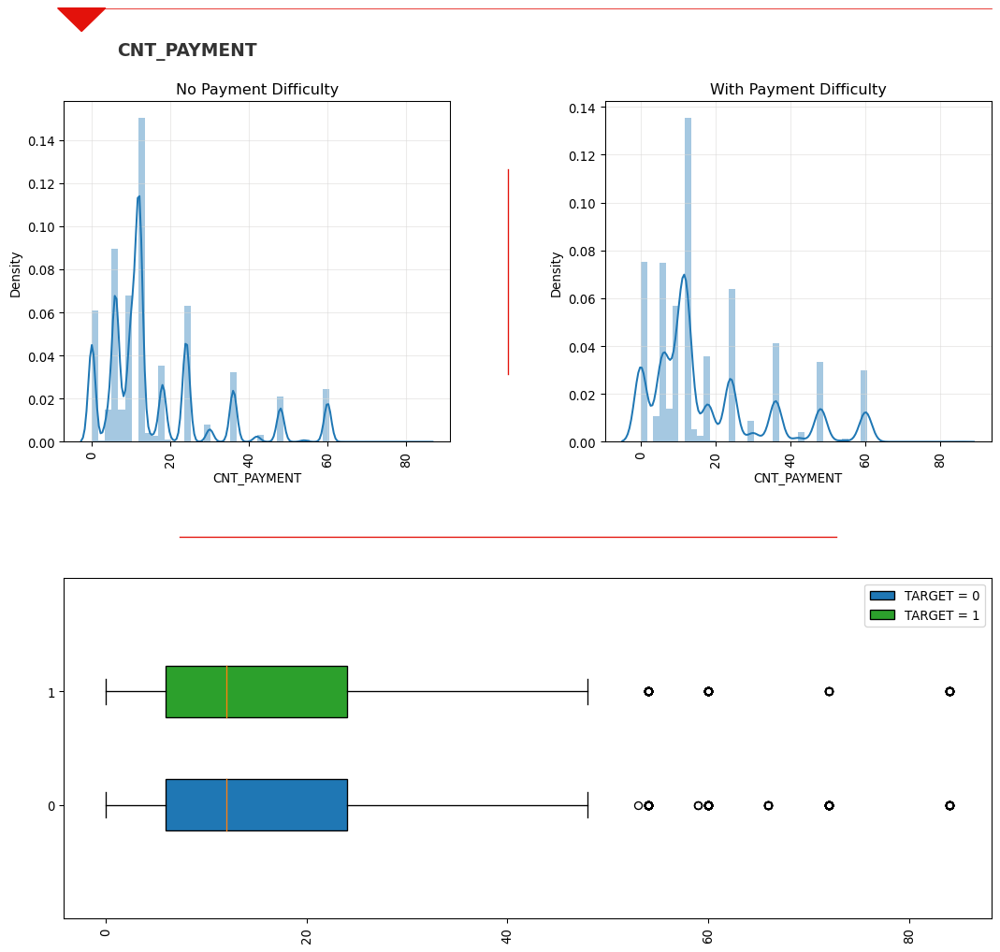

In [170]:
# Looping through all Numerical Variables
for col in col_prev_numr:
    drawNumr(merge_inner, col)

# <font color='#00008B'>Outlier Handling (Merged Dataset)</font>

#### For AMT_ANNUITY_PREV

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_ANNUITY_PREV to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [171]:
AMT_ANNUITY_PREV_CAP = round(merge_inner.AMT_ANNUITY_PREV.quantile(.999))
AMT_ANNUITY_PREV_CAP

119231

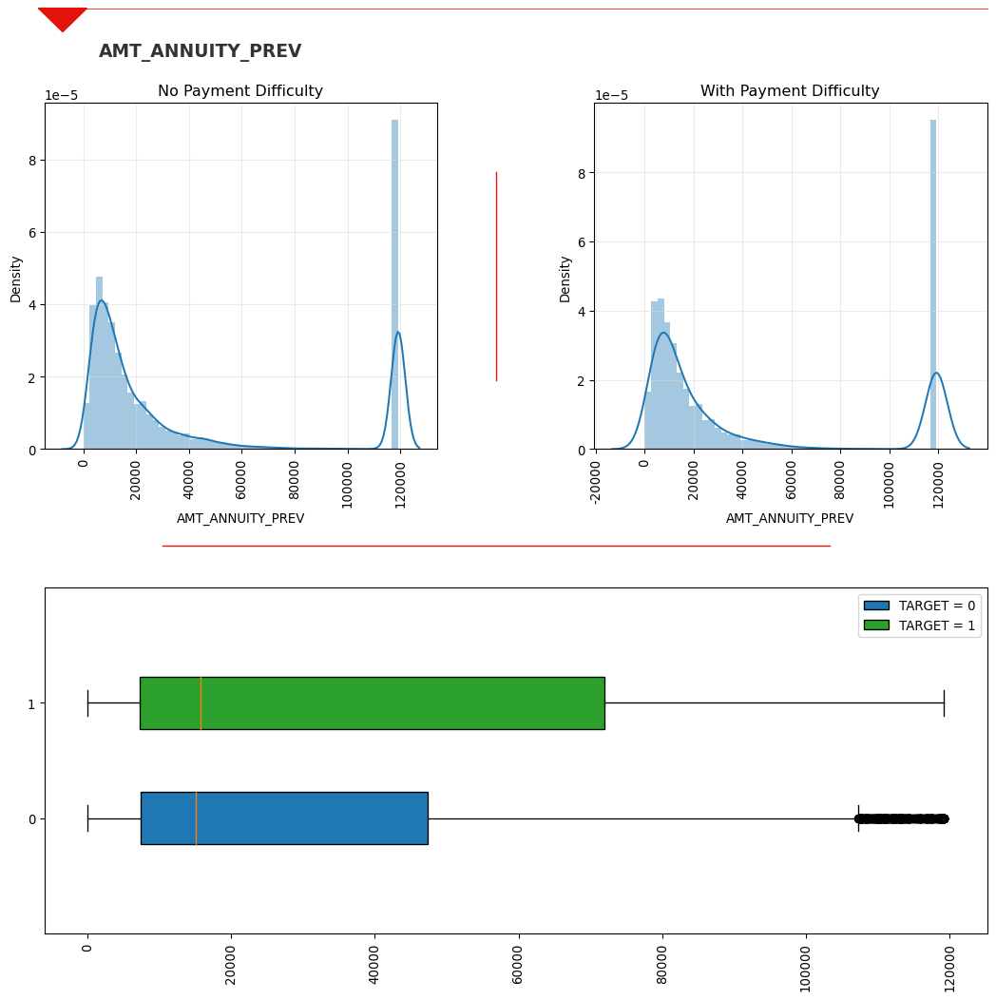

In [172]:
merge_inner.AMT_ANNUITY_PREV = merge_inner.AMT_ANNUITY_PREV.apply(lambda x: x if x < AMT_ANNUITY_PREV_CAP else AMT_ANNUITY_PREV_CAP)
drawNumr(merge_inner, 'AMT_ANNUITY_PREV')

#### For AMT_APPLICATION

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_APPLICATION to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [173]:
AMT_APPLICATION_CAP = round(merge_inner.AMT_APPLICATION.quantile(.999))
AMT_APPLICATION_CAP

2250000

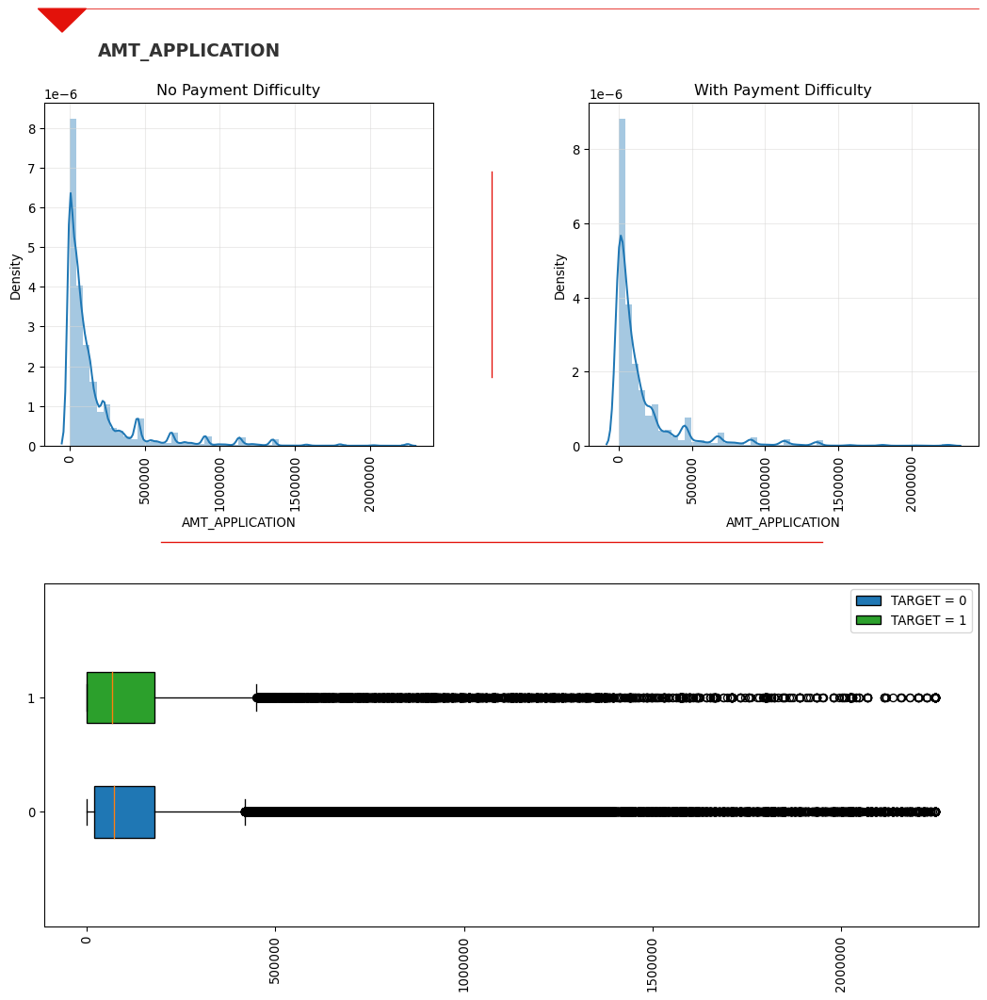

In [174]:
merge_inner.AMT_APPLICATION = merge_inner.AMT_APPLICATION.apply(lambda x: x if x < AMT_APPLICATION_CAP else AMT_APPLICATION_CAP)
drawNumr(merge_inner, 'AMT_APPLICATION')

#### For AMT_CREDIT_PREV

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_CREDIT_PREV to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [175]:
AMT_CREDIT_PREV_CAP = round(merge_inner.AMT_CREDIT_PREV.quantile(.999))
AMT_CREDIT_PREV_CAP

2517300

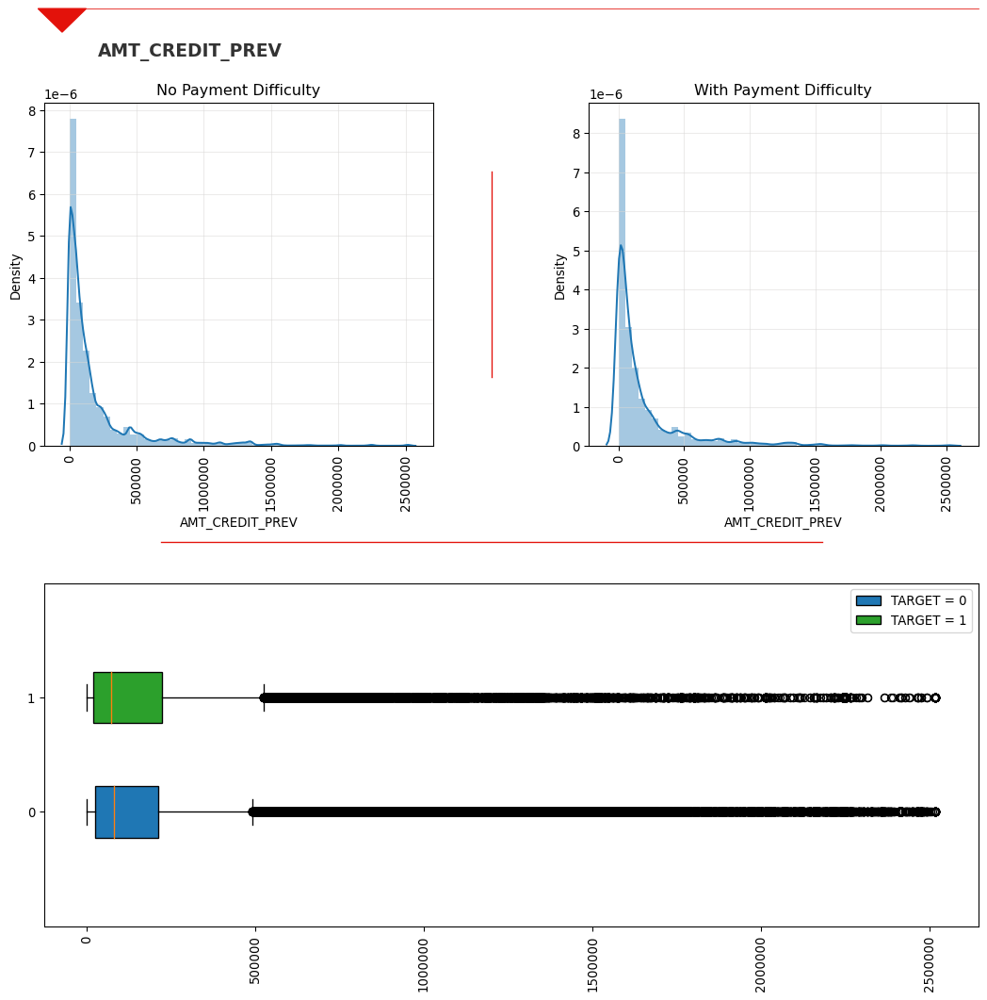

In [176]:
merge_inner.AMT_CREDIT_PREV = merge_inner.AMT_CREDIT_PREV.apply(lambda x: x if x < AMT_CREDIT_PREV_CAP else AMT_CREDIT_PREV_CAP)
drawNumr(merge_inner, 'AMT_CREDIT_PREV')

#### For AMT_GOODS_PRICE_PREV

<b><font color='blue'>Approach - Dataset Update:</font></b> After checking the charts, Capping the AMT_GOODS_PRICE_PREV to 99.9 percentile. Till this number there are values avaiable almost at continuity.

In [177]:
AMT_GOODS_PRICE_PREV_CAP = round(merge_inner.AMT_GOODS_PRICE_PREV.quantile(.999))
AMT_GOODS_PRICE_PREV_CAP

2250000

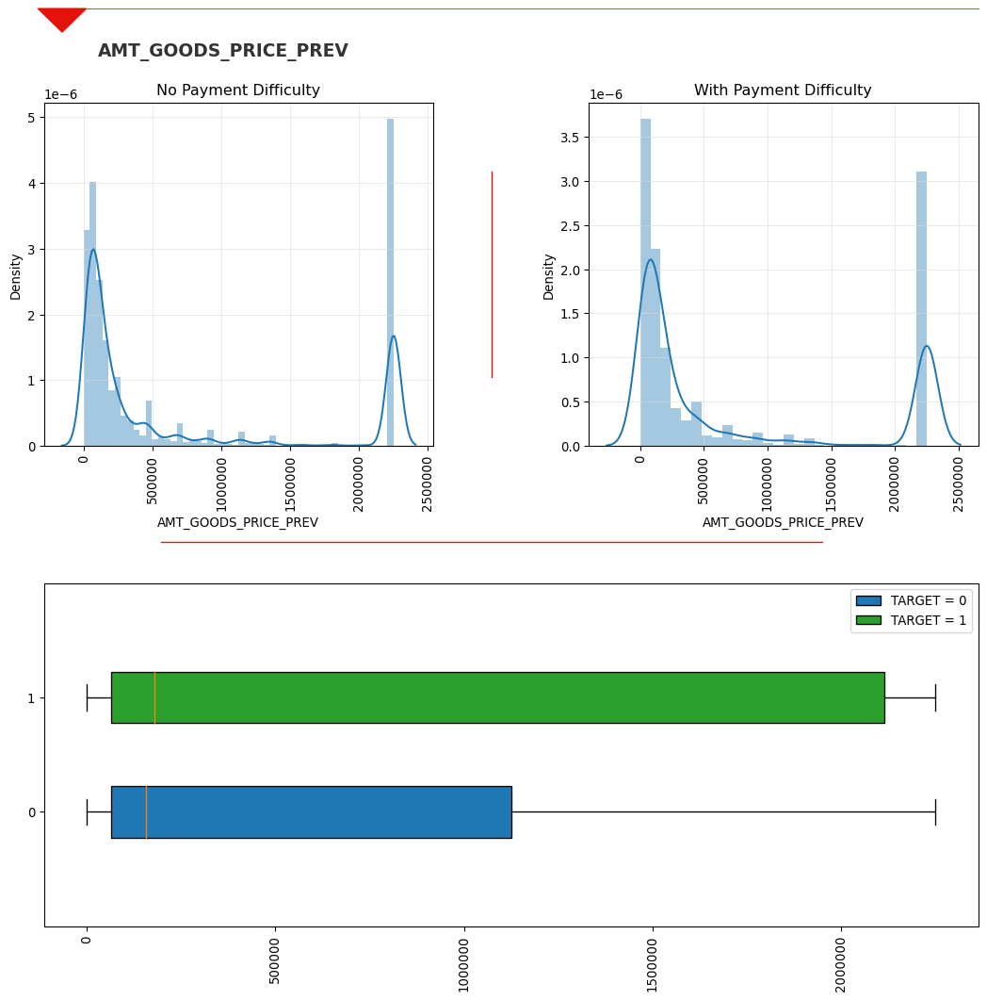

In [178]:
merge_inner.AMT_GOODS_PRICE_PREV = merge_inner.AMT_GOODS_PRICE_PREV.apply(lambda x: x if x < AMT_GOODS_PRICE_PREV_CAP else AMT_GOODS_PRICE_PREV_CAP)
drawNumr(merge_inner, 'AMT_GOODS_PRICE_PREV')

# <font color='#00008B'>Correlation between Numerical Variables (Merged Dataset)</font>

In [179]:
merge_appl = [x for x in col_appl_numr if x not in ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']]
merge_appl.extend(['AMT_CREDIT_APPL', 'AMT_ANNUITY_APPL', 'AMT_GOODS_PRICE_APPL'])
merge_numr = merge_appl + col_prev_numr
merge_numr

['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'YEARS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'DAYS_LAST_PHONE_CHANGE',
 'EXT_SOURCE',
 'AMT_REQ_CREDIT_BUREAU_MON_CUMM',
 'AMT_CREDIT_APPL',
 'AMT_ANNUITY_APPL',
 'AMT_GOODS_PRICE_APPL',
 'AMT_ANNUITY_PREV',
 'AMT_APPLICATION',
 'AMT_CREDIT_PREV',
 'AMT_GOODS_PRICE_PREV',
 'CNT_PAYMENT']

In [180]:
# Correlation Matrix
numr_corr = merge_inner[merge_numr].corr()
numr_corr

,CNT_CHILDREN,AMT_INCOME_TOTAL,YEARS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,EXT_SOURCE,AMT_REQ_CREDIT_BUREAU_MON_CUMM,AMT_CREDIT_APPL,AMT_ANNUITY_APPL,AMT_GOODS_PRICE_APPL,AMT_ANNUITY_PREV,AMT_APPLICATION,AMT_CREDIT_PREV,AMT_GOODS_PRICE_PREV,CNT_PAYMENT
CNT_CHILDREN,1.000000,0.023241,-0.365517,0.250611,0.188532,-0.012788,0.005980,0.877859,0.009814,-0.075791,-0.009566,0.003303,0.030075,-0.000554,-0.027678,-0.034877,-0.035600,-0.041217,-0.055970
AMT_INCOME_TOTAL,0.023241,1.000000,-0.057151,0.114182,0.063805,0.034063,-0.150981,0.028893,-0.063895,0.073670,0.072664,0.380044,0.463078,0.382769,0.092069,0.159964,0.158938,0.084822,0.048605
YEARS_BIRTH,-0.365517,-0.057151,1.000000,-0.669388,-0.326399,-0.261755,-0.006196,-0.327497,-0.090987,0.270735,-0.002750,0.047643,-0.029459,0.045945,0.042031,0.081179,0.079518,0.071844,0.125420
DAYS_EMPLOYED,0.250611,0.114182,-0.669388,1.000000,0.250493,0.276026,-0.006247,0.237861,0.053251,-0.163962,0.015925,0.010465,0.073407,0.007317,-0.011201,-0.031762,-0.027424,-0.029304,-0.082186
DAYS_REGISTRATION,0.188532,0.063805,-0.326399,0.250493,1.000000,0.102259,-0.018456,0.182369,0.058933,-0.132892,-0.009163,0.009445,0.046381,0.011508,-0.003552,-0.013615,-0.013541,-0.015193,-0.033127
DAYS_ID_PUBLISH,-0.012788,0.034063,-0.261755,0.276026,0.102259,1.000000,0.001439,0.002474,0.082926,-0.112577,-0.017012,0.009028,0.030512,0.006254,0.003823,-0.012319,-0.010625,-0.006887,-0.028867
OWN_CAR_AGE,0.005980,-0.150981,-0.006196,-0.006247,-0.018456,0.001439,1.000000,-0.016928,0.019430,-0.060913,-0.025574,-0.078159,-0.089550,-0.087285,-0.028986,-0.057008,-0.055349,-0.063780,-0.022556
CNT_FAM_MEMBERS,0.877859,0.028893,-0.327497,0.237861,0.182369,0.002474,-0.016928,1.000000,-0.010962,-0.054399,-0.006834,0.064121,0.085615,0.062250,-0.017948,-0.005901,-0.005534,-0.024511,-0.034180
DAYS_LAST_PHONE_CHANGE,0.009814,-0.063895,-0.090987,0.053251,0.058933,0.082926,0.019430,-0.010962,1.000000,-0.213311,-0.035846,-0.087318,-0.063206,-0.091250,0.026098,-0.054468,-0.059670,0.001671,-0.038302
EXT_SOURCE,-0.075791,0.073670,0.270735,-0.163962,-0.132892,-0.112577,-0.060913,-0.054399,-0.213311,1.000000,0.026120,0.129235,0.100618,0.137283,-0.014847,0.048274,0.045599,-0.003107,-0.010416


#### Corr Heatmap

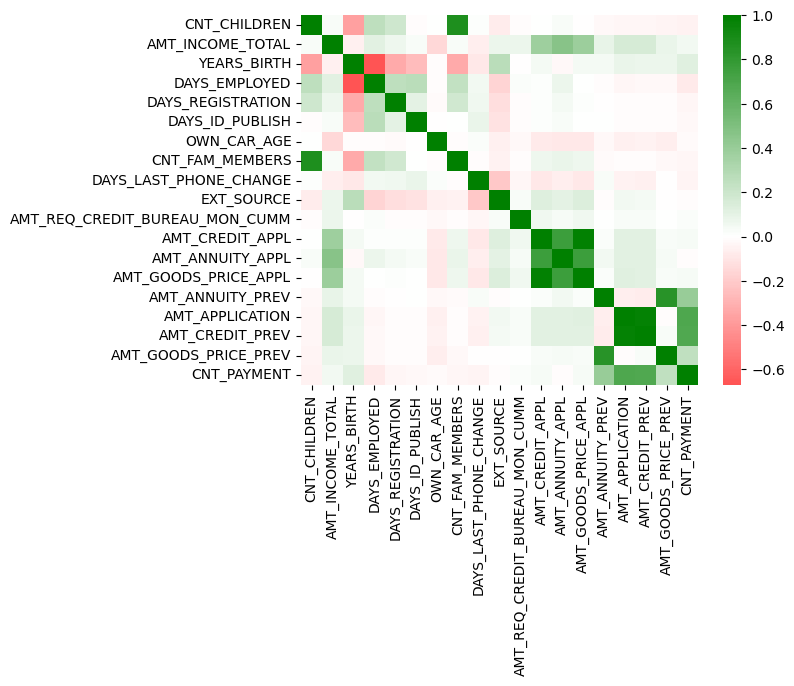

In [181]:
# Red / Green Color Map
cmap_corr = mpl.colors.LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256)

# Plotting Heatmap
sns.heatmap(numr_corr, cmap=cmap_corr, center=0)
plt.show()

In [182]:
# Calculating Top10
data = []
for i in range(len(merge_numr)):
    for j in range(i+1, len(merge_numr)):
        if ((merge_numr[i] in merge_appl) and (merge_numr[j] in merge_appl)) == False:
            row = []
            row.append(merge_numr[i])
            row.append(merge_numr[j])
            row.append(numr_corr[merge_numr[i]][merge_numr[j]])
            data.append(row)
df_prev = pd.DataFrame(data)

# Sorting
lookupcomb2 = df_prev.sort_values(by=[2], key=lambda x: abs(x), ascending=False).reset_index()
lookupcomb2

,index,0,1,2
0,74,AMT_APPLICATION,AMT_CREDIT_PREV,0.977922
1,72,AMT_ANNUITY_PREV,AMT_GOODS_PRICE_PREV,0.832325
2,76,AMT_APPLICATION,CNT_PAYMENT,0.689862
3,78,AMT_CREDIT_PREV,CNT_PAYMENT,0.684633
4,73,AMT_ANNUITY_PREV,CNT_PAYMENT,0.406109
5,79,AMT_GOODS_PRICE_PREV,CNT_PAYMENT,0.249490
6,6,AMT_INCOME_TOTAL,AMT_APPLICATION,0.159964
7,7,AMT_INCOME_TOTAL,AMT_CREDIT_PREV,0.158938
8,14,YEARS_BIRTH,CNT_PAYMENT,0.125420
9,66,AMT_GOODS_PRICE_APPL,AMT_APPLICATION,0.121208


# <font color='#00008B'>Bivariant Analysis - Numerical vs Numerical (Merged Dataset)</font>

In [183]:
lookupcomb2 = lookupcomb2[[0, 1]]
lookupcomb2.reset_index(drop=True, inplace=True)
lookupcomb2

,0,1
0,AMT_APPLICATION,AMT_CREDIT_PREV
1,AMT_ANNUITY_PREV,AMT_GOODS_PRICE_PREV
2,AMT_APPLICATION,CNT_PAYMENT
3,AMT_CREDIT_PREV,CNT_PAYMENT
4,AMT_ANNUITY_PREV,CNT_PAYMENT
5,AMT_GOODS_PRICE_PREV,CNT_PAYMENT
6,AMT_INCOME_TOTAL,AMT_APPLICATION
7,AMT_INCOME_TOTAL,AMT_CREDIT_PREV
8,YEARS_BIRTH,CNT_PAYMENT
9,AMT_GOODS_PRICE_APPL,AMT_APPLICATION


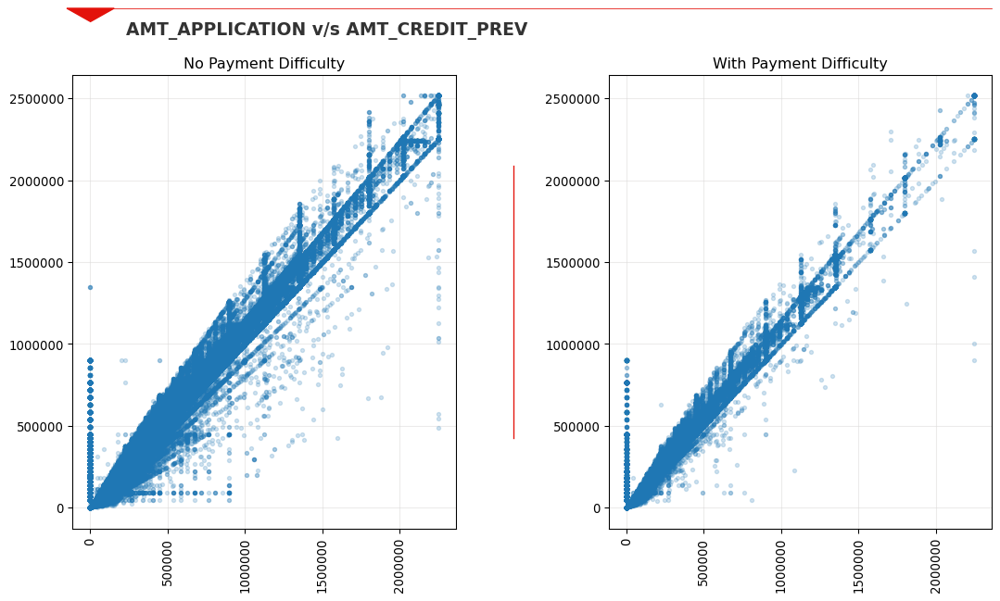

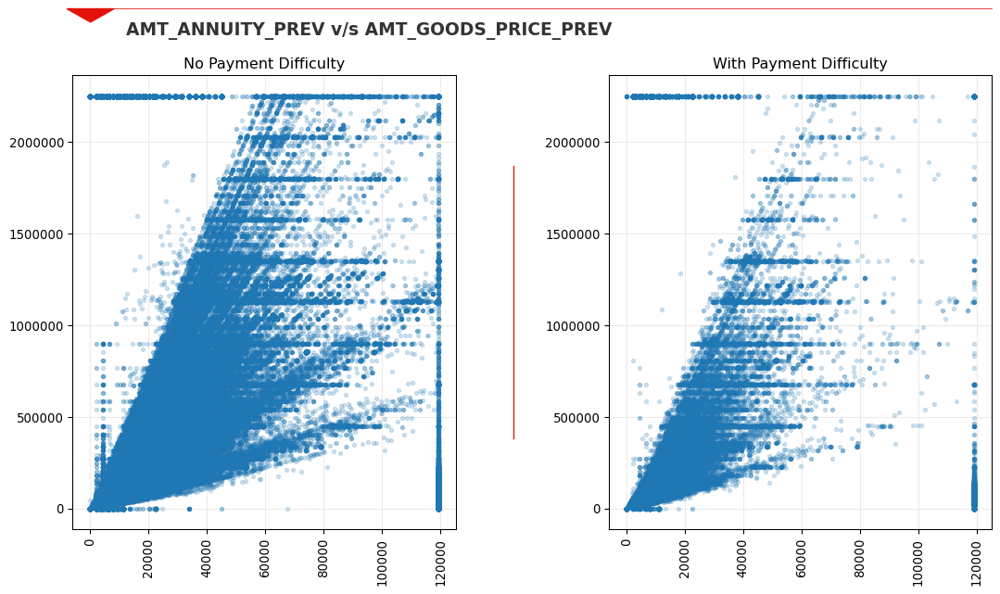

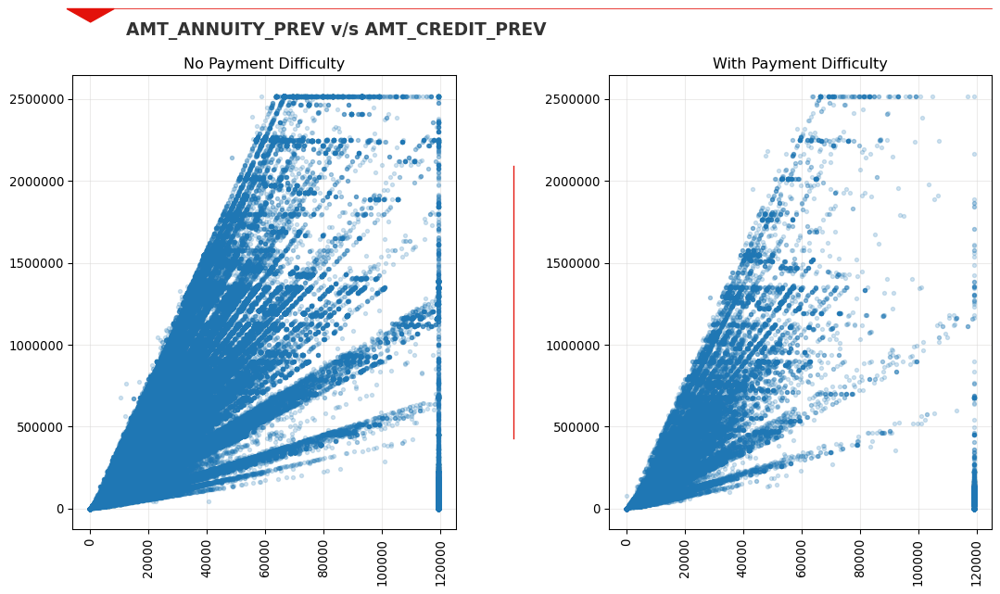

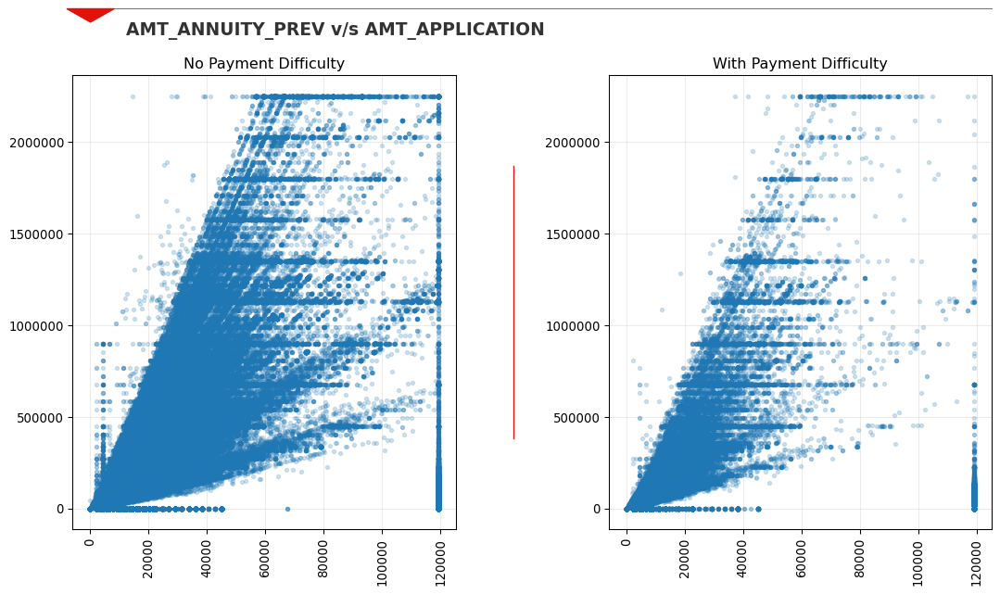

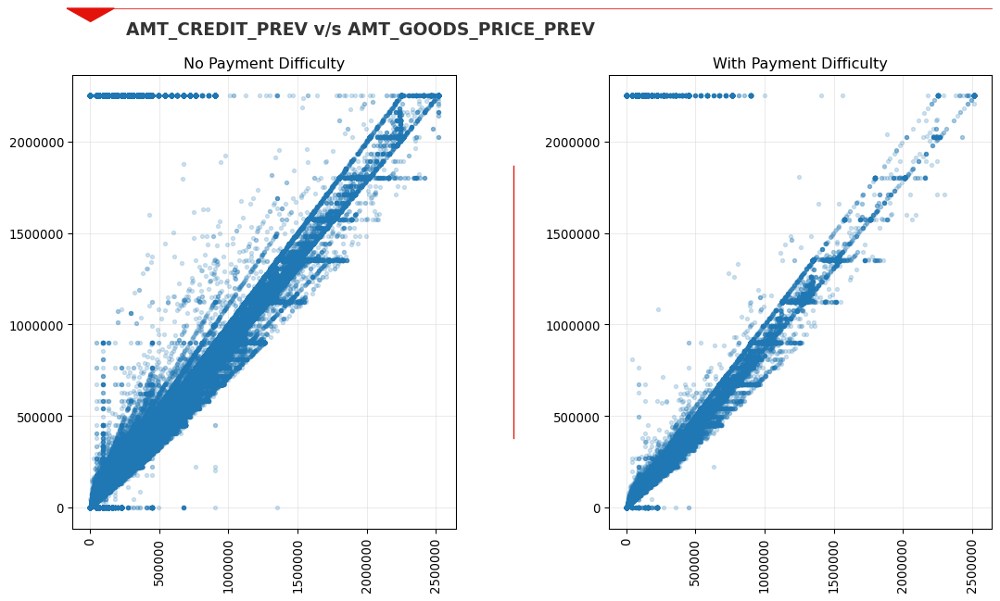

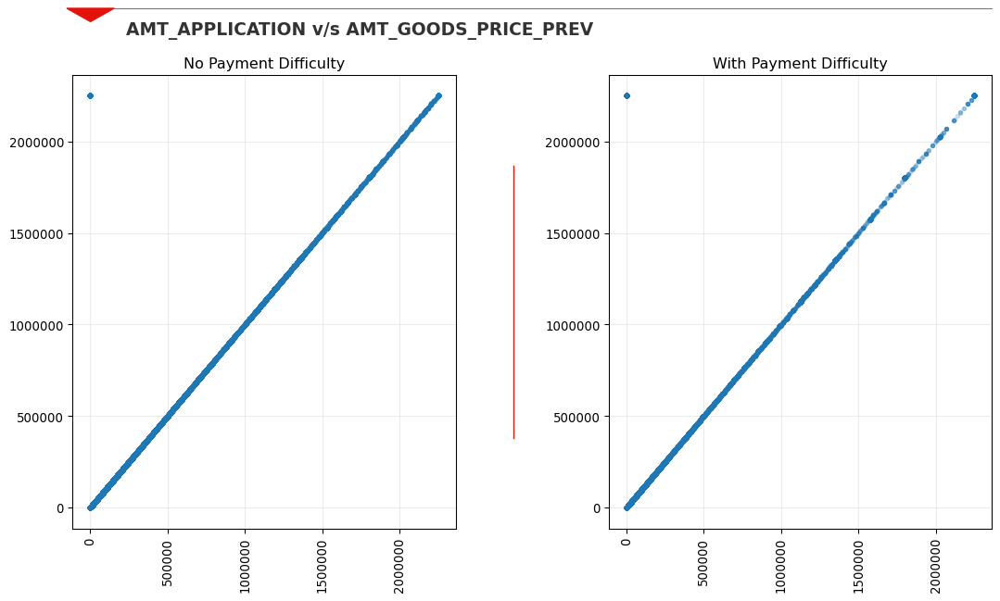

In [184]:
lookupcomb2 = lookupcomb2.head(0)[[0,1]]
lookupcomb2 = lookupcomb2.append([
                    ['AMT_APPLICATION', 'AMT_CREDIT_PREV'],
                    ['AMT_ANNUITY_PREV', 'AMT_GOODS_PRICE_PREV'],
                    ['AMT_ANNUITY_PREV', 'AMT_CREDIT_PREV'],
                    ['AMT_ANNUITY_PREV', 'AMT_APPLICATION'],
                    ['AMT_CREDIT_PREV', 'AMT_GOODS_PRICE_PREV'],
                    ['AMT_APPLICATION', 'AMT_GOODS_PRICE_PREV']
                    ])
lookupcomb2.reset_index(drop=True, inplace=True)

# Looping through Bivariant Analysis - Numerical vs Numerical
for ind in lookupcomb2.index:
    drawNumrBi(merge_inner, lookupcomb2[0][ind], lookupcomb2[1][ind])

# <font color='#00008B'>Bivariant Analysis - Categorical vs Categorical (Merged Dataset)</font>

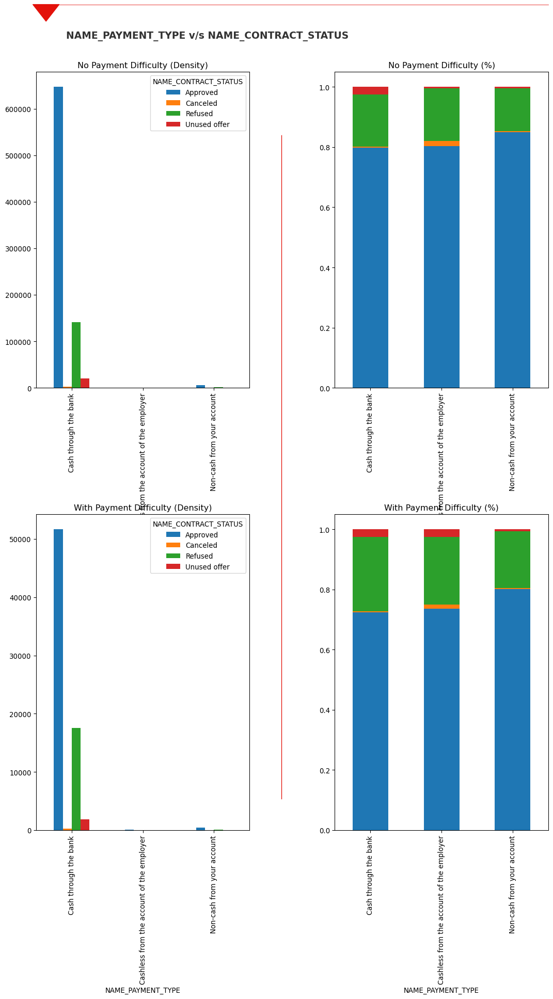

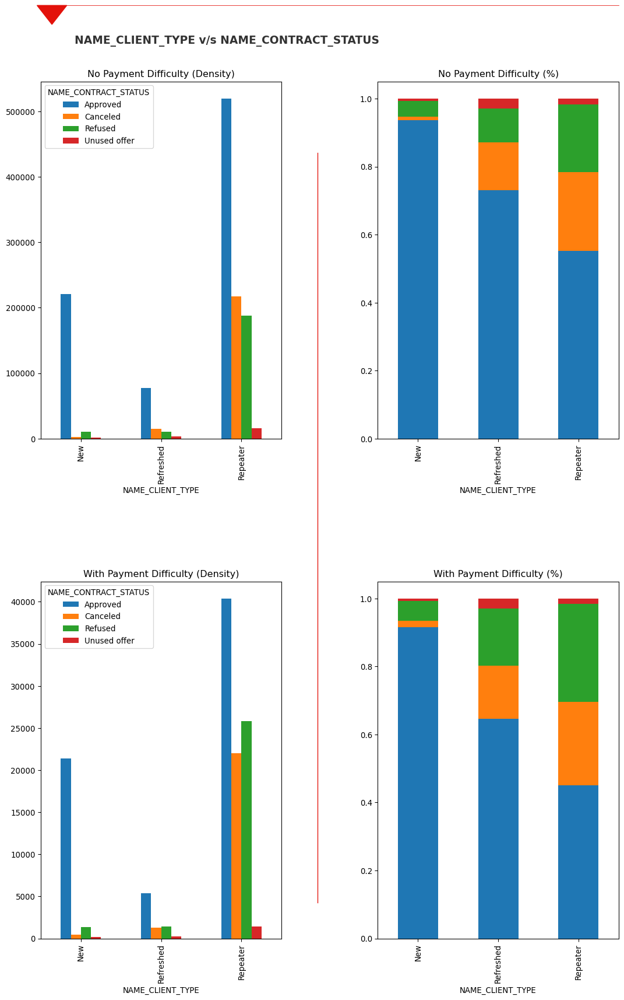

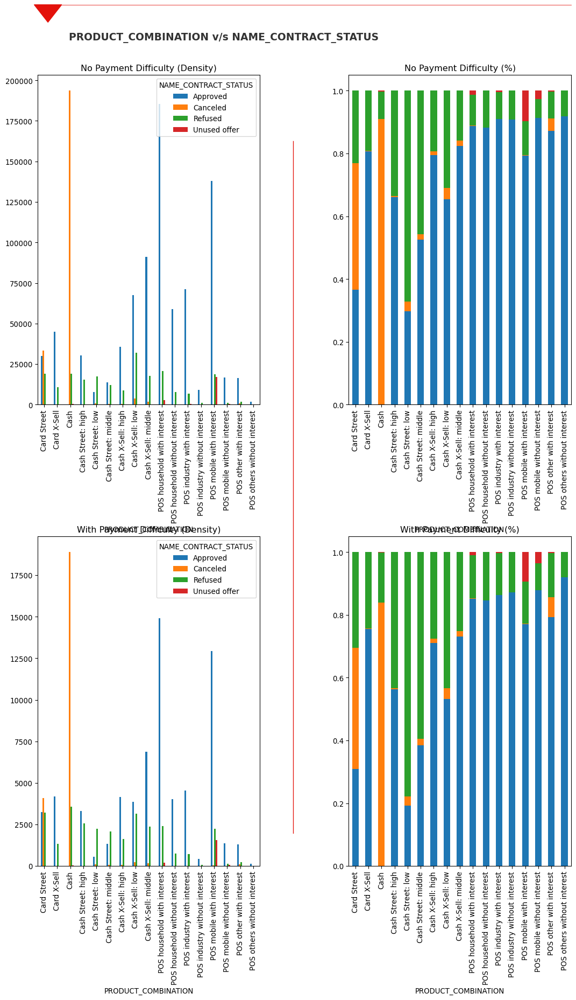

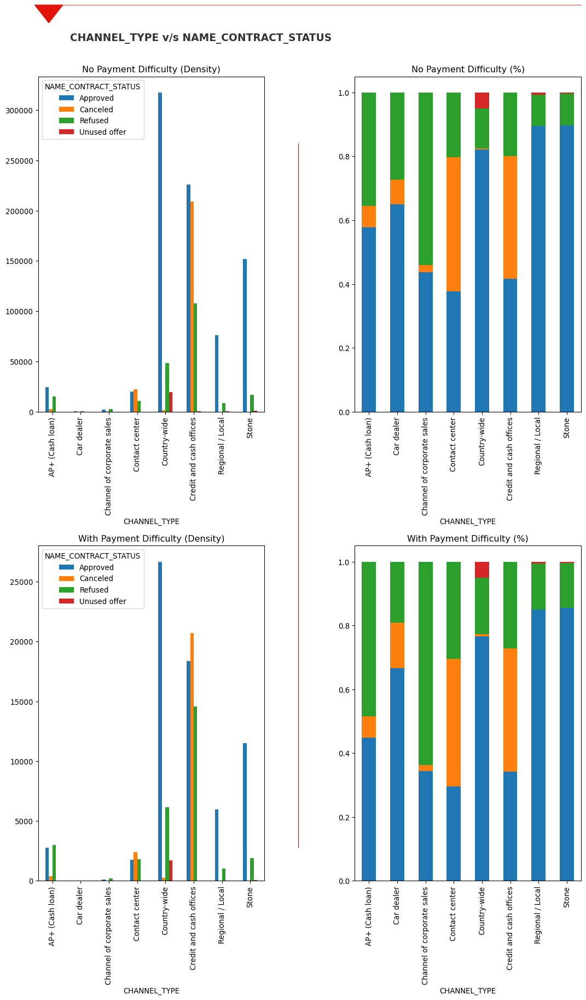

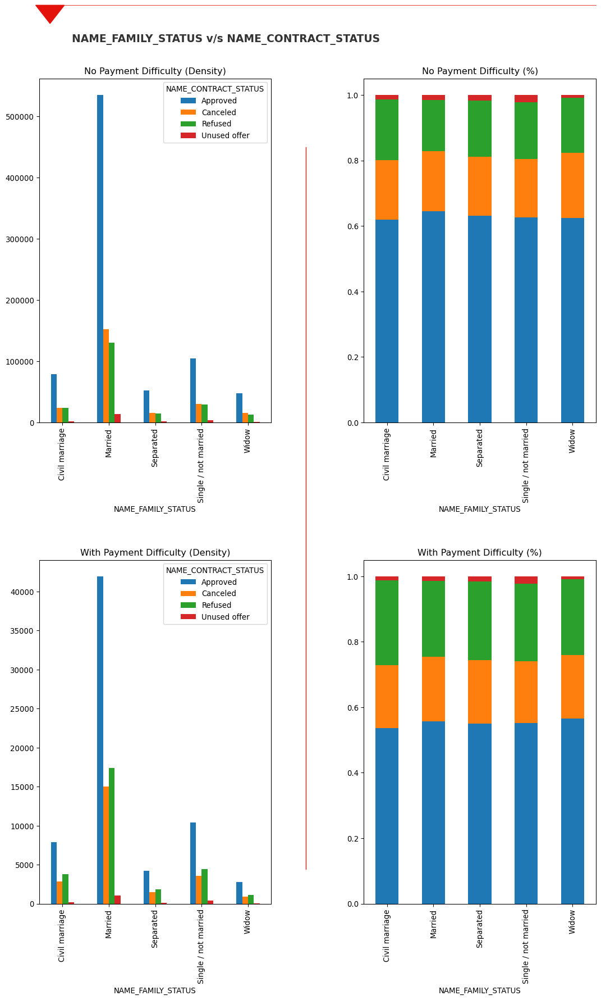

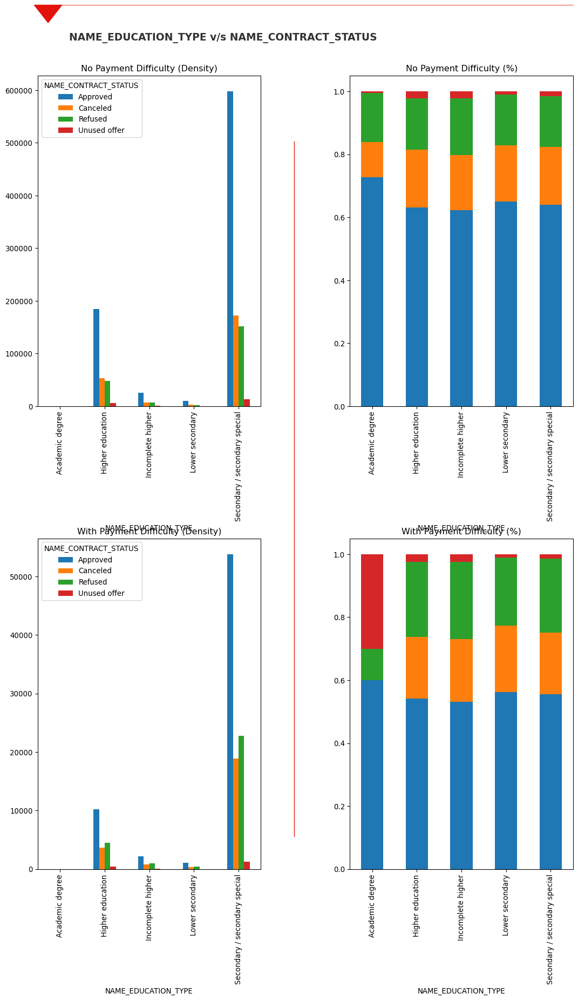

In [185]:
col_prev_cate_cate = [
    ['NAME_PAYMENT_TYPE', 'NAME_CONTRACT_STATUS'], 
    ['NAME_CLIENT_TYPE', 'NAME_CONTRACT_STATUS'], 
    ['PRODUCT_COMBINATION', 'NAME_CONTRACT_STATUS'], 
    ['CHANNEL_TYPE', 'NAME_CONTRACT_STATUS'], 
    ['NAME_FAMILY_STATUS', 'NAME_CONTRACT_STATUS'], 
    ['NAME_EDUCATION_TYPE', 'NAME_CONTRACT_STATUS']
]

# Looping through Bivariant Analysis - Categorical vs Categorical
for entry in col_prev_cate_cate:
    drawCateBi(merge_inner, entry[0], entry[1])

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>NAME_PAYMENT_TYPE v/s NAME_CONTRACT_STATUS</b></li>
                    <ul>
                        <li>Client with NAME_PAYMENT_TYPE as ‘Cash through the bank’ have highest approval among all.</li>
                    </ul>
                <li><b>NAME_CLIENT_TYPE v/s NAME_CONTRACT_STATUS</b></li>
                    <ul>
                        <li>‘New’ clients have highest Approval in terms of percentage in same category.</li>
                        <li>‘Repeater’ clients have highest Approval in terms of count in all categories.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>

# <font color='#00008B'>Multivariant Analysis (Merged Dataset)</font>

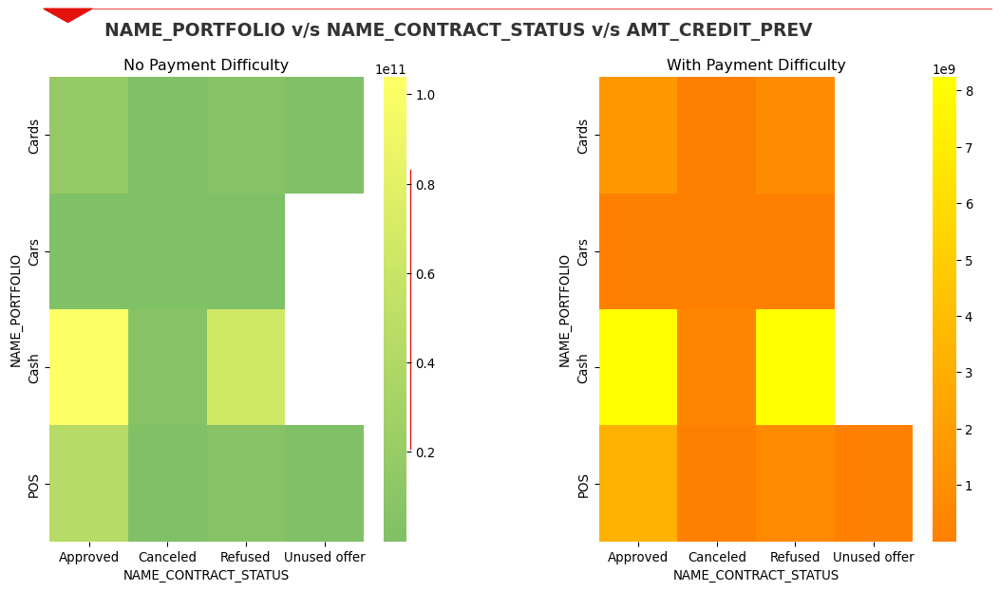

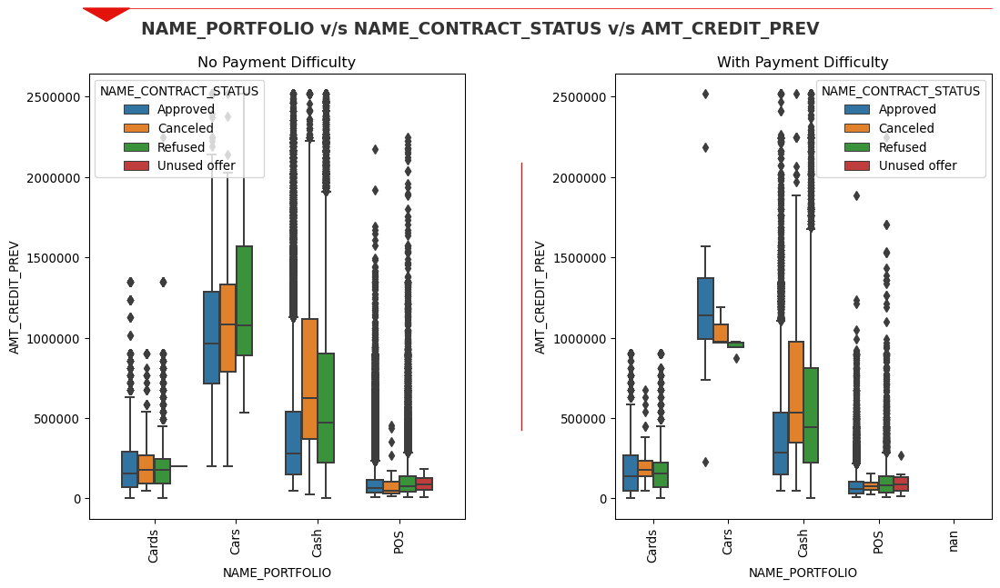

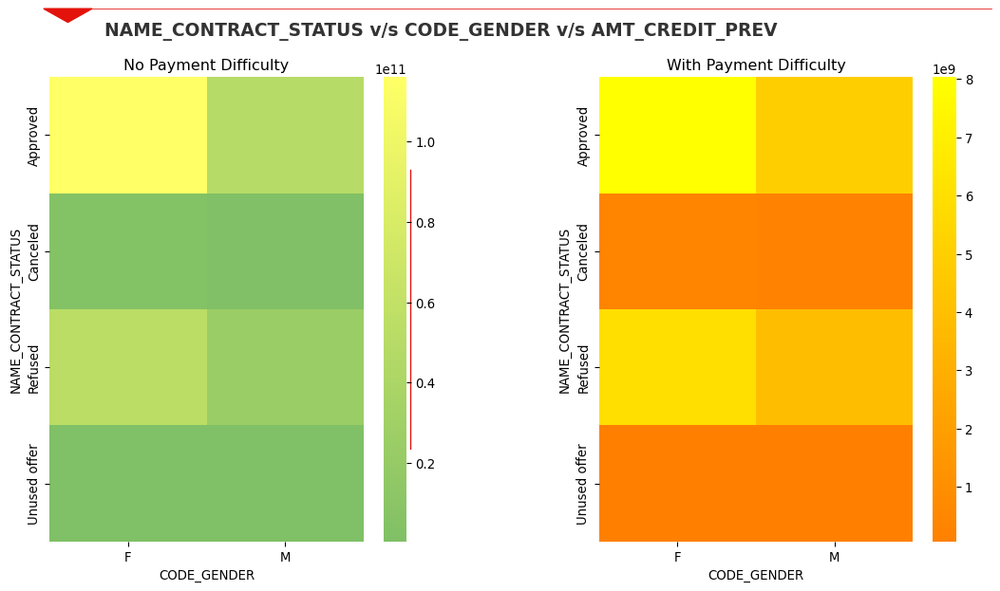

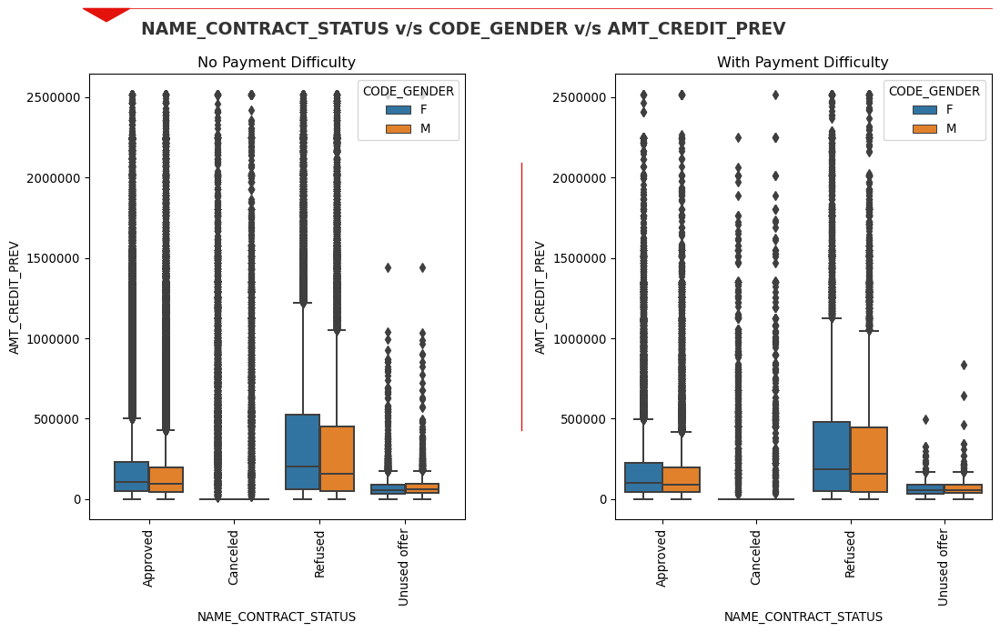

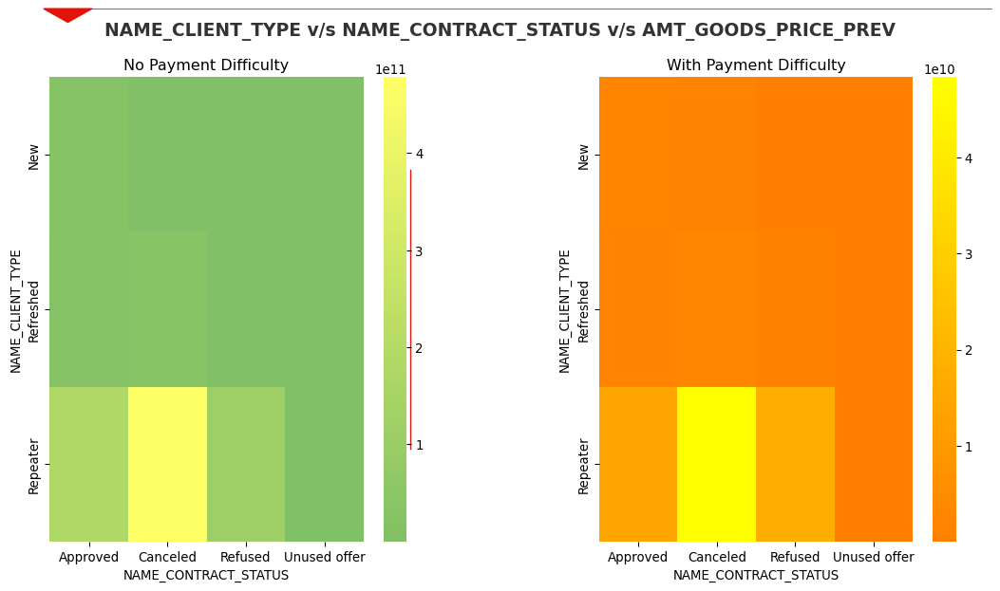

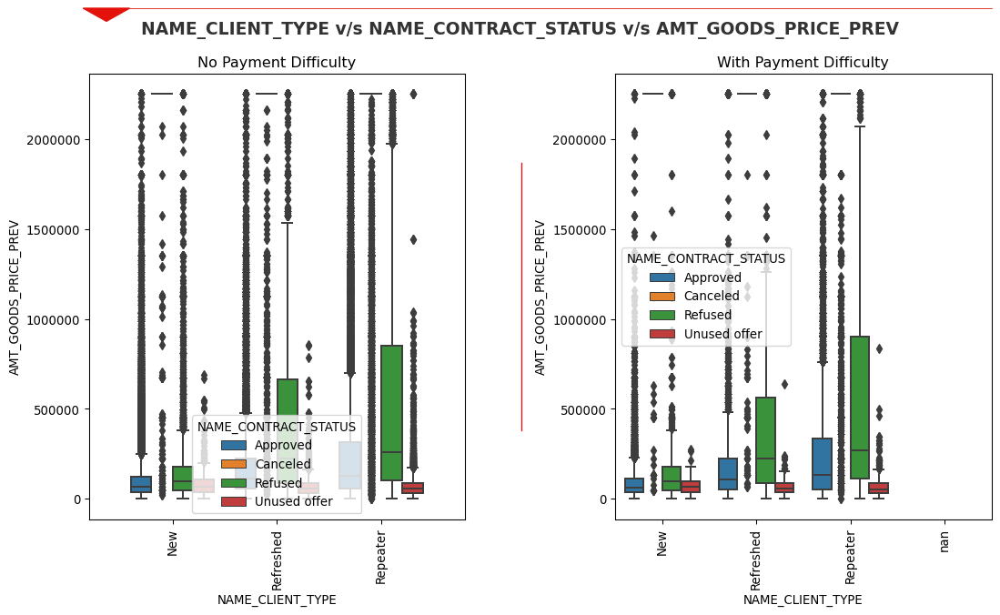

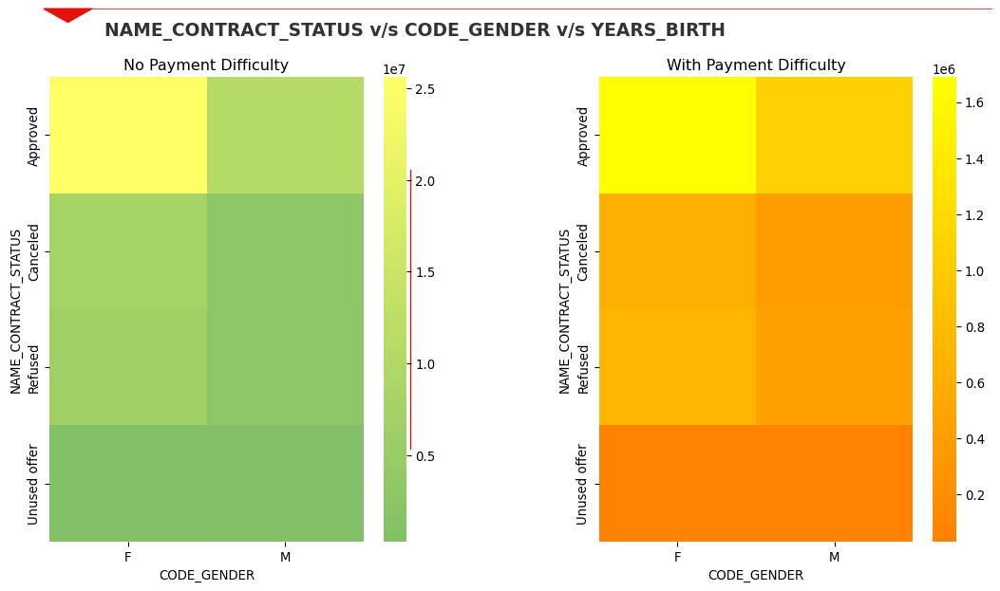

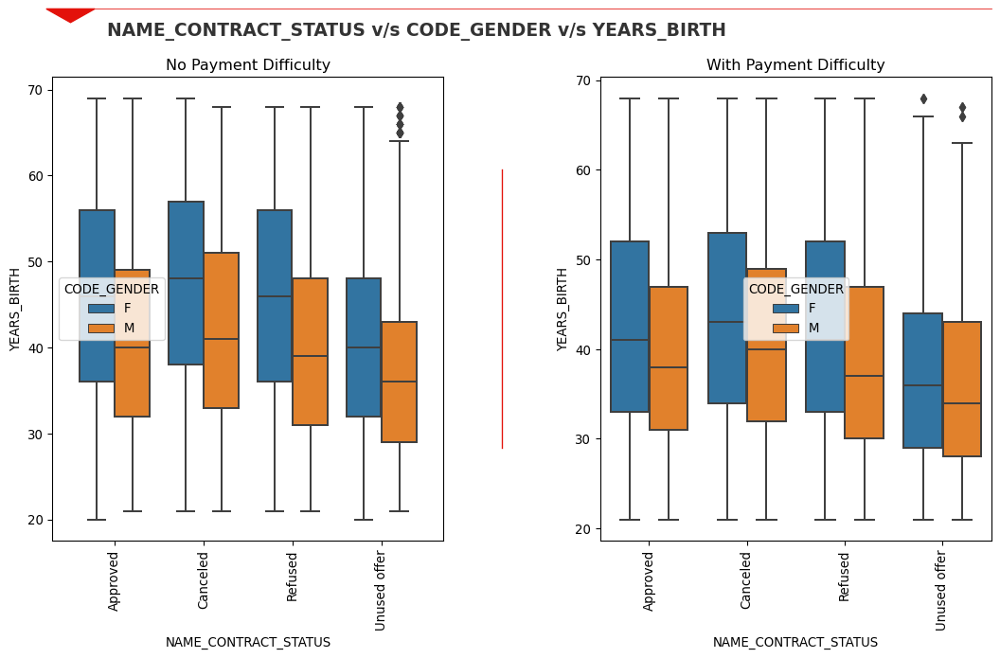

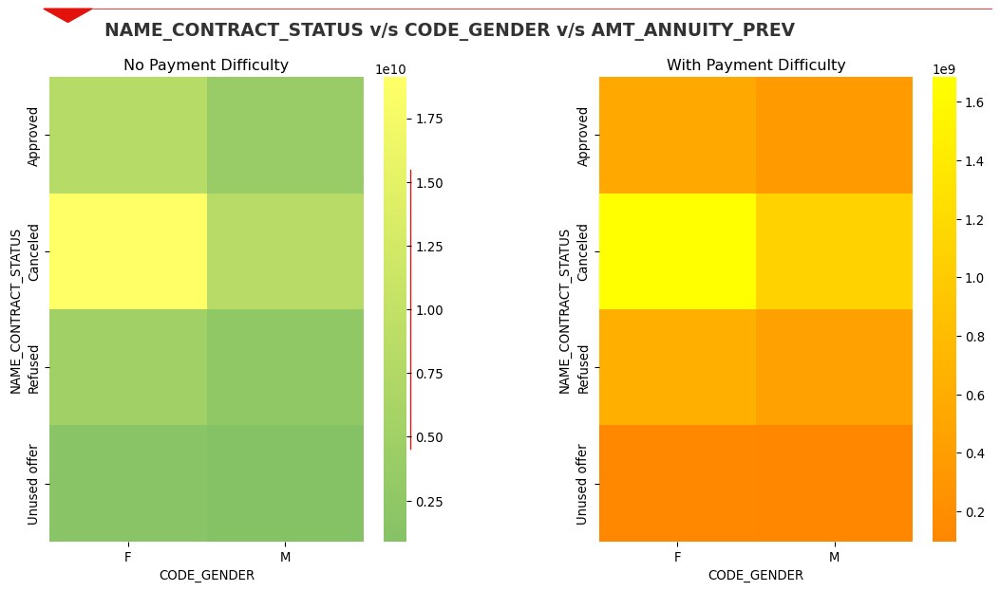

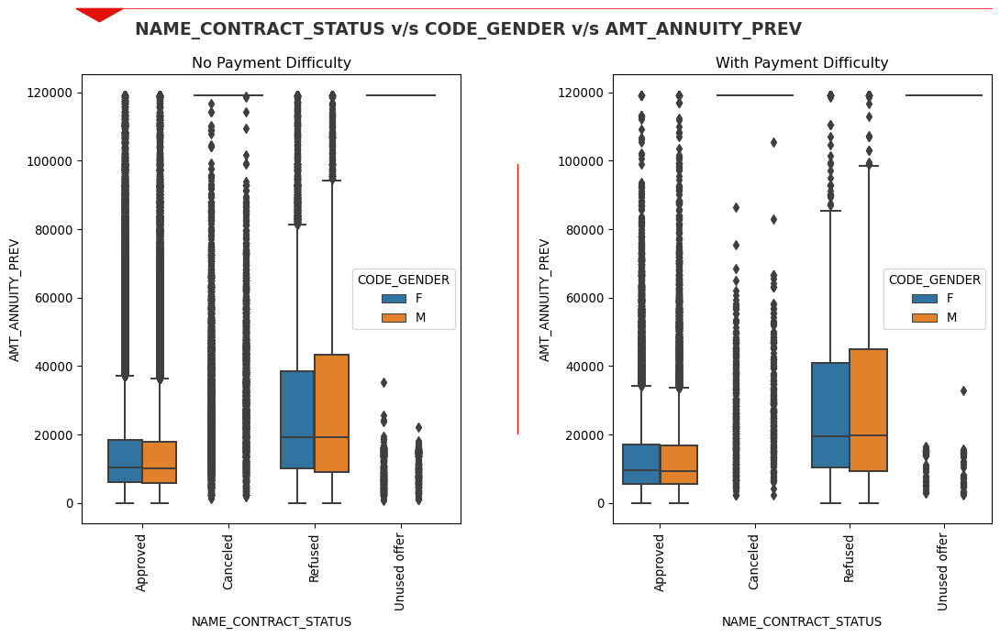

In [186]:
col_appl_cate_cate_numr_boxp = [
    ['NAME_PORTFOLIO', 'NAME_CONTRACT_STATUS', 'AMT_CREDIT_PREV'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'AMT_CREDIT_PREV'], 
    ['NAME_CLIENT_TYPE', 'NAME_CONTRACT_STATUS', 'AMT_GOODS_PRICE_PREV'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'YEARS_BIRTH'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'AMT_ANNUITY_PREV']
]
col_appl_cate_cate_numr_heat = [
    ['NAME_PORTFOLIO', 'NAME_CONTRACT_STATUS', 'AMT_CREDIT_PREV'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'AMT_CREDIT_PREV'], 
    ['NAME_CLIENT_TYPE', 'NAME_CONTRACT_STATUS', 'AMT_GOODS_PRICE_PREV'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'YEARS_BIRTH'], 
    ['NAME_CONTRACT_STATUS', 'CODE_GENDER', 'AMT_ANNUITY_PREV']
]

# Looping through Multivariant Analysis
for entry in col_appl_cate_cate_numr_heat:
    drawMultHeatmap(merge_inner, entry[0], entry[1], entry[2])
    drawMultBoxp(merge_inner, entry[0], entry[1], entry[2])

# <font color='#00008B'>Analysing TARGET with respect to DAYS_LAST_DUE, DAYS_TERMINATION for Approved Previous Applications</font>

In [187]:
# Merging dataset
df_target_days = merge_inner[merge_inner.NAME_CONTRACT_STATUS == 'Approved'][['SK_ID_CURR', 'TARGET', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 
                              'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']]

In [188]:
df_target_days.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 885457 entries, 0 to 1405704
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   SK_ID_CURR                 885457 non-null  int64  
 1   TARGET                     885457 non-null  int64  
 2   CNT_PAYMENT                885457 non-null  float64
 3   DAYS_FIRST_DRAWING         53463 non-null   float64
 4   DAYS_FIRST_DUE             818043 non-null  float64
 5   DAYS_LAST_DUE_1ST_VERSION  772943 non-null  float64
 6   DAYS_LAST_DUE              671342 non-null  float64
 7   DAYS_TERMINATION           658129 non-null  float64
dtypes: float64(6), int64(2)
memory usage: 60.8 MB


In [189]:
# Grouping SK_ID_CURR, TARGET for maximum Payment counts for previous applications and minimum first drawing, first due, 
# last due and termination for previous application against current ID.
df_target_days = df_target_days.groupby(['SK_ID_CURR', 'TARGET']).agg({'CNT_PAYMENT': 'max', 
                                                   'DAYS_FIRST_DRAWING': 'min', 
                                                   'DAYS_FIRST_DUE': 'min', 
                                                   'DAYS_LAST_DUE_1ST_VERSION': 'min', 
                                                   'DAYS_LAST_DUE': 'min', 
                                                   'DAYS_TERMINATION': 'min'})
df_target_days.reset_index(level=[0,1], inplace=True)
df_target_days

,SK_ID_CURR,TARGET,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
0,100002,1,24.0,NaN,-565.0,125.0,-25.0,-17.0
1,100003,0,12.0,NaN,-2310.0,-1980.0,-1980.0,-1976.0
2,100004,0,4.0,NaN,-784.0,-694.0,-724.0,-714.0
3,100006,0,48.0,NaN,-545.0,-215.0,-425.0,-416.0
4,100007,0,48.0,NaN,-2326.0,-2056.0,-2056.0,-2041.0
...,...,...,...,...,...,...,...,...
289993,456251,0,8.0,NaN,-210.0,0.0,-30.0,-25.0
289994,456252,0,6.0,NaN,-2466.0,-2316.0,-2316.0,-2311.0
289995,456253,0,6.0,NaN,-2812.0,-2722.0,-2722.0,-2713.0
289996,456254,1,16.0,NaN,-291.0,99.0,NaN,NaN


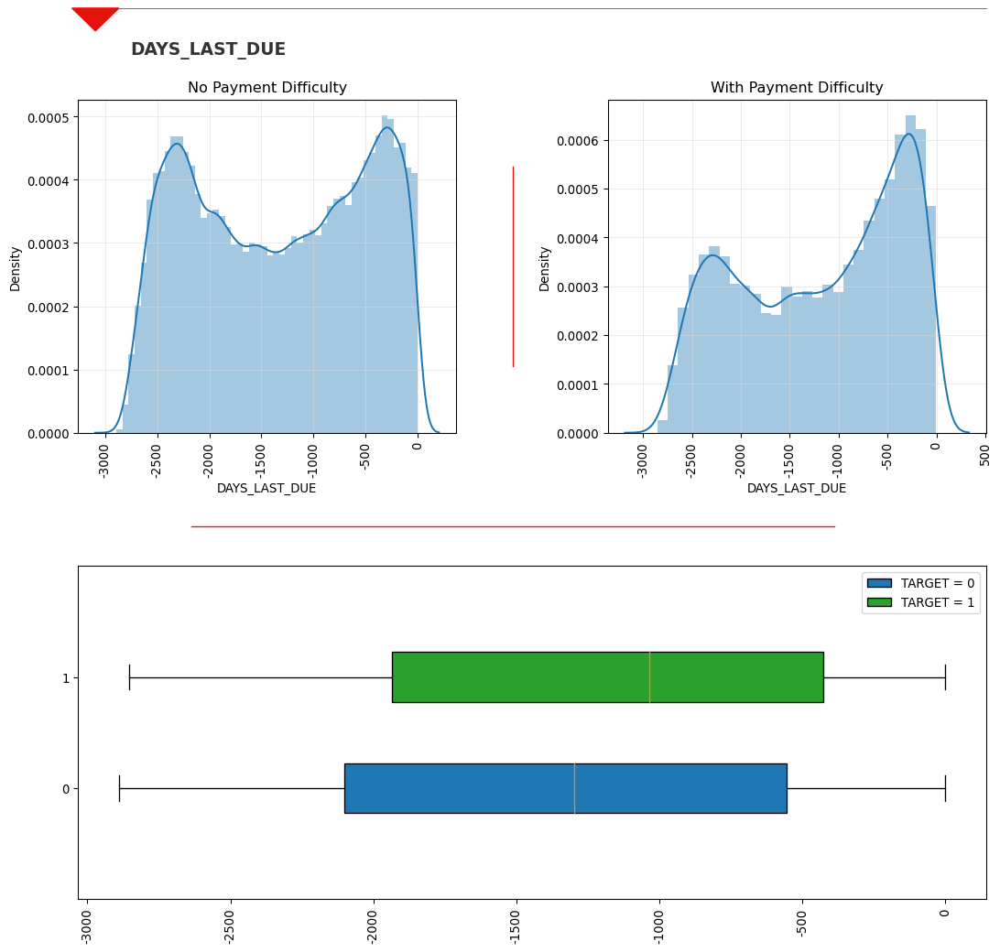

In [190]:
drawNumr(df_target_days, 'DAYS_LAST_DUE')

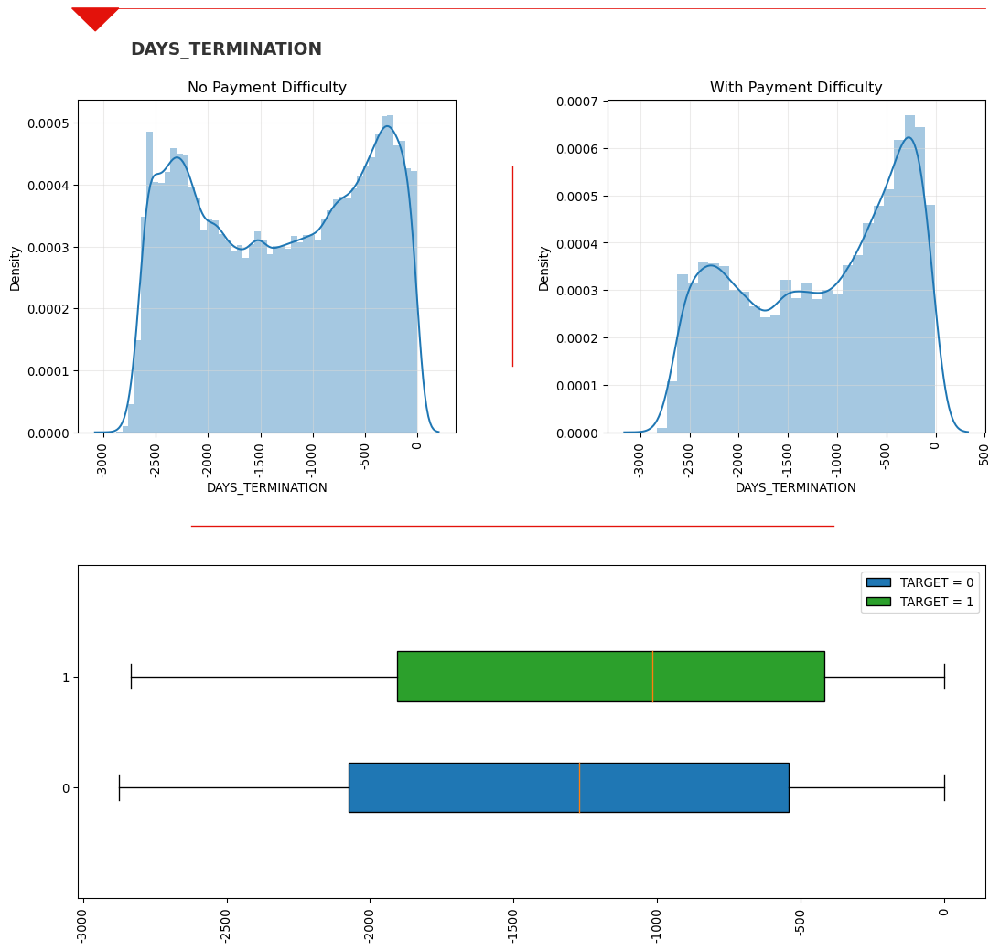

In [191]:
drawNumr(df_target_days, 'DAYS_TERMINATION')

<html>
    <body>
        <div style="background-color: #A4BCE4;font-size:14pt">
            <h2>Important Insight</h2>
            <ul>
                <li><b>DAYS_LAST_DUE</b></li>
                    <ul>
                        <li>The clients with larger relative DAYS_LAST_DUE have better chances of ‘No Payment Difficulty’.</li>
                    </ul>
                <li><b>DAYS_TERMINATION</b></li>
                    <ul>
                        <li>The clients with larger relative DAYS_TERMINATION have better chances of ‘No Payment Difficulty’.</li>
                    </ul>
            </ul>
            <br/>
        </div>
    </body>
</html>